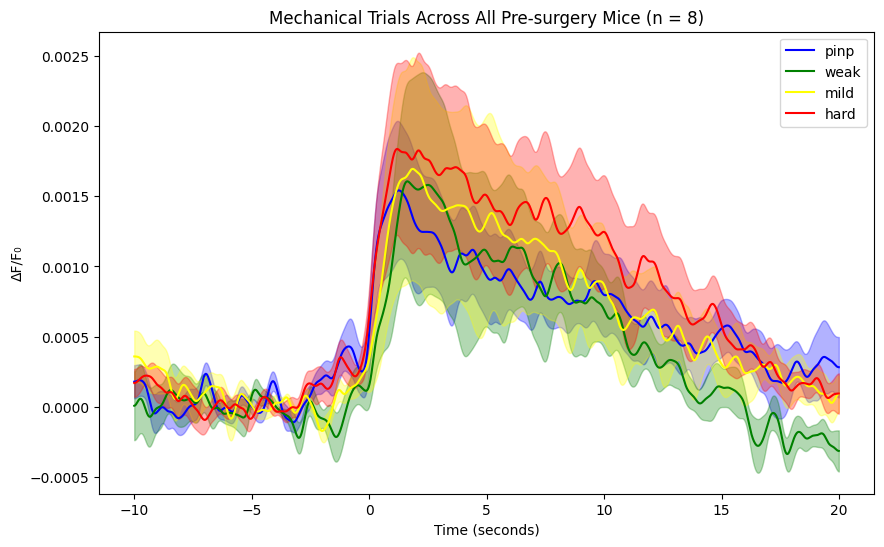

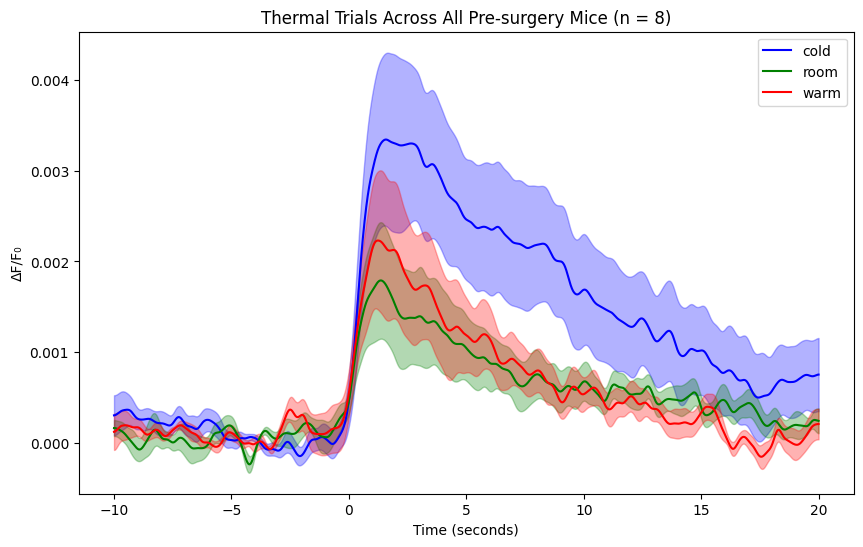

In [26]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# Path to the uploaded zip file
extract_folder_path = 'C:/files/data/sensory_stim/grabda/'  # Change this to your desired extraction path


# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Extracting trials for each animal
mechanical_data_no_zscore = extract_trials_per_animal(all_data, mechanical_trials)
thermal_data_no_zscore = extract_trials_per_animal(all_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculating average and SEM for mechanical and thermal trials
mechanical_avg_sem_no_zscore = calculate_avg_sem_across_animals(mechanical_data_no_zscore, mechanical_trials)
thermal_avg_sem_no_zscore = calculate_avg_sem_across_animals(thermal_data_no_zscore, thermal_trials)

# Defining custom color codes for each trial type
color_codes = {
    'average_trace_cold': 'blue',
    'average_trace_room': 'green',
    'average_trace_warm': 'red',
    'average_trace_pinp': 'blue',
    'average_trace_weak': 'green',
    'average_trace_mild': 'yellow',
    'average_trace_hard': 'red'
}

# Modified plotting function with custom color codes
def plot_trials_with_colors(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-10, 20, 1/sampling_rate)
    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')  # Default color is black if not specified
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('ΔF/F₀')
    plt.legend()
    plt.show()

# Plotting the trials
plot_trials_with_colors(mechanical_avg_sem_no_zscore, "Mechanical Trials Across All Pre-surgery Mice (n = 8)", 130, color_codes)
plot_trials_with_colors(thermal_avg_sem_no_zscore, "Thermal Trials Across All Pre-surgery Mice (n = 8)", 130, color_codes)


Normalization to Peak Amp in Cold trial

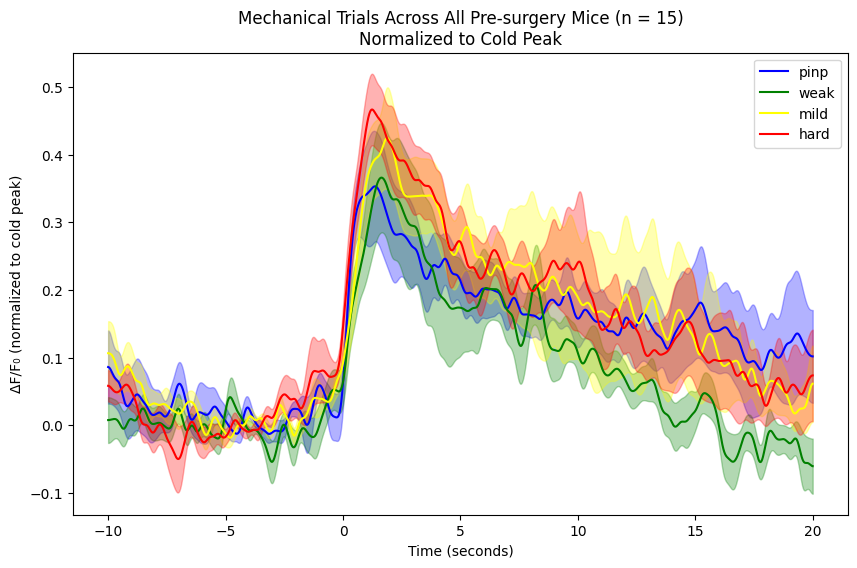

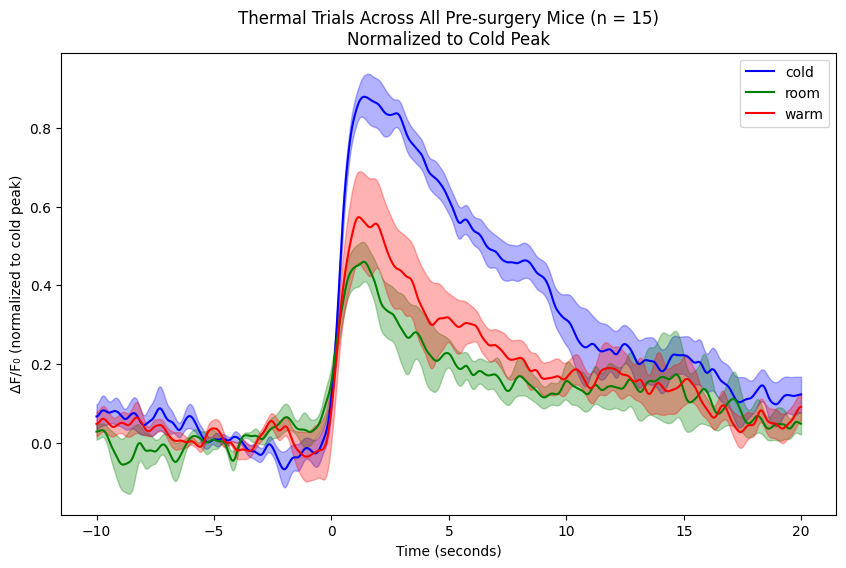

In [87]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# Path to the uploaded zip file
extract_folder_path = 'C:/files/data/sensory_stim/grabda/'
extract_folder_path = r'H:\Jun\sensory_stim\fp\grabda_all\control'

# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to normalize data to cold peak for each animal
def normalize_to_cold_peak(animal_data):
    normalized_data = {}
    for animal, data in animal_data.items():
        if isinstance(data.item(), dict):
            # Get cold trial peak amplitude
            cold_peak = np.max(data.item().get('average_trace_cold', [0]))
            if cold_peak == 0:
                continue
                
            # Normalize all trials by cold peak
            animal_trials = {}
            for trial in mechanical_trials + thermal_trials:
                if trial in data.item():
                    animal_trials[trial] = data.item()[trial] / cold_peak
            
            normalized_data[animal] = animal_trials
    return normalized_data

# Normalize all data
normalized_data = normalize_to_cold_peak(all_data)

# Function to separate mechanical and thermal trials
def extract_trials_per_type(normalized_data, trial_types):
    trials = {}
    for animal, data in normalized_data.items():
        animal_trials = {}
        for trial in trial_types:
            if trial in data:
                animal_trials[trial] = data[trial]
        if animal_trials:
            trials[animal] = animal_trials
    return trials

# Extracting normalized trials
mechanical_data = extract_trials_per_type(normalized_data, mechanical_trials)
thermal_data = extract_trials_per_type(normalized_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculating average and SEM for normalized data
mechanical_avg_sem = calculate_avg_sem_across_animals(mechanical_data, mechanical_trials)
thermal_avg_sem = calculate_avg_sem_across_animals(thermal_data, thermal_trials)



# Color codes
color_codes = {
    'average_trace_cold': 'blue',
    'average_trace_room': 'green',
    'average_trace_warm': 'red',
    'average_trace_pinp': 'blue',
    'average_trace_weak': 'green',
    'average_trace_mild': 'yellow',
    'average_trace_hard': 'red'
}

# Modified plotting function
def plot_trials_with_colors(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-10, 20, 1/sampling_rate)
    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('ΔF/F₀ (normalized to cold peak)')
    plt.legend()
    plt.show()

# Plotting the normalized trials
plot_trials_with_colors(mechanical_avg_sem, 
                       "Mechanical Trials Across All Pre-surgery Mice (n = 15)\nNormalized to Cold Peak", 
                       130, 
                       color_codes)
plot_trials_with_colors(thermal_avg_sem, 
                       "Thermal Trials Across All Pre-surgery Mice (n = 15)\nNormalized to Cold Peak", 
                       130, 
                       color_codes)

In [2]:
import os
import numpy as np
from scipy.stats import sem
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

import matplotlib.pyplot as plt

# Path to the uploaded zip file
extract_folder_path = 'C:/files/data/sensory_stim/grabda/'  # Change this to your desired extraction path

extract_folder_path = r'H:\Jun\sensory_stim\fp\grabda_all\'

# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Extracting trials for each animal
mechanical_data_no_zscore = extract_trials_per_animal(all_data, mechanical_trials)
thermal_data_no_zscore = extract_trials_per_animal(all_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculating average and SEM for mechanical and thermal trials
mechanical_avg_sem_no_zscore = calculate_avg_sem_across_animals(mechanical_data_no_zscore, mechanical_trials)
thermal_avg_sem_no_zscore = calculate_avg_sem_across_animals(thermal_data_no_zscore, thermal_trials)

# Defining custom color codes for each trial type
color_codes = {
    'average_trace_cold': 'blue',
    'average_trace_room': 'green',
    'average_trace_warm': 'red',
    'average_trace_pinp': 'blue',
    'average_trace_weak': 'green',
    'average_trace_mild': 'yellow',
    'average_trace_hard': 'red'
}

# Exponential decay function
def exp_decay(t, A, tau, C):
    return A * np.exp(-t / tau) + C

# Modified exponential decay function with bounds on the curve_fit parameters
def plot_trials_with_colors_and_fit(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-10, 20, 1 / sampling_rate)
    fit_time_axis = np.arange(1, 20, 1 / sampling_rate)

    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')  # Default color is black if not specified
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)

        # Fit exponential decay to the 0-20 seconds range with parameter bounds
        try:
            popt, _ = curve_fit(
                exp_decay,
                fit_time_axis,
                avg[1430:3900],  # Adjust to use only the 0-20 seconds segment
                p0=(1, 5, 0),  # Initial guesses (amplitude, tau, offset)
                bounds=([0, 0.1, -np.inf], [np.inf, 100, np.inf])  # Bounds for A, tau, and C
            )
            tau = popt[1]
            plt.plot(
                fit_time_axis,
                exp_decay(fit_time_axis, *popt),
                '--',
                color=color,
                label=f'{trial.split("_")[-1]} fit (tau={tau:.2f}s)'
            )
        except RuntimeError:
            print(f"Fit did not converge for {trial}. Check data or try different initial parameters.")

    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('ΔF/F₀')
    plt.legend()
    plt.show()

# Plotting the trials with exponential fit
plot_trials_with_colors_and_fit(mechanical_avg_sem_no_zscore, "Mechanical Trials Across All Pre-surgery Mice (n = 15)", 130, color_codes)
plot_trials_with_colors_and_fit(thermal_avg_sem_no_zscore, "Thermal Trials Across All Pre-surgery Mice (n = 15)", 130, color_codes)


SyntaxError: unterminated string literal (detected at line 12) (1217960247.py, line 12)

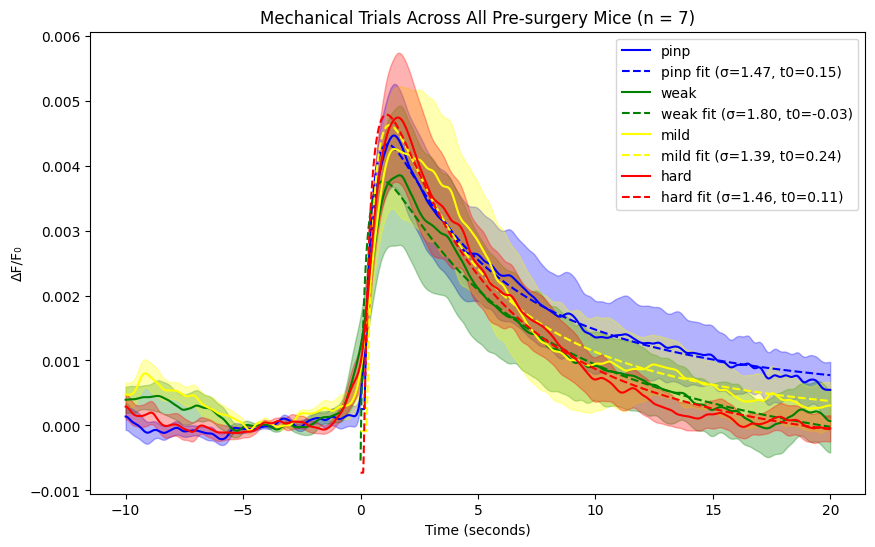

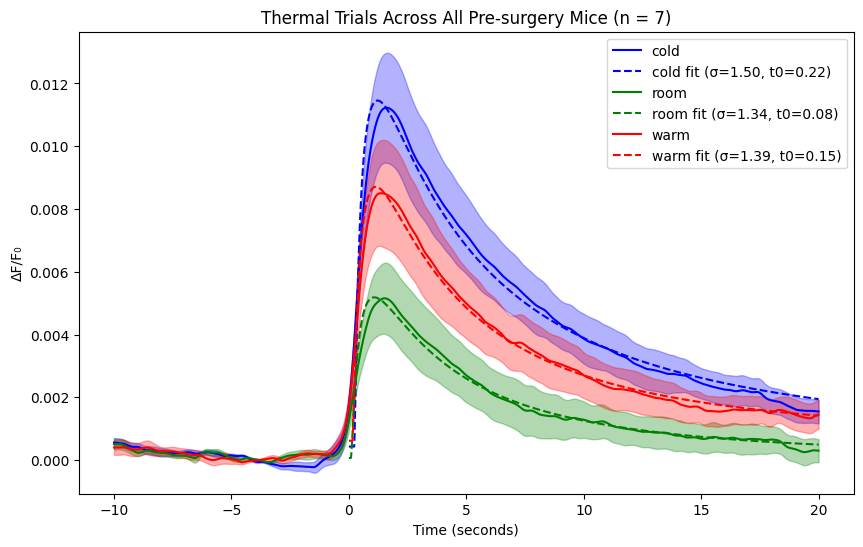

In [5]:
import os
import numpy as np
from scipy.stats import sem
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Path to the uploaded zip file
extract_folder_path = 'C:/files/data/sensory_stim/grabda/'  # Update with your actual path
extract_folder_path = r'H:\Jun\sensory_stim\fp\grabda_all'

# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Extracting trials for each animal
mechanical_data_no_zscore = extract_trials_per_animal(all_data, mechanical_trials)
thermal_data_no_zscore = extract_trials_per_animal(all_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculating average and SEM for mechanical and thermal trials
mechanical_avg_sem_no_zscore = calculate_avg_sem_across_animals(mechanical_data_no_zscore, mechanical_trials)
thermal_avg_sem_no_zscore = calculate_avg_sem_across_animals(thermal_data_no_zscore, thermal_trials)

# Defining custom color codes for each trial type
color_codes = {
    'average_trace_cold': 'blue',
    'average_trace_room': 'green',
    'average_trace_warm': 'red',
    'average_trace_pinp': 'blue',
    'average_trace_weak': 'green',
    'average_trace_mild': 'yellow',
    'average_trace_hard': 'red'
}

# Log-normal decay function
def log_normal_decay(t, A, sigma, t0, C):
    # Use np.clip to avoid taking log of zero
    t = np.clip(t, t0 + 1e-9, None)
    return A * np.exp(-((np.log(t - t0)) ** 2) / (2 * sigma ** 2)) + C

# Modified plotting function with custom color codes and log-normal fit
def plot_trials_with_colors_and_fit(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-10, 20, 1 / sampling_rate)
    fit_time_axis = np.arange(0, 20, 1 / sampling_rate)
    
    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')  # Default color is black if not specified
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
        
        # Select the segment for fitting
        data_segment = avg[1300:3900]
        
        # Fit log-normal decay to the 0-20 seconds range
        try:
            popt, _ = curve_fit(
                log_normal_decay, 
                fit_time_axis, 
                data_segment,
                p0=(1, 0.5, 1, 0),  # Initial guesses
                bounds=([0, 0.1, -10, -np.inf], [np.inf, 10, 10, np.inf])  # Bounds for A, sigma, t0, C
            )
            sigma = popt[1]
            t0 = popt[2]
            plt.plot(fit_time_axis, log_normal_decay(fit_time_axis, *popt), '--', color=color, 
                     label=f'{trial.split("_")[-1]} fit (σ={sigma:.2f}, t0={t0:.2f})')
        
        except RuntimeError:
            print(f"Fit did not converge for {trial}. Check data or try different initial parameters.")
    
    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('ΔF/F₀')
    plt.legend()
    plt.show()

# Plotting the trials with log-normal fit
plot_trials_with_colors_and_fit(mechanical_avg_sem_no_zscore, "Mechanical Trials Across All Pre-surgery Mice (n = 7)", 130, color_codes)
plot_trials_with_colors_and_fit(thermal_avg_sem_no_zscore, "Thermal Trials Across All Pre-surgery Mice (n = 7)", 130, color_codes)


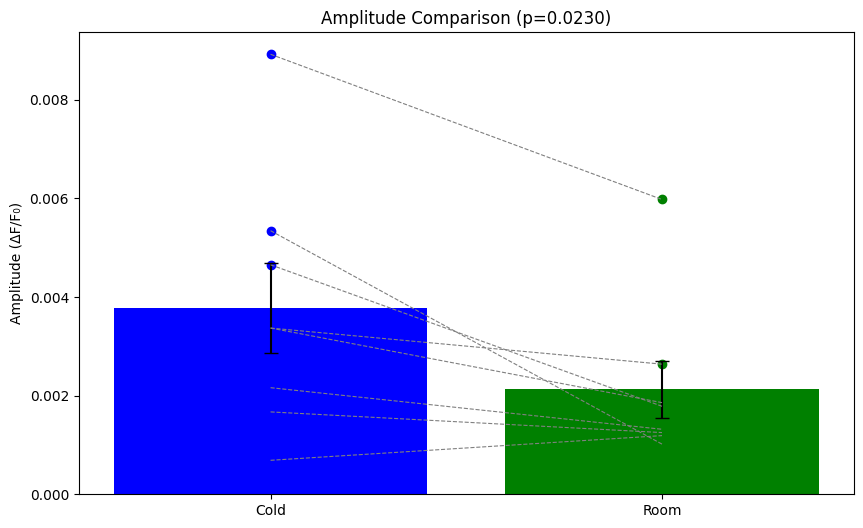

In [4]:
from scipy.stats import ttest_rel

# Extract the amplitude data for cold and room induced reactions
cold_amplitudes = [np.max(data['average_trace_cold']) for data in thermal_data_no_zscore.values()]
room_amplitudes = [np.max(data['average_trace_room']) for data in thermal_data_no_zscore.values()]

# Perform paired t-test
t_stat, p_value = ttest_rel(cold_amplitudes, room_amplitudes)

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(['Cold', 'Room'], [np.mean(cold_amplitudes), np.mean(room_amplitudes)], 
    yerr=[sem(cold_amplitudes), sem(room_amplitudes)], capsize=5, color=['blue', 'green'])

# Plot individual data points
plt.scatter(['Cold']*len(cold_amplitudes), cold_amplitudes, color='blue')
plt.scatter(['Room']*len(room_amplitudes), room_amplitudes, color='green')

# Connect paired data points
for i in range(len(cold_amplitudes)):
    plt.plot(['Cold', 'Room'], [cold_amplitudes[i], room_amplitudes[i]], color='gray', linestyle='--', linewidth=0.8)

plt.title(f'Amplitude Comparison (p={p_value:.4f})')
plt.ylabel('Amplitude (ΔF/F₀)')
plt.show()

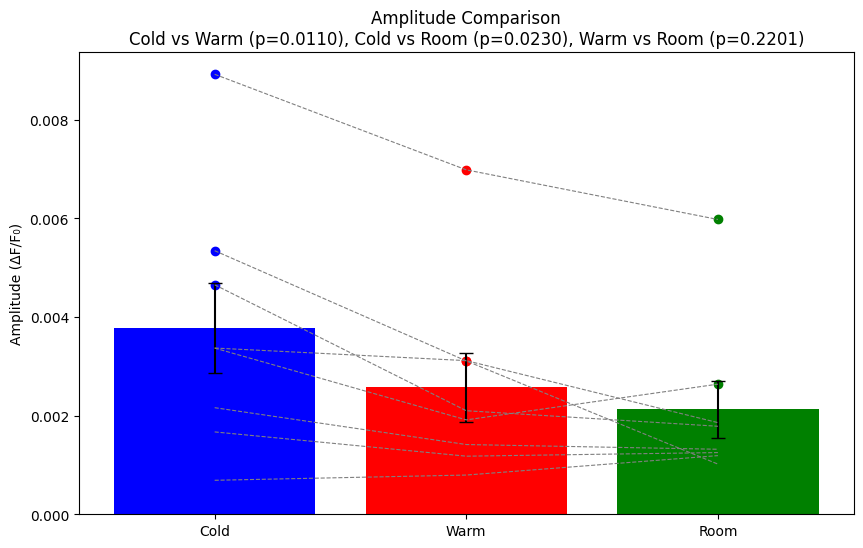

In [6]:
# Extract the amplitude data for cold, room, and warm induced reactions
cold_amplitudes = [np.max(data['average_trace_cold']) for data in thermal_data_no_zscore.values()]
room_amplitudes = [np.max(data['average_trace_room']) for data in thermal_data_no_zscore.values()]
warm_amplitudes = [np.max(data['average_trace_warm']) for data in thermal_data_no_zscore.values()]

# Perform paired t-test for cold vs warm, cold vs room, and warm vs room
t_stat_cold_warm, p_value_cold_warm = ttest_rel(cold_amplitudes, warm_amplitudes)
t_stat_cold_room, p_value_cold_room = ttest_rel(cold_amplitudes, room_amplitudes)
t_stat_warm_room, p_value_warm_room = ttest_rel(warm_amplitudes, room_amplitudes)

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(['Cold', 'Warm', 'Room'], [np.mean(cold_amplitudes), np.mean(warm_amplitudes), np.mean(room_amplitudes)], 
    yerr=[sem(cold_amplitudes), sem(warm_amplitudes), sem(room_amplitudes)], capsize=5, color=['blue', 'red', 'green'])

# Plot individual data points
plt.scatter(['Cold']*len(cold_amplitudes), cold_amplitudes, color='blue')
plt.scatter(['Warm']*len(warm_amplitudes), warm_amplitudes, color='red')
plt.scatter(['Room']*len(room_amplitudes), room_amplitudes, color='green')

# Connect paired data points
for i in range(len(cold_amplitudes)):
    plt.plot(['Cold', 'Warm', 'Room'], [cold_amplitudes[i], warm_amplitudes[i], room_amplitudes[i]], color='gray', linestyle='--', linewidth=0.8)

plt.title(f'Amplitude Comparison\nCold vs Warm (p={p_value_cold_warm:.4f}), Cold vs Room (p={p_value_cold_room:.4f}), Warm vs Room (p={p_value_warm_room:.4f})')
plt.ylabel('Amplitude (ΔF/F₀)')
plt.show()

NameError: name 'sham_data' is not defined

Mechanical Trials ANOVA: F-statistic = 0.04888245076781964, p-value = 0.9853924628545864
Thermal Trials ANOVA: F-statistic = 1.3100885107224354, p-value = 0.2909574886667504


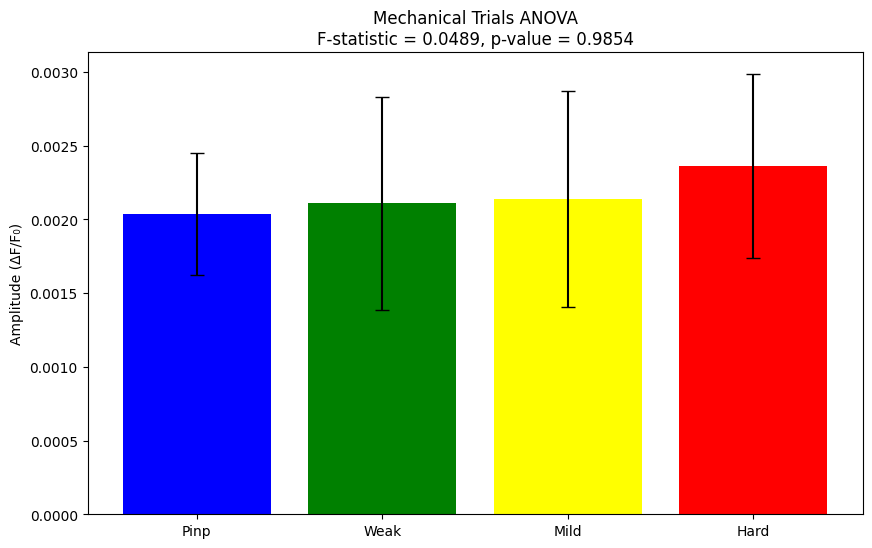

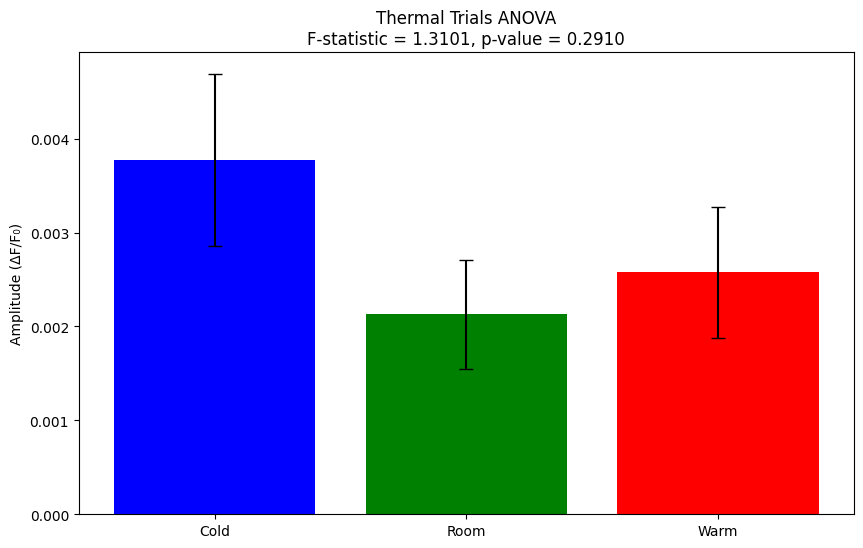

In [10]:
from scipy.stats import f_oneway

# Perform ANOVA for mechanical trials
mechanical_amplitudes = [pinp_amplitudes, weak_amplitudes, mild_amplitudes, hard_amplitudes]
mechanical_anova_result = f_oneway(*mechanical_amplitudes)

# Perform ANOVA for thermal trials
thermal_amplitudes = [cold_amplitudes, room_amplitudes, warm_amplitudes]
thermal_anova_result = f_oneway(*thermal_amplitudes)

# Print the results
print(f"Mechanical Trials ANOVA: F-statistic = {mechanical_anova_result.statistic}, p-value = {mechanical_anova_result.pvalue}")
print(f"Thermal Trials ANOVA: F-statistic = {thermal_anova_result.statistic}, p-value = {thermal_anova_result.pvalue}")
# Plot the ANOVA results for mechanical trials
plt.figure(figsize=(10, 6))
plt.bar(['Pinp', 'Weak', 'Mild', 'Hard'], [np.mean(pinp_amplitudes), np.mean(weak_amplitudes), np.mean(mild_amplitudes), np.mean(hard_amplitudes)], 
    yerr=[sem(pinp_amplitudes), sem(weak_amplitudes), sem(mild_amplitudes), sem(hard_amplitudes)], capsize=5, color=['blue', 'green', 'yellow', 'red'])
plt.title(f'Mechanical Trials ANOVA\nF-statistic = {mechanical_anova_result.statistic:.4f}, p-value = {mechanical_anova_result.pvalue:.4f}')
plt.ylabel('Amplitude (ΔF/F₀)')
plt.show()

# Plot the ANOVA results for thermal trials
plt.figure(figsize=(10, 6))
plt.bar(['Cold', 'Room', 'Warm'], [np.mean(cold_amplitudes), np.mean(room_amplitudes), np.mean(warm_amplitudes)], 
    yerr=[sem(cold_amplitudes), sem(room_amplitudes), sem(warm_amplitudes)], capsize=5, color=['blue', 'green', 'red'])
plt.title(f'Thermal Trials ANOVA\nF-statistic = {thermal_anova_result.statistic:.4f}, p-value = {thermal_anova_result.pvalue:.4f}')
plt.ylabel('Amplitude (ΔF/F₀)')
plt.show()

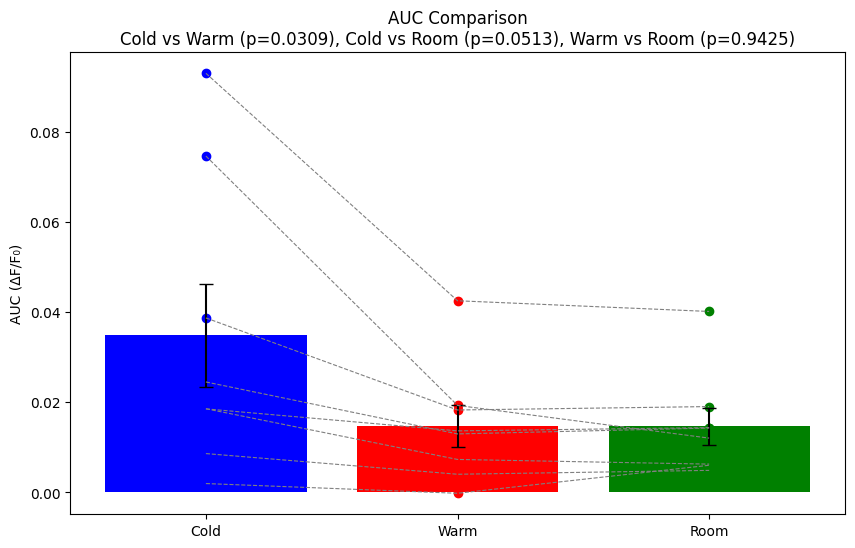

In [24]:
# Define the start and end indices for the 5 seconds after the stimulus
start_time = 10  # seconds
end_time = 30  # seconds
start_index = int(start_time * sampling_rate)
end_index = int(end_time * sampling_rate)

# Extract the AUC data for cold, room, and warm induced reactions
cold_auc = [np.trapz(data['average_trace_cold'][start_index:end_index], dx=1/sampling_rate) for data in thermal_data_no_zscore.values()]
room_auc = [np.trapz(data['average_trace_room'][start_index:end_index], dx=1/sampling_rate) for data in thermal_data_no_zscore.values()]
warm_auc = [np.trapz(data['average_trace_warm'][start_index:end_index], dx=1/sampling_rate) for data in thermal_data_no_zscore.values()]

# Perform paired t-test for cold vs warm, cold vs room, and warm vs room
t_stat_cold_warm, p_value_cold_warm = ttest_rel(cold_auc, warm_auc)
t_stat_cold_room, p_value_cold_room = ttest_rel(cold_auc, room_auc)
t_stat_warm_room, p_value_warm_room = ttest_rel(warm_auc, room_auc)

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(['Cold', 'Warm', 'Room'], [np.mean(cold_auc), np.mean(warm_auc), np.mean(room_auc)], 
    yerr=[sem(cold_auc), sem(warm_auc), sem(room_auc)], capsize=5, color=['blue', 'red', 'green'])

# Plot individual data points
plt.scatter(['Cold']*len(cold_auc), cold_auc, color='blue')
plt.scatter(['Warm']*len(warm_auc), warm_auc, color='red')
plt.scatter(['Room']*len(room_auc), room_auc, color='green')

# Connect paired data points
for i in range(len(cold_auc)):
    plt.plot(['Cold', 'Warm', 'Room'], [cold_auc[i], warm_auc[i], room_auc[i]], color='gray', linestyle='--', linewidth=0.8)

plt.title(f'AUC Comparison\nCold vs Warm (p={p_value_cold_warm:.4f}), Cold vs Room (p={p_value_cold_room:.4f}), Warm vs Room (p={p_value_warm_room:.4f})')
plt.ylabel('AUC (ΔF/F₀)')
plt.show()


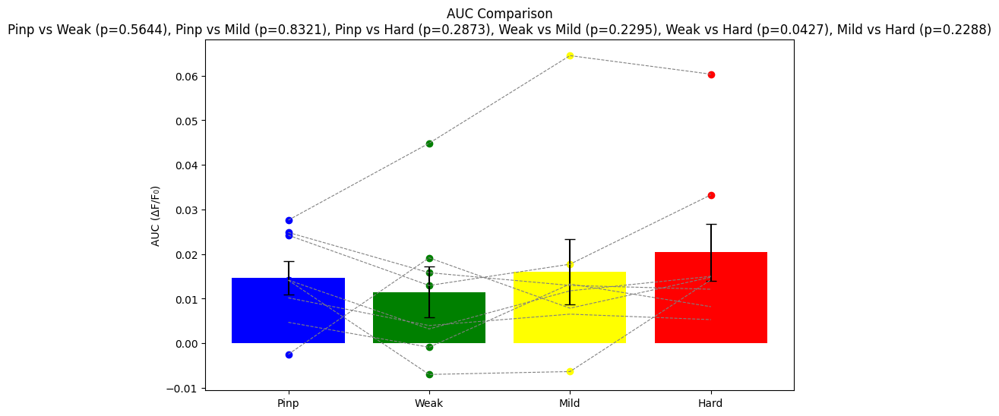

In [25]:
# Define the start and end indices for the 5 seconds after the stimulus
start_time = 10  # seconds
end_time = 30  # seconds
start_index = int(start_time * sampling_rate)
end_index = int(end_time * sampling_rate)

# Extract the AUC data for pinp, weak, mild, and hard induced reactions
pinp_auc = [np.trapz(data['average_trace_pinp'][start_index:end_index], dx=1/sampling_rate) for data in mechanical_data_no_zscore.values()]
weak_auc = [np.trapz(data['average_trace_weak'][start_index:end_index], dx=1/sampling_rate) for data in mechanical_data_no_zscore.values()]
mild_auc = [np.trapz(data['average_trace_mild'][start_index:end_index], dx=1/sampling_rate) for data in mechanical_data_no_zscore.values()]
hard_auc = [np.trapz(data['average_trace_hard'][start_index:end_index], dx=1/sampling_rate) for data in mechanical_data_no_zscore.values()]

# Perform paired t-test for pinp vs weak, pinp vs mild, pinp vs hard, weak vs mild, weak vs hard, and mild vs hard
t_stat_pinp_weak, p_value_pinp_weak = ttest_rel(pinp_auc, weak_auc)
t_stat_pinp_mild, p_value_pinp_mild = ttest_rel(pinp_auc, mild_auc)
t_stat_pinp_hard, p_value_pinp_hard = ttest_rel(pinp_auc, hard_auc)
t_stat_weak_mild, p_value_weak_mild = ttest_rel(weak_auc, mild_auc)
t_stat_weak_hard, p_value_weak_hard = ttest_rel(weak_auc, hard_auc)
t_stat_mild_hard, p_value_mild_hard = ttest_rel(mild_auc, hard_auc)

# Plot the results
plt.figure(figsize=(10, 6))
plt.bar(['Pinp', 'Weak', 'Mild', 'Hard'], [np.mean(pinp_auc), np.mean(weak_auc), np.mean(mild_auc), np.mean(hard_auc)], 
    yerr=[sem(pinp_auc), sem(weak_auc), sem(mild_auc), sem(hard_auc)], capsize=5, color=['blue', 'green', 'yellow', 'red'])

# Plot individual data points
plt.scatter(['Pinp']*len(pinp_auc), pinp_auc, color='blue')
plt.scatter(['Weak']*len(weak_auc), weak_auc, color='green')
plt.scatter(['Mild']*len(mild_auc), mild_auc, color='yellow')
plt.scatter(['Hard']*len(hard_auc), hard_auc, color='red')

# Connect paired data points
for i in range(len(pinp_auc)):
    plt.plot(['Pinp', 'Weak', 'Mild', 'Hard'], [pinp_auc[i], weak_auc[i], mild_auc[i], hard_auc[i]], color='gray', linestyle='--', linewidth=0.8)

plt.title(f'AUC Comparison\nPinp vs Weak (p={p_value_pinp_weak:.4f}), Pinp vs Mild (p={p_value_pinp_mild:.4f}), Pinp vs Hard (p={p_value_pinp_hard:.4f}), Weak vs Mild (p={p_value_weak_mild:.4f}), Weak vs Hard (p={p_value_weak_hard:.4f}), Mild vs Hard (p={p_value_mild_hard:.4f})')
plt.ylabel('AUC (ΔF/F₀)')
plt.show()


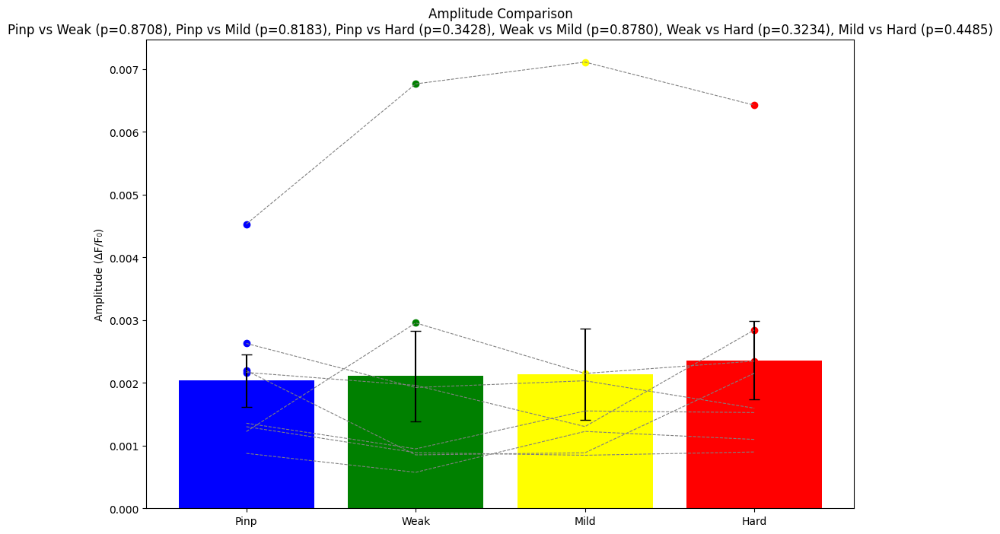

In [9]:
from scipy.stats import ttest_rel

# Extract the amplitude data for each tactile stimulation
pinp_amplitudes = [np.max(data['average_trace_pinp']) for data in mechanical_data_no_zscore.values()]
weak_amplitudes = [np.max(data['average_trace_weak']) for data in mechanical_data_no_zscore.values()]
mild_amplitudes = [np.max(data['average_trace_mild']) for data in mechanical_data_no_zscore.values()]
hard_amplitudes = [np.max(data['average_trace_hard']) for data in mechanical_data_no_zscore.values()]

# Perform paired t-tests
t_stat_pinp_weak, p_value_pinp_weak = ttest_rel(pinp_amplitudes, weak_amplitudes)
t_stat_pinp_mild, p_value_pinp_mild = ttest_rel(pinp_amplitudes, mild_amplitudes)
t_stat_pinp_hard, p_value_pinp_hard = ttest_rel(pinp_amplitudes, hard_amplitudes)
t_stat_weak_mild, p_value_weak_mild = ttest_rel(weak_amplitudes, mild_amplitudes)
t_stat_weak_hard, p_value_weak_hard = ttest_rel(weak_amplitudes, hard_amplitudes)
t_stat_mild_hard, p_value_mild_hard = ttest_rel(mild_amplitudes, hard_amplitudes)

# Plot the results
plt.figure(figsize=(12, 8))
plt.bar(['Pinp', 'Weak', 'Mild', 'Hard'], 
    [np.mean(pinp_amplitudes), np.mean(weak_amplitudes), np.mean(mild_amplitudes), np.mean(hard_amplitudes)], 
    yerr=[sem(pinp_amplitudes), sem(weak_amplitudes), sem(mild_amplitudes), sem(hard_amplitudes)], 
    capsize=5, color=['blue', 'green', 'yellow', 'red'])

# Plot individual data points
plt.scatter(['Pinp']*len(pinp_amplitudes), pinp_amplitudes, color='blue')
plt.scatter(['Weak']*len(weak_amplitudes), weak_amplitudes, color='green')
plt.scatter(['Mild']*len(mild_amplitudes), mild_amplitudes, color='yellow')
plt.scatter(['Hard']*len(hard_amplitudes), hard_amplitudes, color='red')

# Connect paired data points
for i in range(len(pinp_amplitudes)):
    plt.plot(['Pinp', 'Weak', 'Mild', 'Hard'], 
         [pinp_amplitudes[i], weak_amplitudes[i], mild_amplitudes[i], hard_amplitudes[i]], 
         color='gray', linestyle='--', linewidth=0.8)

plt.title(f'Amplitude Comparison\nPinp vs Weak (p={p_value_pinp_weak:.4f}), Pinp vs Mild (p={p_value_pinp_mild:.4f}), Pinp vs Hard (p={p_value_pinp_hard:.4f}), Weak vs Mild (p={p_value_weak_mild:.4f}), Weak vs Hard (p={p_value_weak_hard:.4f}), Mild vs Hard (p={p_value_mild_hard:.4f})')
plt.ylabel('Amplitude (ΔF/F₀)')
plt.show()

Comparison 1: Original p-value = 0.02299080065145072, Corrected p-value = 0.04598160130290144, Reject null hypothesis = True


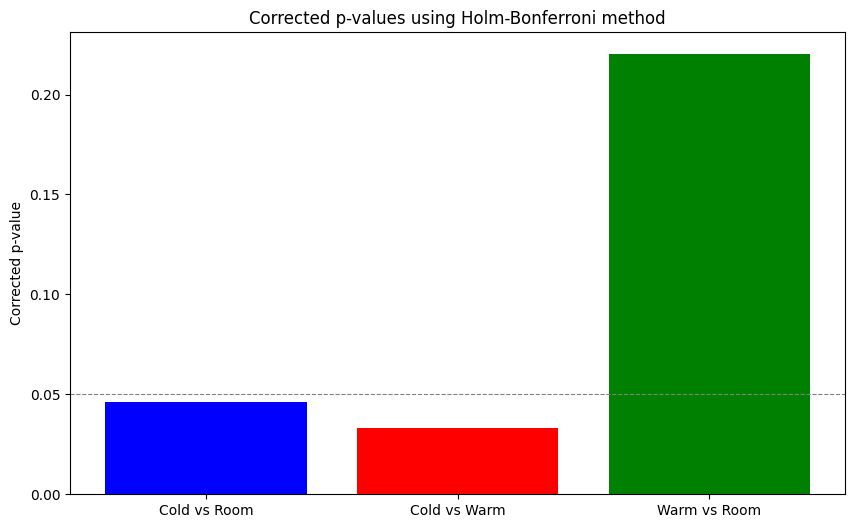

Comparison 2: Original p-value = 0.011008969134553964, Corrected p-value = 0.03302690740366189, Reject null hypothesis = True


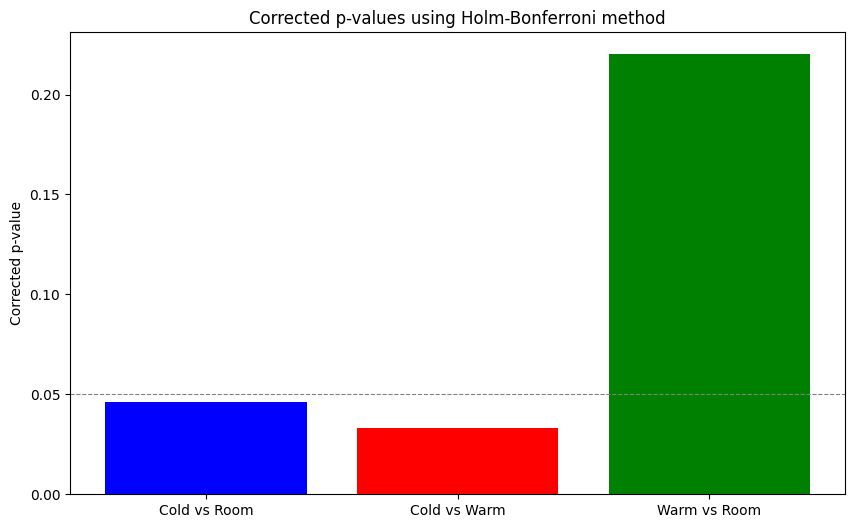

Comparison 3: Original p-value = 0.2201465612120208, Corrected p-value = 0.2201465612120208, Reject null hypothesis = False


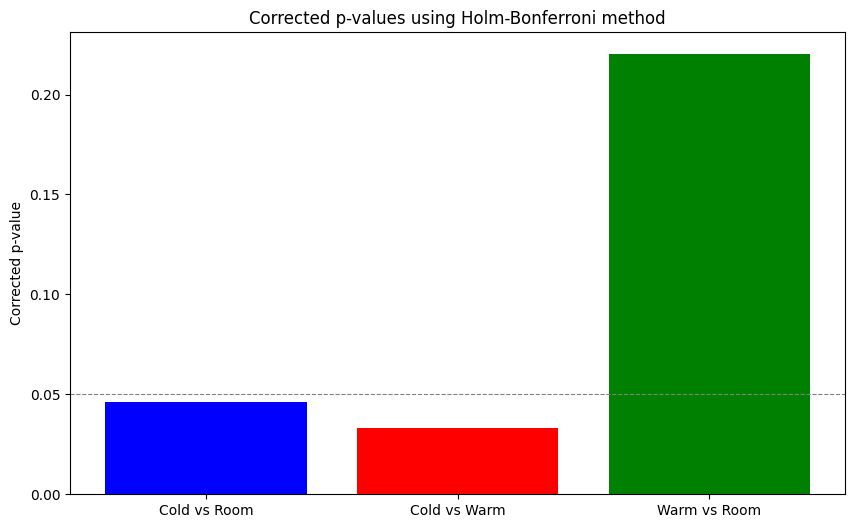

In [7]:
from statsmodels.stats.multitest import multipletests

# List of p-values from multiple comparisons
p_values = [p_value_cold_room, p_value_cold_warm, p_value_warm_room]

# Apply Holm-Bonferroni correction
reject, pvals_corrected, _, _ = multipletests(p_values, alpha=0.05, method='holm')

# Print the results
for i, (p_val, p_val_corr, rej) in enumerate(zip(p_values, pvals_corrected, reject)):
    print(f"Comparison {i+1}: Original p-value = {p_val}, Corrected p-value = {p_val_corr}, Reject null hypothesis = {rej}")
    # Plot the corrected p-values
    plt.figure(figsize=(10, 6))
    plt.bar(['Cold vs Room', 'Cold vs Warm', 'Warm vs Room'], pvals_corrected, color=['blue', 'red', 'green'])
    plt.axhline(y=0.05, color='gray', linestyle='--', linewidth=0.8)
    plt.title('Corrected p-values using Holm-Bonferroni method')
    plt.ylabel('Corrected p-value')
    plt.show()

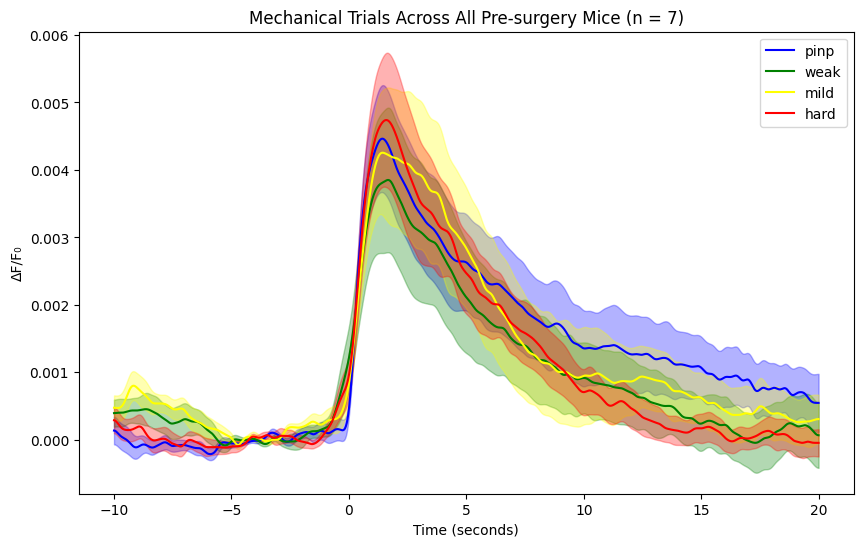

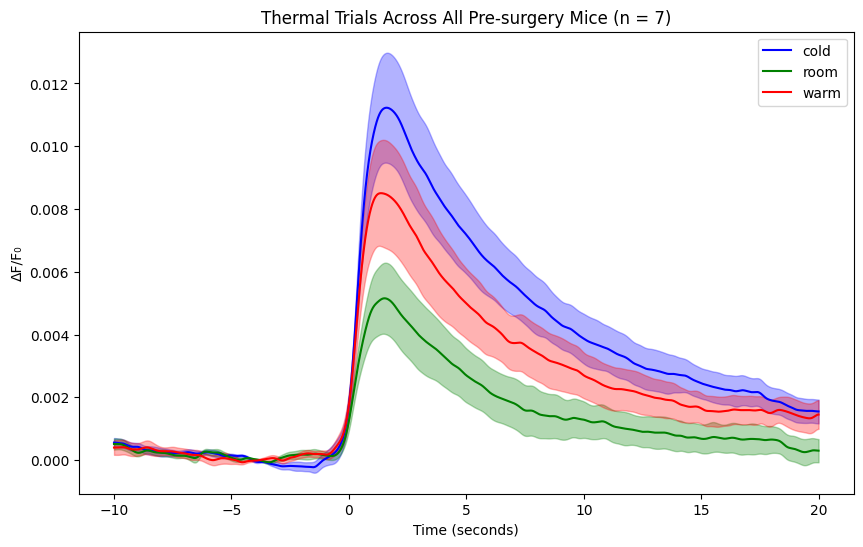

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem
from scipy.ndimage import gaussian_filter1d

# Path to the uploaded zip file
extract_folder_path = r'H:\Jun\sensory_stim\fp\grabda\control'

# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

def smooth_trials(data_per_animal, trial_types, sigma=20):
    smoothed_trials = {}
    for animal, trials in data_per_animal.items():
        animal_trials = {}
        for trial in trial_types:
            if trial in trials:
                # Apply Gaussian smoothing to each trial
                smoothed_data = gaussian_filter1d(trials[trial], sigma=sigma)
                animal_trials[trial] = smoothed_data
        smoothed_trials[animal] = animal_trials
    return smoothed_trials

def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Extract and smooth trials for each animal
mechanical_data_no_zscore = extract_trials_per_animal(all_data, mechanical_trials)
thermal_data_no_zscore = extract_trials_per_animal(all_data, thermal_trials)

# Apply smoothing
mechanical_data_smoothed = smooth_trials(mechanical_data_no_zscore, mechanical_trials, sigma=20)
thermal_data_smoothed = smooth_trials(thermal_data_no_zscore, thermal_trials, sigma=20)

# Calculate averages using smoothed data
mechanical_avg_sem_smoothed = calculate_avg_sem_across_animals(mechanical_data_smoothed, mechanical_trials)
thermal_avg_sem_smoothed = calculate_avg_sem_across_animals(thermal_data_smoothed, thermal_trials)

# Defining custom color codes for each trial type
color_codes = {
    'average_trace_cold': 'blue',
    'average_trace_room': 'green',
    'average_trace_warm': 'red',
    'average_trace_pinp': 'blue',
    'average_trace_weak': 'green',
    'average_trace_mild': 'yellow',
    'average_trace_hard': 'red'
}

def plot_trials_with_colors(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-10, 20, 1/sampling_rate)
    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    
    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('ΔF/F₀')
    plt.legend()
    plt.show()

# Plotting the smoothed trials
plot_trials_with_colors(mechanical_avg_sem_smoothed, 
                       "Mechanical Trials Across All Pre-surgery Mice (n = 7)", 
                       130, color_codes)
plot_trials_with_colors(thermal_avg_sem_smoothed, 
                       "Thermal Trials Across All Pre-surgery Mice (n = 7)", 
                       130, color_codes)

# Optional: Save the smoothed data
np.save('mechanical_smoothed_data.npy', mechanical_avg_sem_smoothed)
np.save('thermal_smoothed_data.npy', thermal_avg_sem_smoothed)

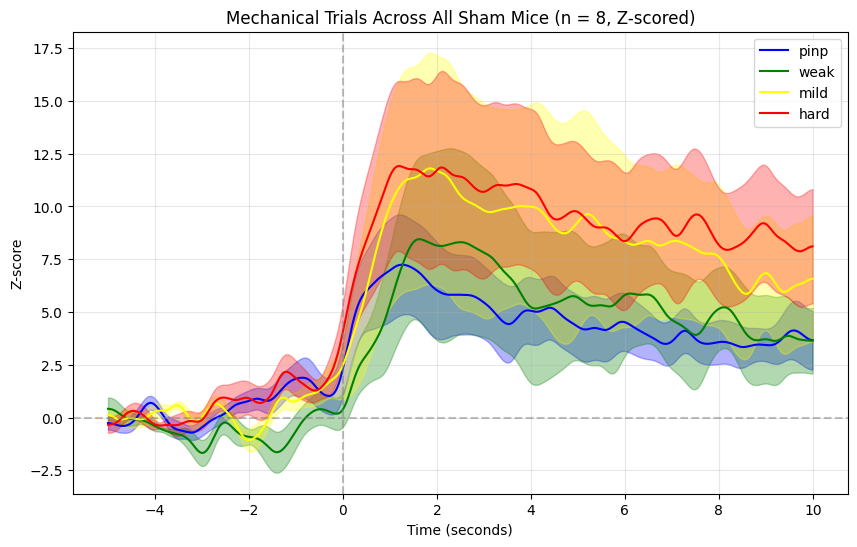

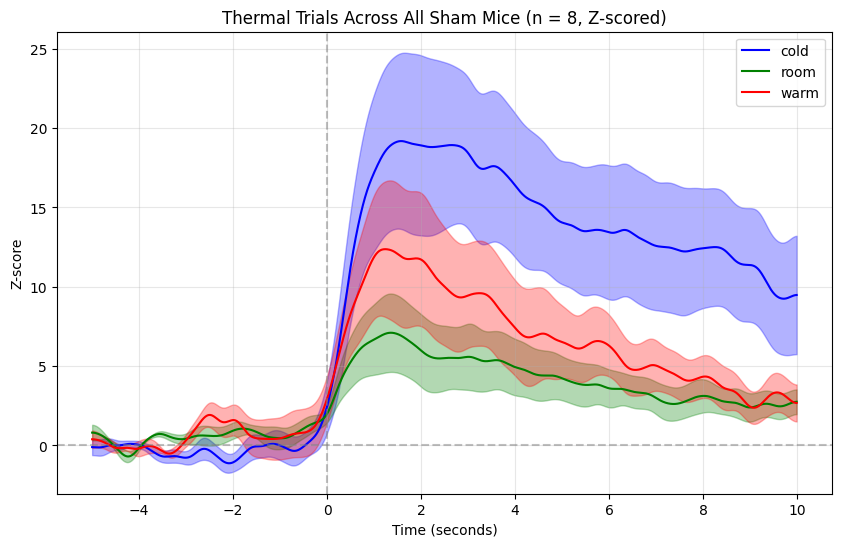

: 

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# Path to the uploaded zip file
extract_folder_path = 'C:/files/data/sensory_stim/grabda/'

# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to calculate z-score across all animals for each trial type
def calculate_zscore_across_animals(data_per_animal, trial_types):
    zscore_data = {}
    
    # First, collect all data for each trial type
    for trial in trial_types:
        # Collect all traces for this trial type
        all_traces = np.array([animal_data[trial] 
                             for animal_data in data_per_animal.values() 
                             if trial in animal_data])
        
        # Calculate baseline period (e.g., first 5 seconds)
        sampling_rate = 130  # Adjust based on your data
        baseline_period = int(1 * sampling_rate)  # 5 seconds of baseline
        
        # Calculate mean and std of baseline period across all animals
        baseline_mean = np.mean(all_traces[:, :baseline_period])
        baseline_std = np.std(all_traces[:, :baseline_period])
        
        # Z-score all traces using baseline statistics
        zscored_traces = (all_traces - baseline_mean) / baseline_std
        
        # Calculate mean and SEM of z-scored traces
        avg_zscore = np.mean(zscored_traces, axis=0)
        sem_zscore = sem(zscored_traces, axis=0)
        
        zscore_data[trial] = (avg_zscore, sem_zscore)
    
    return zscore_data

# Extract trials for each animal
mechanical_data = extract_trials_per_animal(all_data, mechanical_trials)
thermal_data = extract_trials_per_animal(all_data, thermal_trials)

# Calculate z-scores and statistics
mechanical_zscore = calculate_zscore_across_animals(mechanical_data, mechanical_trials)
thermal_zscore = calculate_zscore_across_animals(thermal_data, thermal_trials)

# Color codes for plotting
color_codes = {
    'average_trace_cold': 'blue',
    'average_trace_room': 'green',
    'average_trace_warm': 'red',
    'average_trace_pinp': 'blue',
    'average_trace_weak': 'green',
    'average_trace_mild': 'yellow',
    'average_trace_hard': 'red'
}

def plot_trials_with_colors(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-5, 10, 1/sampling_rate)
    
    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    
    plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
    plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('Z-score')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Plot the z-scored data
plot_trials_with_colors(mechanical_zscore, 
                       "Mechanical Trials Across All Sham Mice (n = 8, Z-scored)", 
                       130, color_codes)
plot_trials_with_colors(thermal_zscore, 
                       "Thermal Trials Across All Sham Mice (n = 8, Z-scored)", 
                       130, color_codes)

# Optional: Save the z-scored data
np.save('mechanical_zscore_data.npy', mechanical_zscore)
np.save('thermal_zscore_data.npy', thermal_zscore)

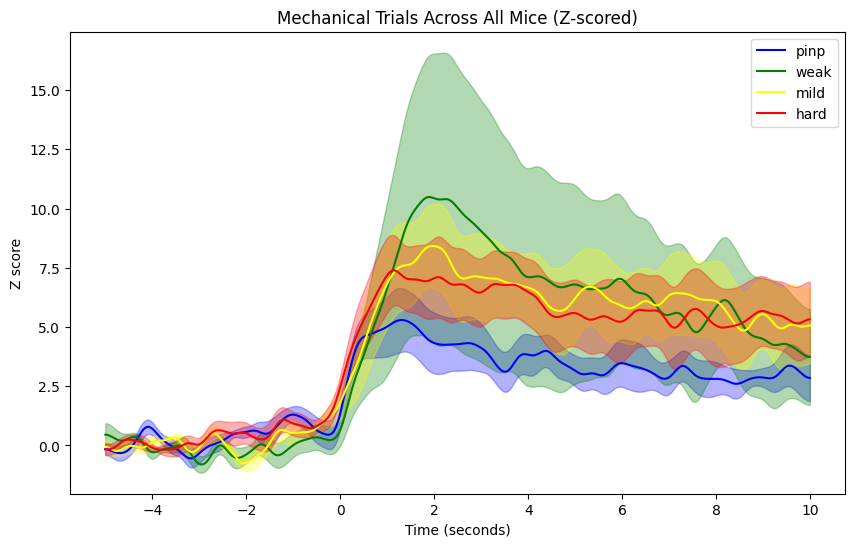

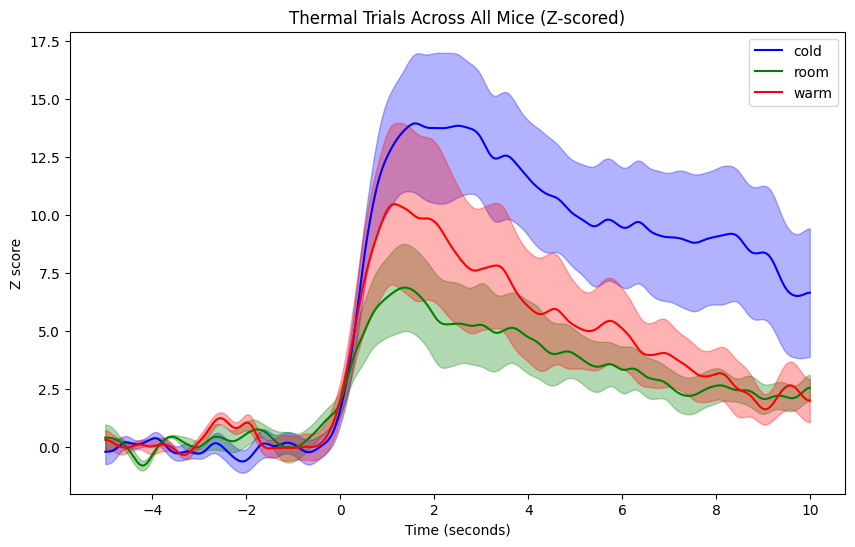

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# Path to the uploaded zip file
extract_folder_path = 'C:/files/data/sensory_stim/grabda'  # Change this to your desired extraction path

# Loading the data from .npy files
all_data = {animal: np.load(os.path.join(extract_folder_path, animal), allow_pickle=True) 
            for animal in os.listdir(extract_folder_path) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to apply z-score normalization and zero out a specific period
def zscore_and_zero_period(data, baseline_start, baseline_end, zero_start, zero_end, sampling_rate):
    # Applying z-score normalization with baseline
    baseline_indices = (np.arange(baseline_start, baseline_end, 1/sampling_rate) * sampling_rate).astype(int)
    baseline_mean = np.mean(data[baseline_indices])
    baseline_std = np.std(data[baseline_indices])
    normalized_data = (data - baseline_mean) / baseline_std

    # Zeroing out the specific period
    zero_indices = (np.arange(zero_start, zero_end, 1/sampling_rate) * sampling_rate).astype(int)
    zero_mean = np.mean(normalized_data[zero_indices])
    return normalized_data - zero_mean

# Function to extract, normalize, and zero out trials for each animal
def extract_normalize_zero_trials_per_animal(animal_data, trial_types, baseline_start, baseline_end, zero_start, zero_end, sampling_rate):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                processed_data = zscore_and_zero_period(data.item()[trial], baseline_start, baseline_end, zero_start, zero_end, sampling_rate)
                animal_trials[trial] = processed_data
        trials[animal] = animal_trials
    return trials

# Extracting, normalizing, and zeroing out trials for each animal
baseline_start_sec = 0  # Starting point of the baseline in seconds
baseline_end_sec = 5   # Ending point of the baseline in seconds
zero_start_sec = 0     # Starting point of zeroing out period in seconds
zero_end_sec = 2       # Ending point of zeroing out period in seconds

mechanical_data_processed = extract_normalize_zero_trials_per_animal(all_data, mechanical_trials, 
                                                                     baseline_start_sec, baseline_end_sec, 
                                                                     zero_start_sec, zero_end_sec, 130)
thermal_data_processed = extract_normalize_zero_trials_per_animal(all_data, thermal_trials, 
                                                                  baseline_start_sec, baseline_end_sec, 
                                                                  zero_start_sec, zero_end_sec, 130)

# Calculating average and SEM for mechanical and thermal trials with processed data
mechanical_avg_sem_processed = calculate_avg_sem_across_animals(mechanical_data_processed, mechanical_trials)
thermal_avg_sem_processed = calculate_avg_sem_across_animals(thermal_data_processed, thermal_trials)

# Modified plotting function with custom color codes
def plot_trials_with_colors_zscore(trial_data, title, sampling_rate, color_codes):
    plt.figure(figsize=(10, 6))
    time_axis = np.arange(-5, 10, 1/sampling_rate)
    for trial, (avg, error) in trial_data.items():
        color = color_codes.get(trial, 'black')  # Default color is black if not specified
        plt.plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        plt.fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    plt.title(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('Z score')
    plt.legend()
    plt.show()

# Plotting the trials with processed data
plot_trials_with_colors_zscore(mechanical_avg_sem_processed, "Mechanical Trials Across All Mice (Z-scored)", 130, color_codes)
plot_trials_with_colors_zscore(thermal_avg_sem_processed, "Thermal Trials Across All Mice (Z-scored)", 130, color_codes)

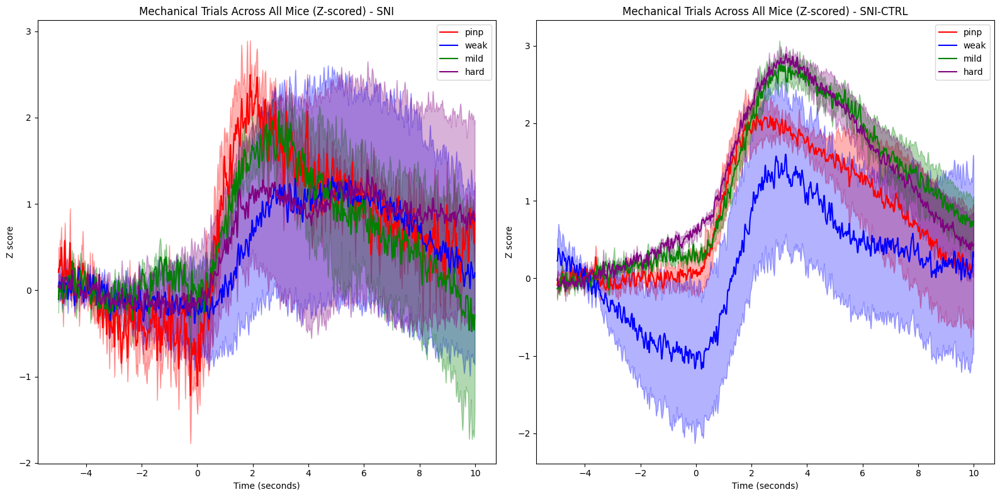

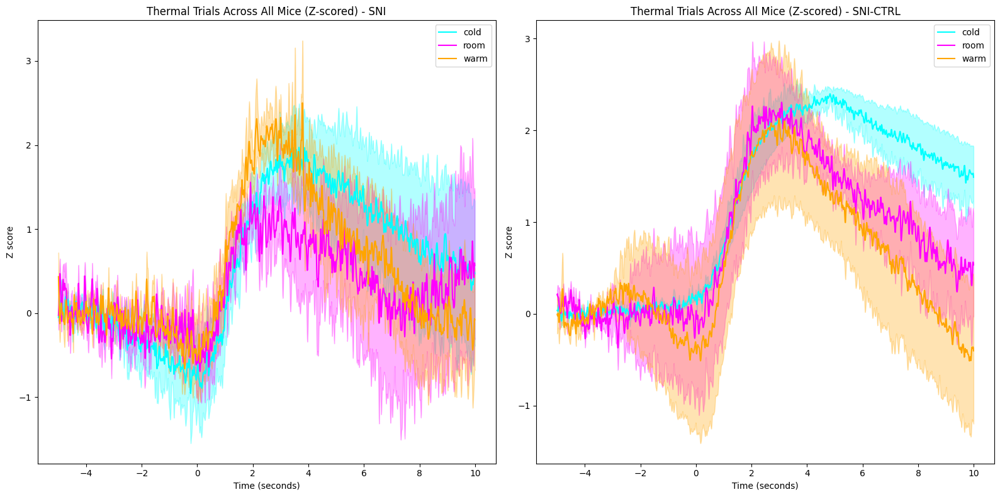

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Path to the uploaded zip files for sni and sni-ctrl conditions
extract_folder_path_sni = 'C:/files/data/sensory_stim/temp/astro/sham_ctrl/'
extract_folder_path_sni_ctrl = 'C:/files/data/sensory_stim/temp/astro/sni_ctrl/'

# Loading the data from .npy files for both conditions
all_data_sni = {animal: np.load(os.path.join(extract_folder_path_sni, animal), allow_pickle=True) 
                for animal in os.listdir(extract_folder_path_sni) if animal.endswith('.npy')}
all_data_sni_ctrl = {animal: np.load(os.path.join(extract_folder_path_sni_ctrl, animal), allow_pickle=True) 
                     for animal in os.listdir(extract_folder_path_sni_ctrl) if animal.endswith('.npy')}

# Defining trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to apply z-score normalization and zero out a specific period
def zscore_and_zero_period(data, baseline_start, baseline_end, zero_start, zero_end, sampling_rate):
    # Applying z-score normalization with baseline
    baseline_indices = (np.arange(baseline_start, baseline_end, 1/sampling_rate) * sampling_rate).astype(int)
    baseline_mean = np.mean(data[baseline_indices])
    baseline_std = np.std(data[baseline_indices])
    normalized_data = (data - baseline_mean) / baseline_std

    # Zeroing out the specific period
    zero_indices = (np.arange(zero_start, zero_end, 1/sampling_rate) * sampling_rate).astype(int)
    zero_mean = np.mean(normalized_data[zero_indices])
    return normalized_data - zero_mean

# Function to extract, normalize, and zero out trials for each animal
def extract_normalize_zero_trials_per_animal(animal_data, trial_types, baseline_start, baseline_end, zero_start, zero_end, sampling_rate):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                processed_data = zscore_and_zero_period(data.item()[trial], baseline_start, baseline_end, zero_start, zero_end, sampling_rate)
                animal_trials[trial] = processed_data
        trials[animal] = animal_trials
    return trials

# Extracting, normalizing, and zeroing out trials separately for each condition
baseline_start_sec = 0  # Starting point of the baseline in seconds
baseline_end_sec = 15   # Ending point of the baseline in seconds
zero_start_sec = 0     # Starting point of zeroing out period in seconds
zero_end_sec = 2       # Ending point of zeroing out period in seconds

# Process sni and sni-ctrl data separately for z-scoring
sni_data_processed = extract_normalize_zero_trials_per_animal(all_data_sni, 
                                                              mechanical_trials + thermal_trials, 
                                                              baseline_start_sec, baseline_end_sec, 
                                                              zero_start_sec, zero_end_sec, 130)

sni_ctrl_data_processed = extract_normalize_zero_trials_per_animal(all_data_sni_ctrl, 
                                                                   mechanical_trials + thermal_trials, 
                                                                   baseline_start_sec, baseline_end_sec, 
                                                                   zero_start_sec, zero_end_sec, 130)

# Calculating average and SEM for mechanical and thermal trials with processed data for both conditions
mechanical_avg_sem_sni = calculate_avg_sem_across_animals(sni_data_processed, mechanical_trials)
thermal_avg_sem_sni = calculate_avg_sem_across_animals(sni_data_processed, thermal_trials)

mechanical_avg_sem_sni_ctrl = calculate_avg_sem_across_animals(sni_ctrl_data_processed, mechanical_trials)
thermal_avg_sem_sni_ctrl = calculate_avg_sem_across_animals(sni_ctrl_data_processed, thermal_trials)

# Modified plotting function to display subplots for SNI and SNI-CTRL
def plot_trials_with_colors_zscore_subplot(trial_data_sni, trial_data_sni_ctrl, title, sampling_rate, color_codes):
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    time_axis = np.arange(-5, 10, 1/sampling_rate)

    for trial, (avg, error) in trial_data_sni.items():
        color = color_codes.get(trial, 'black')
        axes[0].plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        axes[0].fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    axes[0].set_title(f"{title} - SNI")
    axes[0].set_xlabel('Time (seconds)')
    axes[0].set_ylabel('Z score')
    axes[0].legend()

    for trial, (avg, error) in trial_data_sni_ctrl.items():
        color = color_codes.get(trial, 'black')
        axes[1].plot(time_axis, avg, label=trial.split('_')[-1], color=color)
        axes[1].fill_between(time_axis, avg - error, avg + error, color=color, alpha=0.3)
    axes[1].set_title(f"{title} - SNI-CTRL")
    axes[1].set_xlabel('Time (seconds)')
    axes[1].set_ylabel('Z score')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# Define custom color codes
color_codes = {
    'average_trace_pinp': 'red',
    'average_trace_weak': 'blue',
    'average_trace_mild': 'green',
    'average_trace_hard': 'purple',
    'average_trace_cold': 'cyan',
    'average_trace_room': 'magenta',
    'average_trace_warm': 'orange'
}

# Plotting the trials with processed data in subplots
plot_trials_with_colors_zscore_subplot(mechanical_avg_sem_sni, mechanical_avg_sem_sni_ctrl, 
                                       "Mechanical Trials Across All Mice (Z-scored)", 130, color_codes)
plot_trials_with_colors_zscore_subplot(thermal_avg_sem_sni, thermal_avg_sem_sni_ctrl, 
                                       "Thermal Trials Across All Mice (Z-scored)", 130, color_codes)


# Pre-SHAM vs Pre-SNI

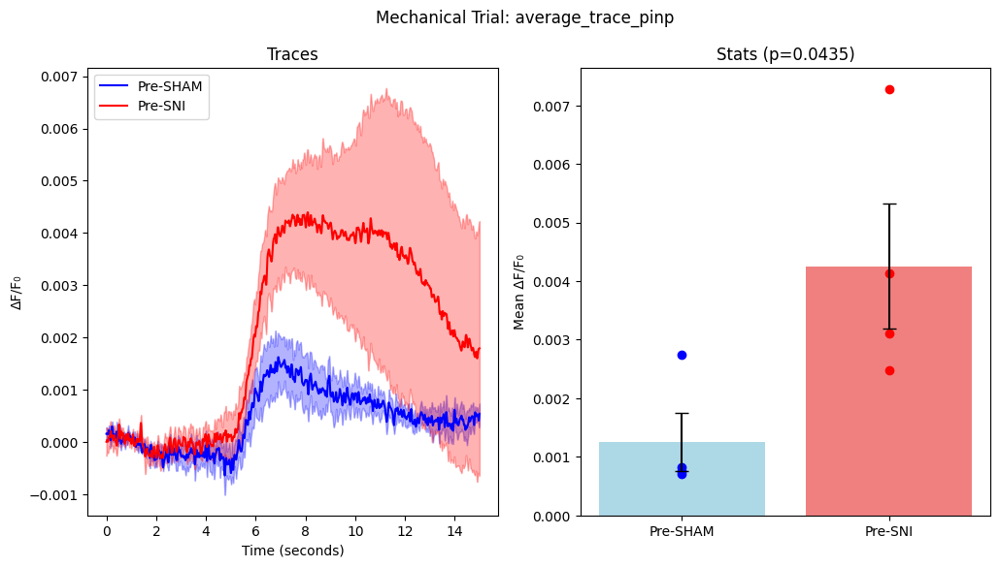

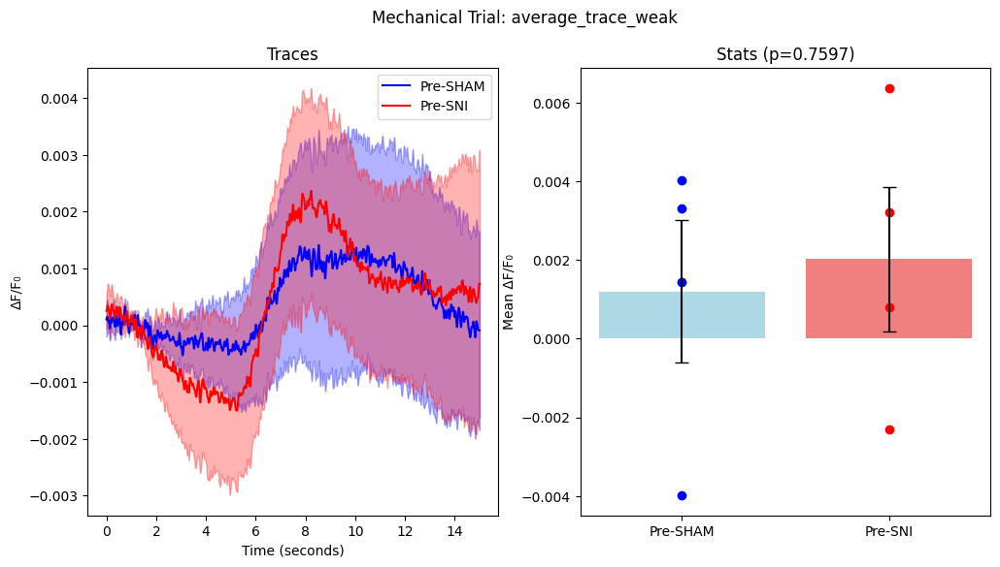

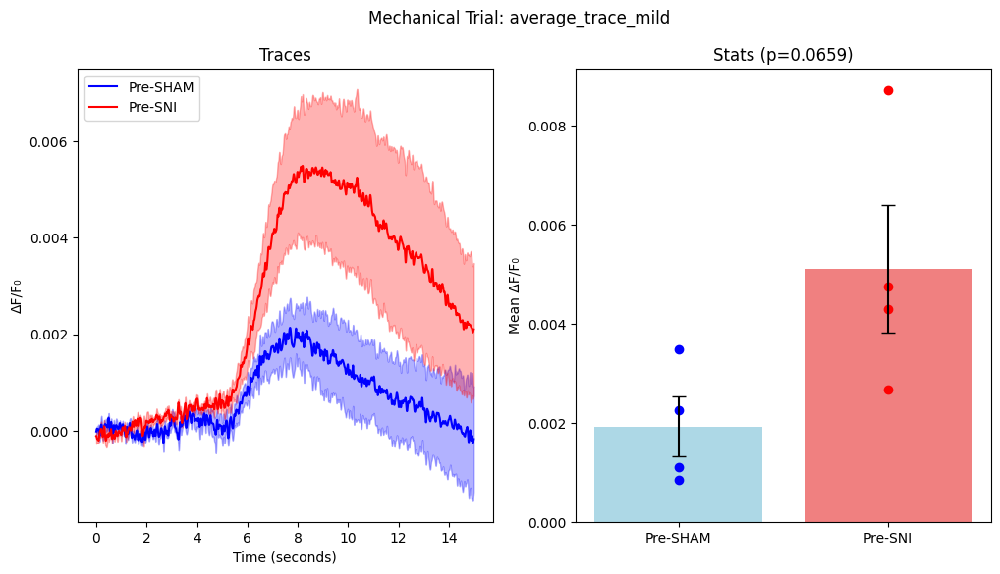

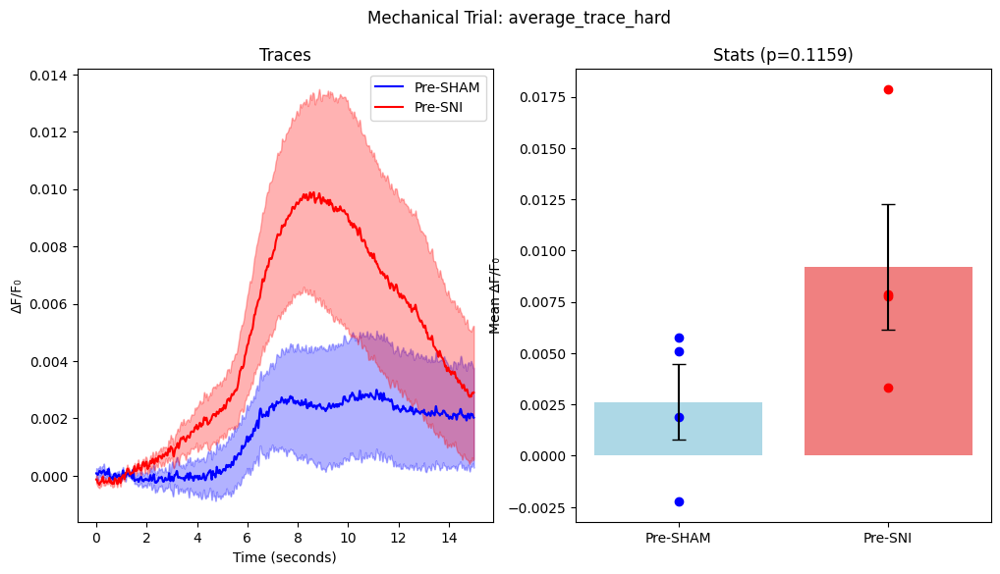

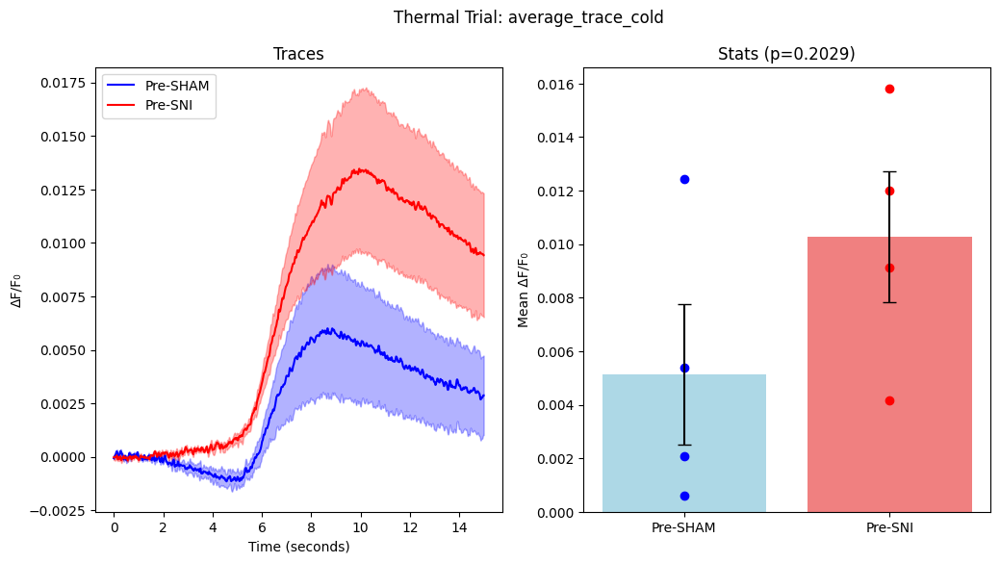

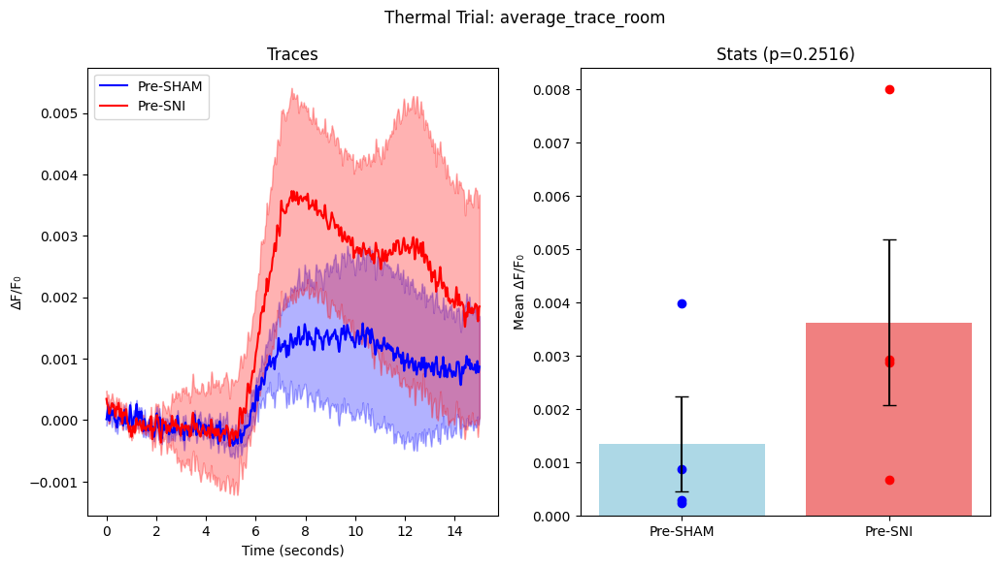

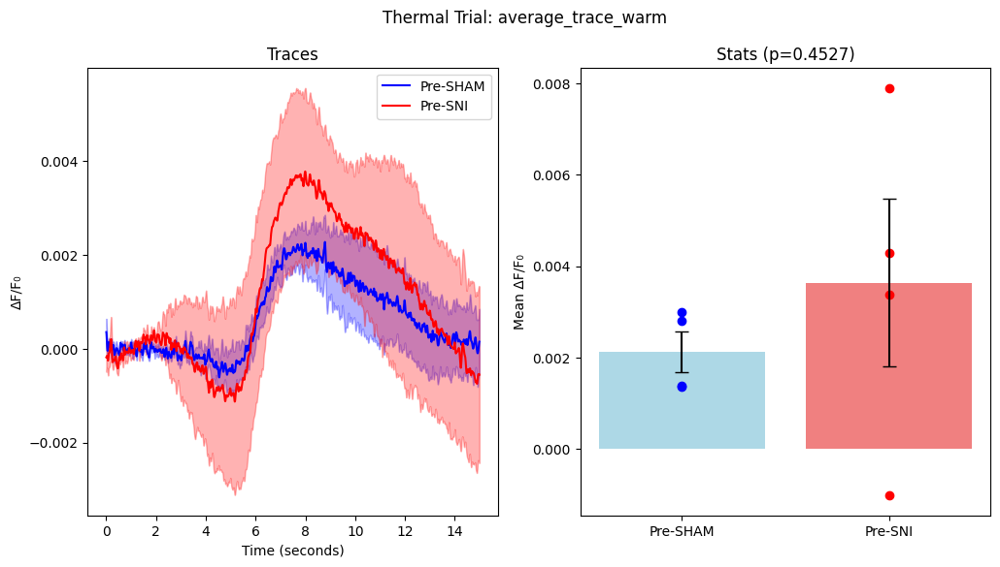

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind, ttest_rel
from scipy.ndimage import uniform_filter1d

 # Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/astro/sham_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'

""" sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/'

sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/' """

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Extracting and smoothing trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                smoothed_trace = smooth_trace(data.item()[trial], window_size)
                animal_trials[trial] = smoothed_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.5, 8)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.5, 8)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='Pre-SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='Pre-SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['Pre-SHAM', 'Pre-SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['Pre-SHAM']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['Pre-SNI']*len(sni_means), sni_means, color=color_sni)

    
    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Mean ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)


# SHAM VS SNI (np.max)

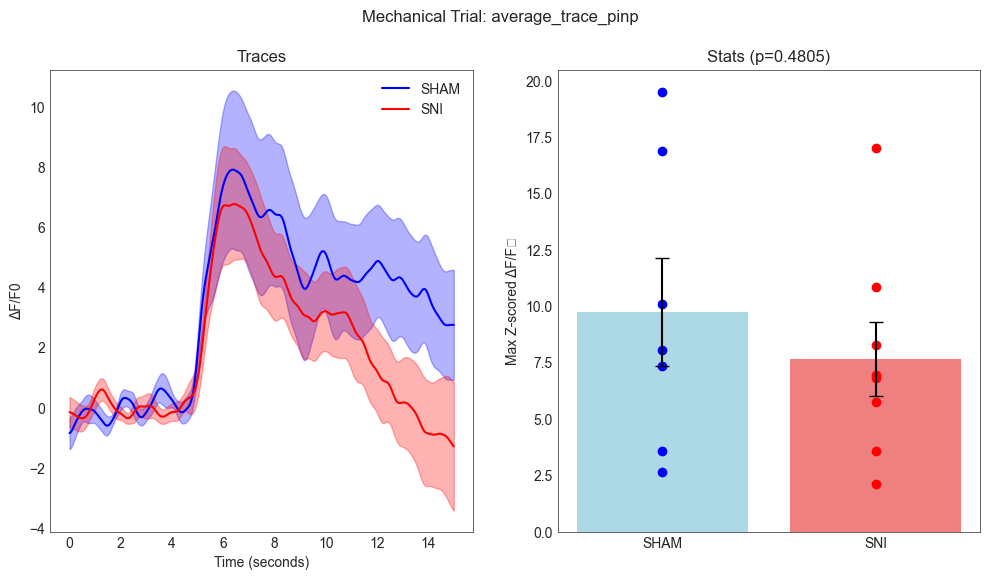

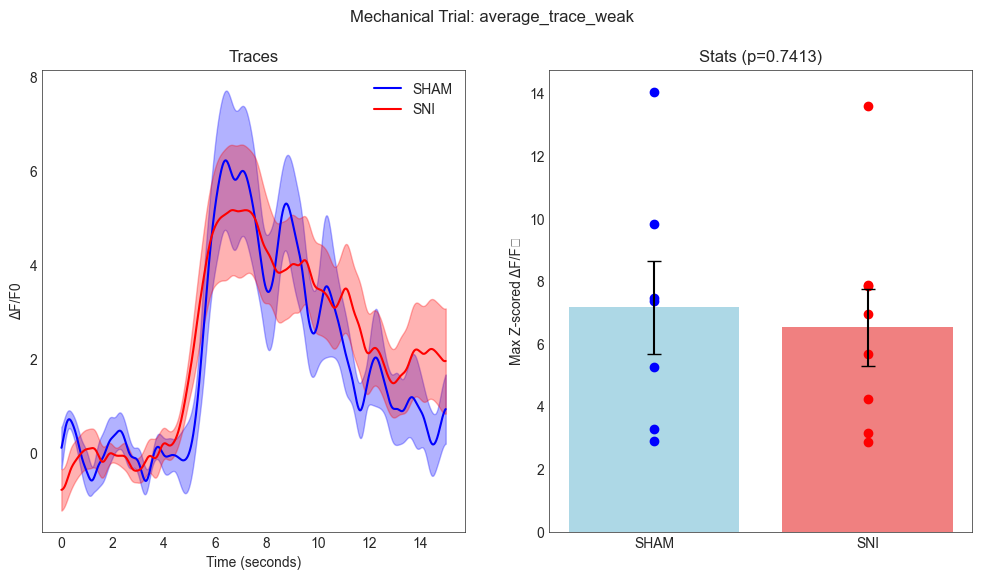

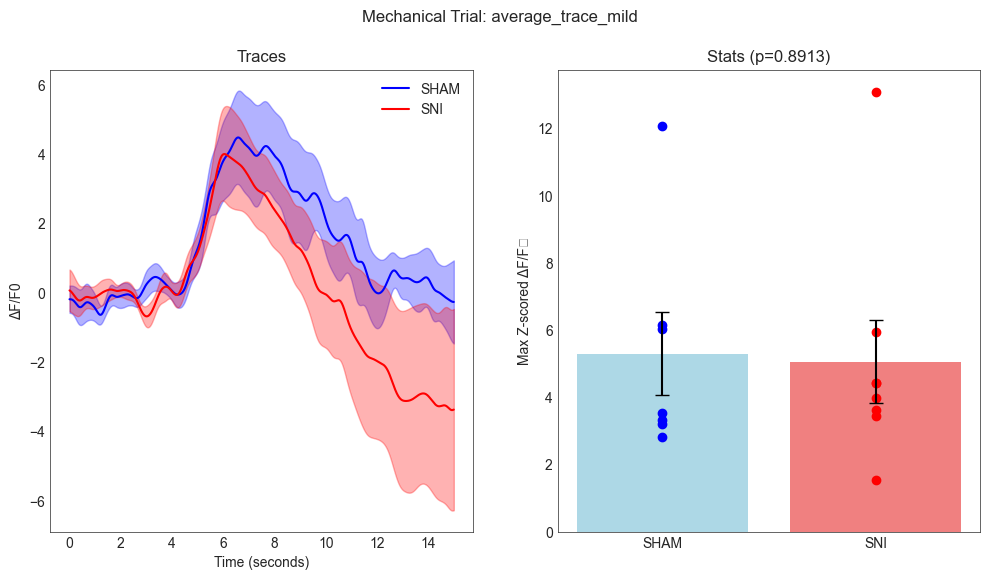

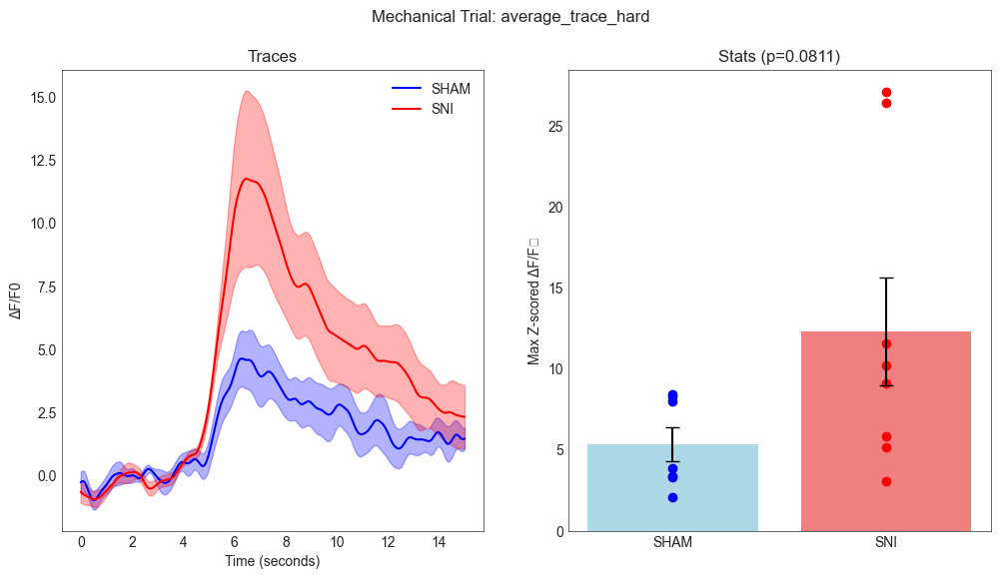

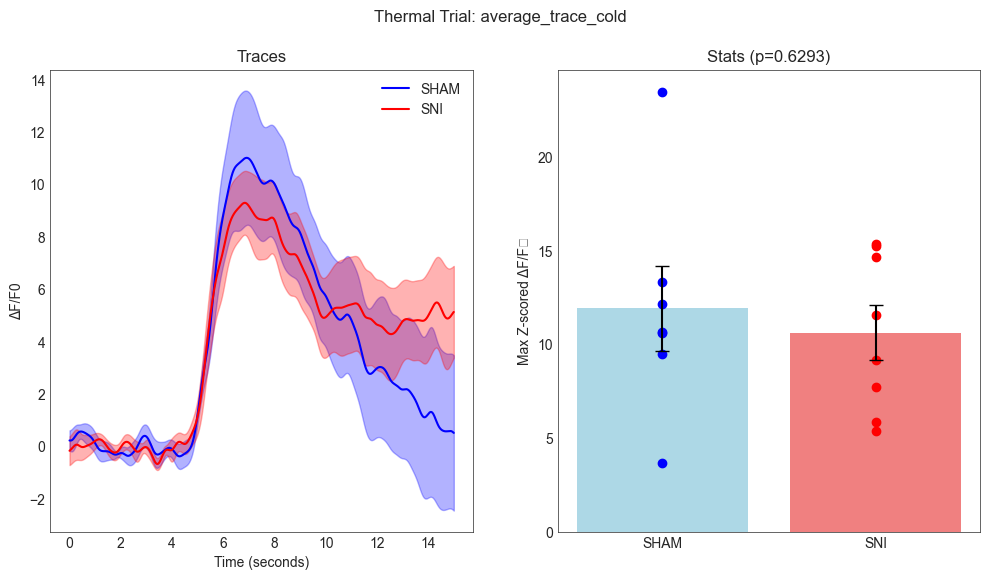

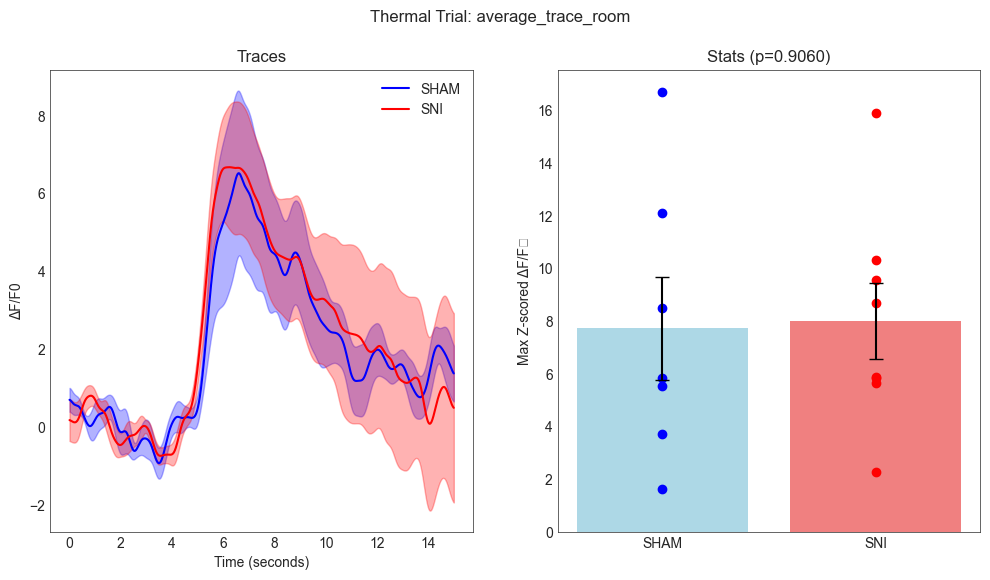

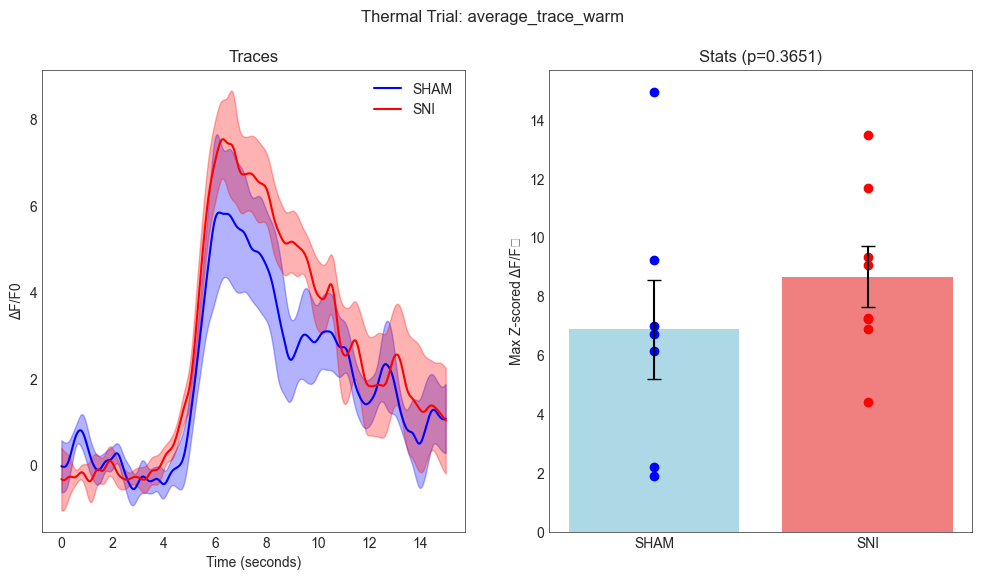

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grabda_trimmed/sham/'
sni_path = 'C:/files/data/sensory_stim/grabda_trimmed/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate max after sensory stimulus onset and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, onset_time, end_time):
    stats_results = {}
    onset_index = int(onset_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_max = [np.max(data[trial][onset_index:end_index]) for data in sham_data.values() if trial in data]
        sni_max = [np.max(data[trial][onset_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(sham_max, sni_max)
        stats_results[trial] = (sham_max, sni_max, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 5, 10)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 5, 10)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F0')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_max, sni_max, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_max), np.mean(sni_max)], 
               yerr=[sem(sham_max), sem(sni_max)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_max), sham_max, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_max), sni_max, color=color_sni)

    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Max Z-scored ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)

# SHAM vs. SNI (Z-score)

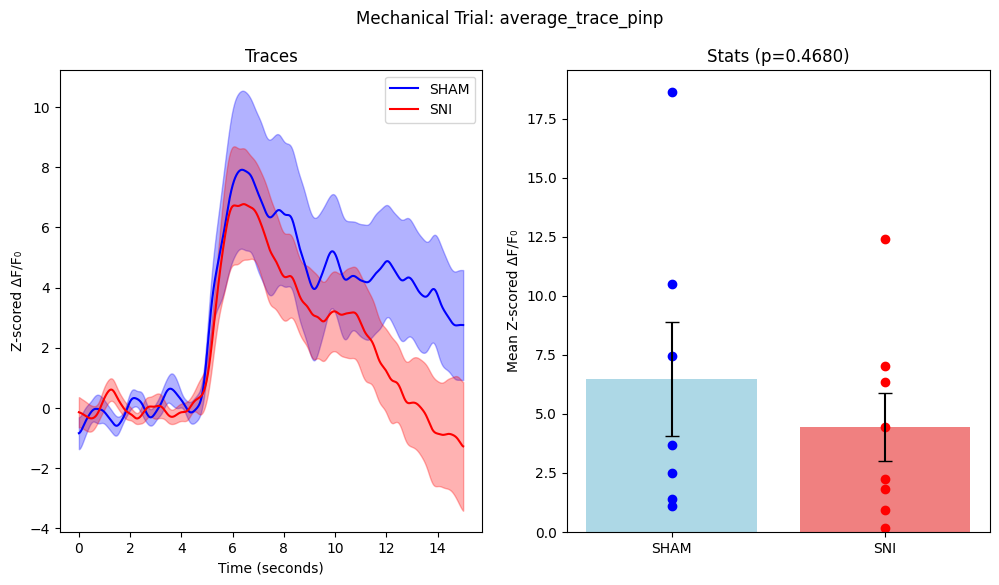

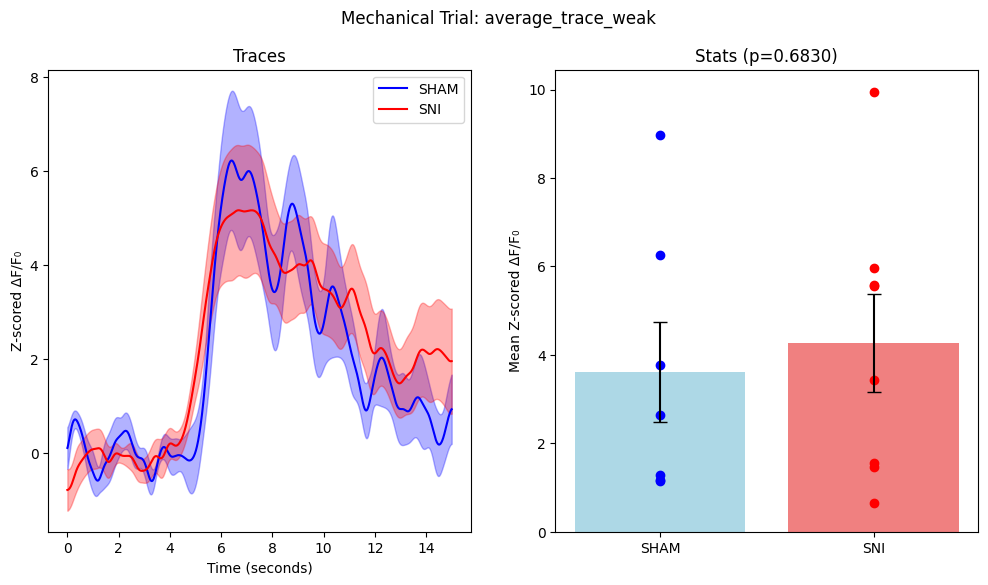

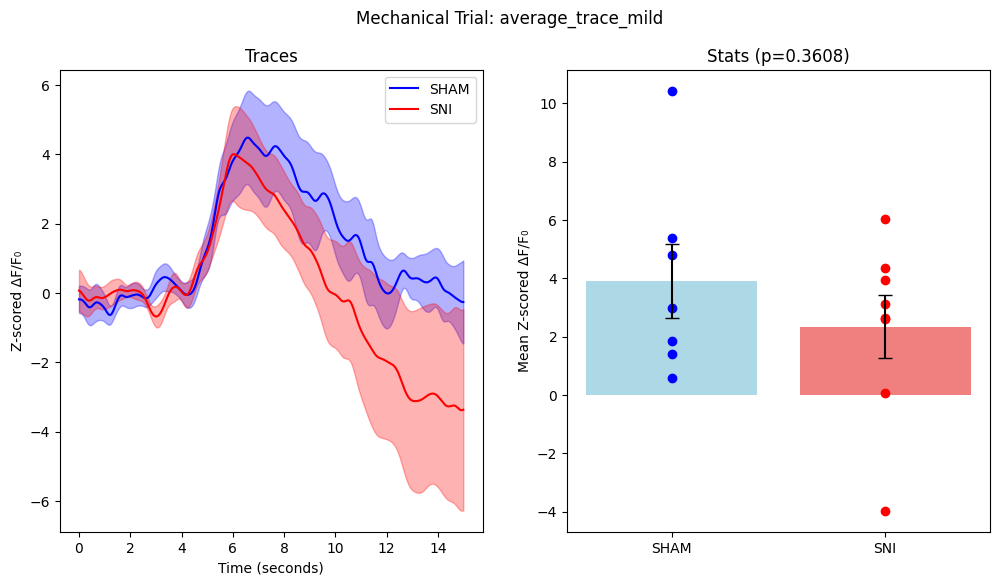

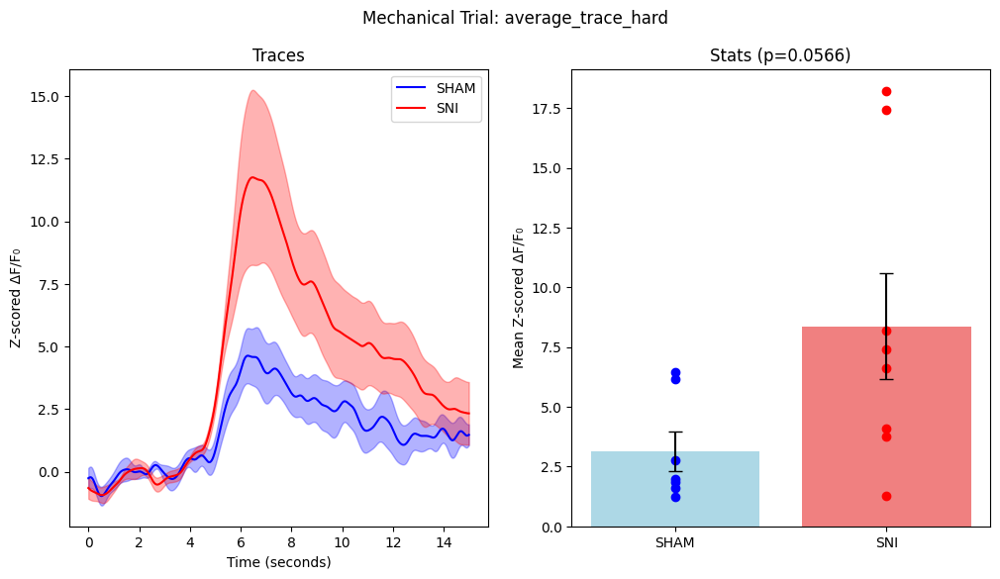

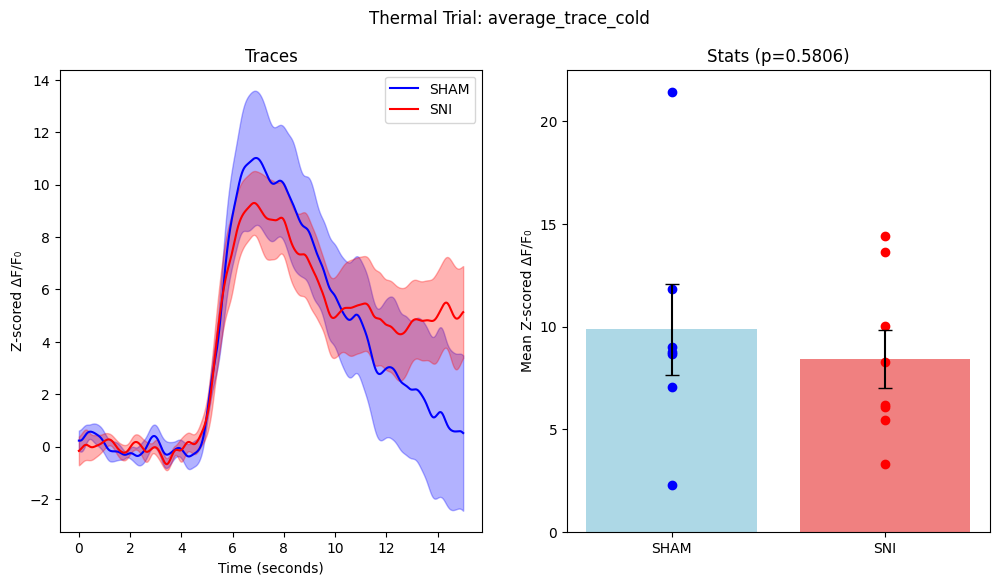

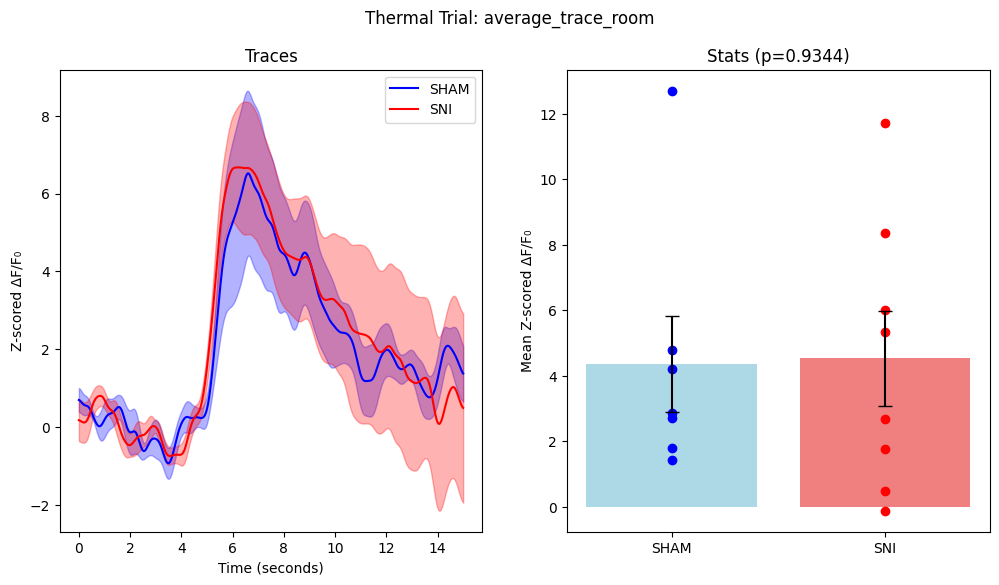

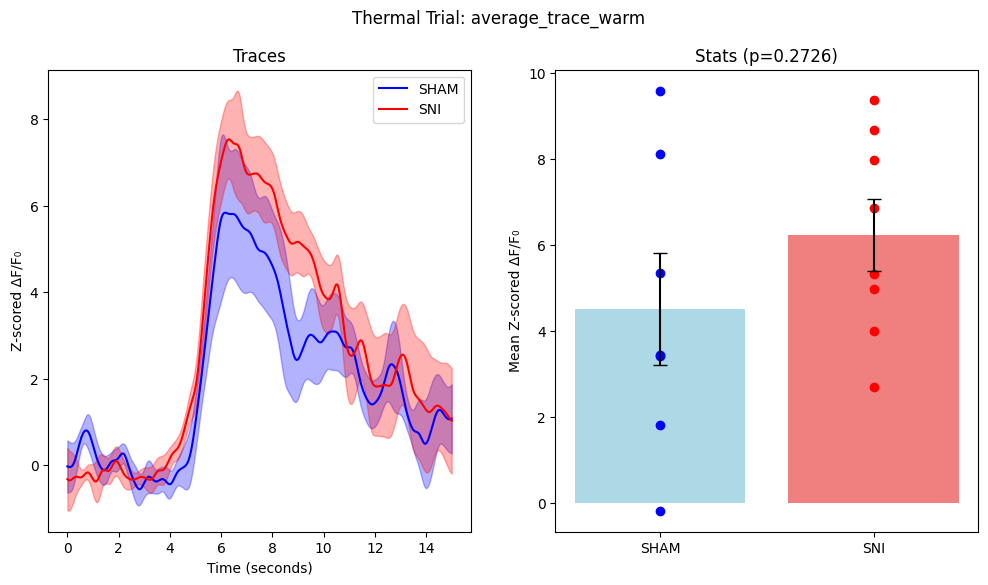

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind, ttest_rel
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grabda_trimmed/sham/'
sni_path = 'C:/files/data/sensory_stim/grabda_trimmed/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.8, 8.3)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.8, 8.3)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('Z-scored ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color=color_sni)

    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Mean Z-scored ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)

# SHAM vs SNI searching optimal window

Optimal Mechanical Windows:
average_trace_pinp: Start=7.90s, End=8.40s, p-value=0.4645
average_trace_weak: Start=6.10s, End=6.60s, p-value=0.6250
average_trace_mild: Start=7.90s, End=8.40s, p-value=0.3607
average_trace_hard: Start=7.80s, End=8.30s, p-value=0.0566

Optimal Thermal Windows:
average_trace_cold: Start=6.80s, End=7.30s, p-value=0.5290
average_trace_room: Start=6.00s, End=6.50s, p-value=0.7424
average_trace_warm: Start=7.80s, End=8.30s, p-value=0.2724


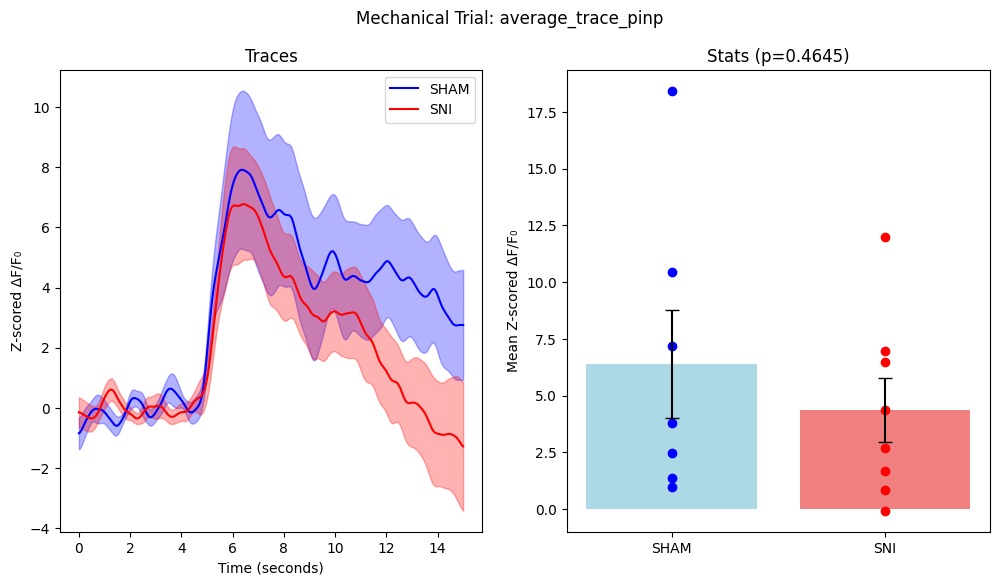

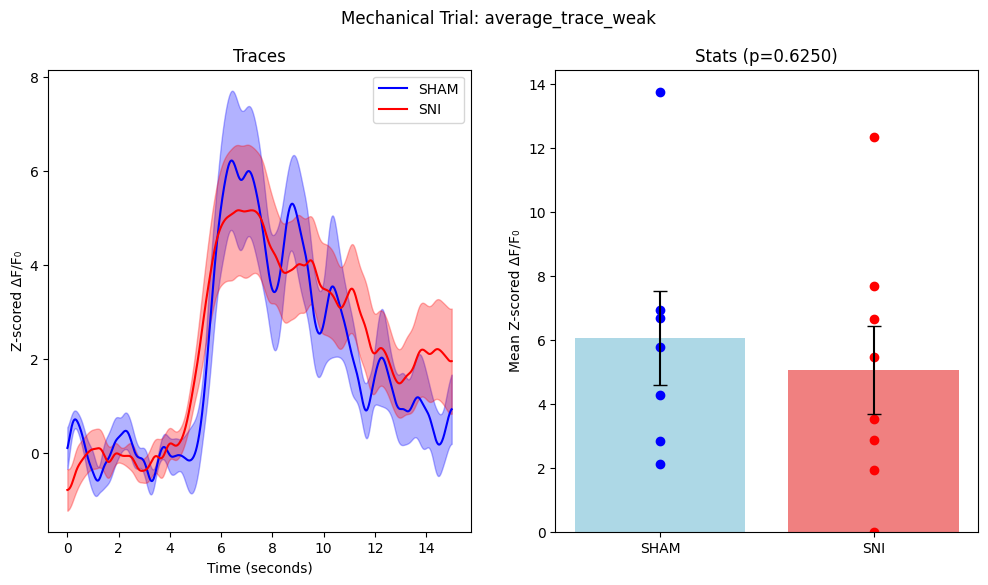

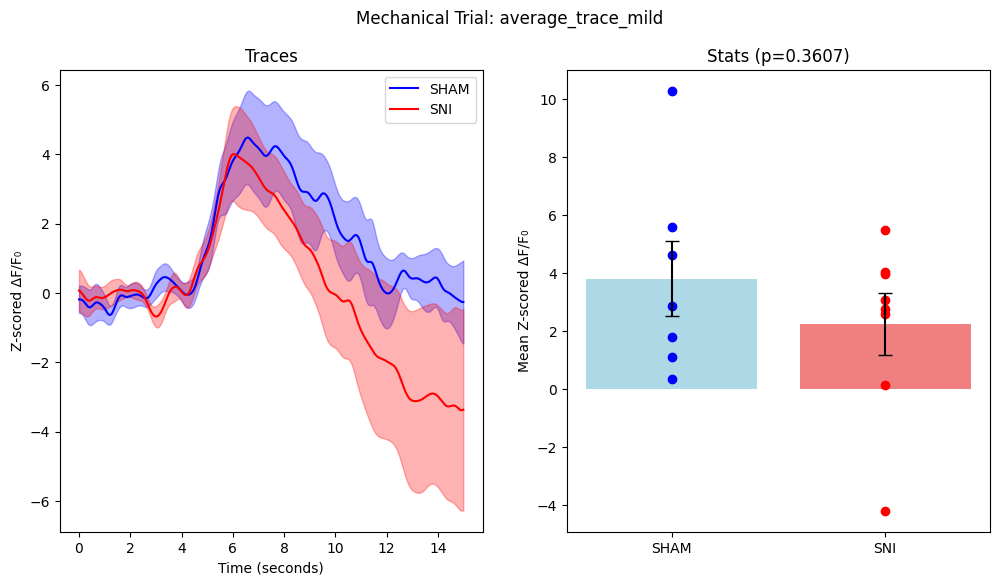

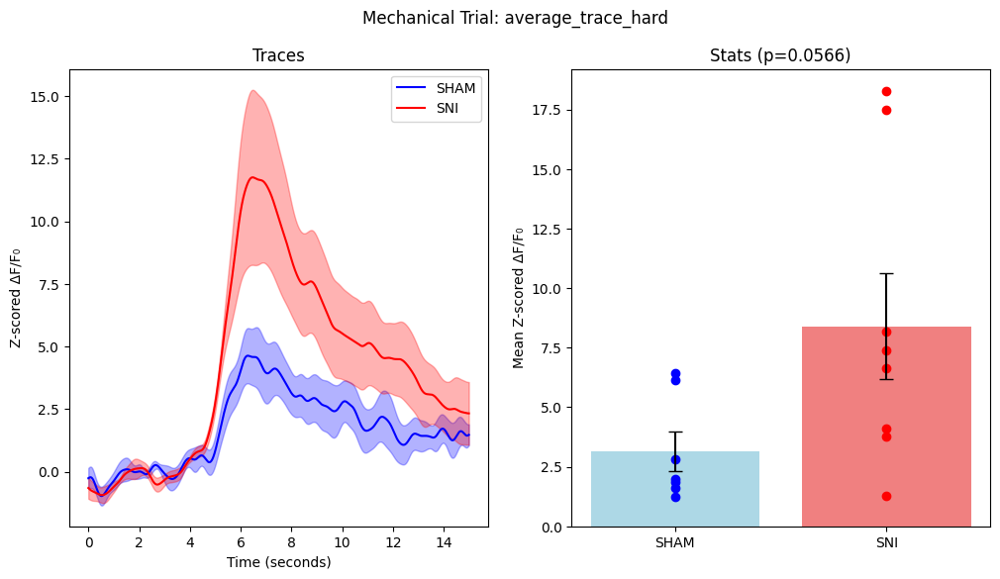

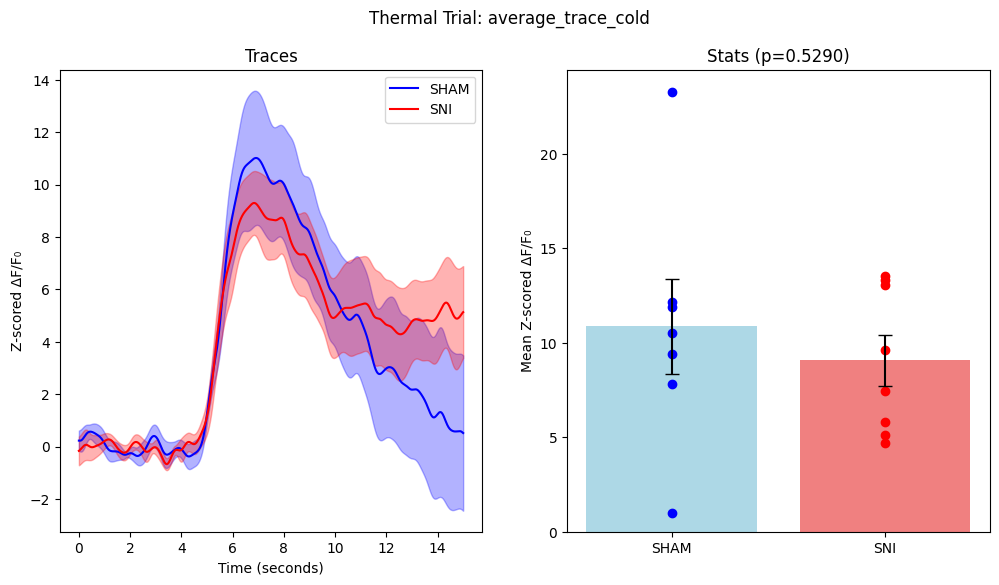

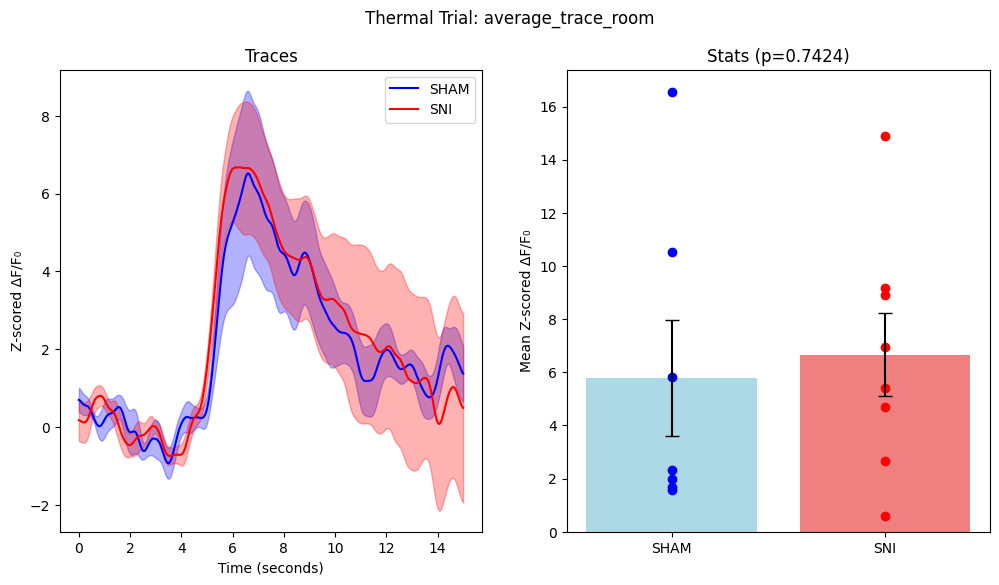

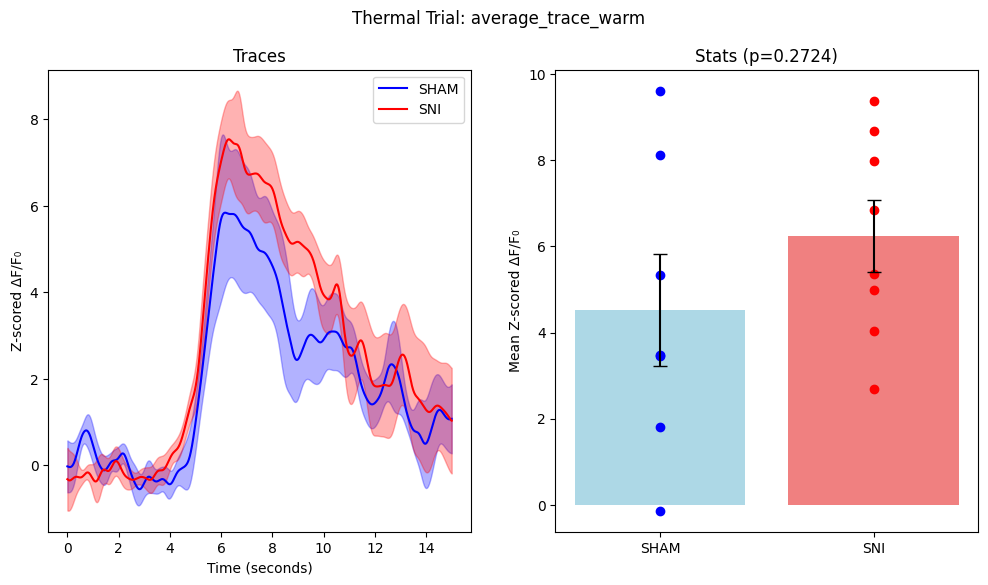

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grabda_trimmed/sham/'
sni_path = 'C:/files/data/sensory_stim/grabda_trimmed/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Function to search for the perfect time window with a fixed window width of 0.5 seconds
def search_optimal_window(sham_data, sni_data, trial_types, sampling_rate, window_width = 0.5):
    optimal_windows = {}
    window_width_indices = int(window_width * sampling_rate)
    
    for trial in trial_types:
        min_p_value = 1.0
        optimal_start_time = 0
        
        for start_time in np.arange(6, 8, 0.1):  # Adjust the range as needed
            end_time = start_time + window_width
            stats = compare_conditions(sham_data, sni_data, [trial], sampling_rate, start_time, end_time)
            p_value = stats[trial][3]
            
            if p_value < min_p_value:
                min_p_value = p_value
                optimal_start_time = start_time
        
        optimal_windows[trial] = (optimal_start_time, optimal_start_time + window_width, min_p_value)
    
    return optimal_windows

# Search for the optimal time window for mechanical and thermal trials
optimal_mechanical_windows = search_optimal_window(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130)
optimal_thermal_windows = search_optimal_window(sham_thermal_data, sni_thermal_data, thermal_trials, 130)

# Print the optimal windows
print("Optimal Mechanical Windows:")
for trial, (start, end, p_value) in optimal_mechanical_windows.items():
    print(f"{trial}: Start={start:.2f}s, End={end:.2f}s, p-value={p_value:.4f}")

print("\nOptimal Thermal Windows:")
for trial, (start, end, p_value) in optimal_thermal_windows.items():
    print(f"{trial}: Start={start:.2f}s, End={end:.2f}s, p-value={p_value:.4f}")

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color='blue')
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color='blue', alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color='red')
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color='red', alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('Z-scored ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=['lightblue', 'lightcoral'])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_means), sham_means, color='blue')
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color='red')

    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Mean Z-scored ΔF/F₀')
    
    plt.suptitle(title)
    plt.show()

# Plotting mechanical trials with optimal windows
for trial in mechanical_trials:
    start_time, end_time, _ = optimal_mechanical_windows[trial]
    mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, [trial], 130, start_time, end_time)
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials with optimal windows
for trial in thermal_trials:
    start_time, end_time, _ = optimal_thermal_windows[trial]
    thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, [trial], 130, start_time, end_time)
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)

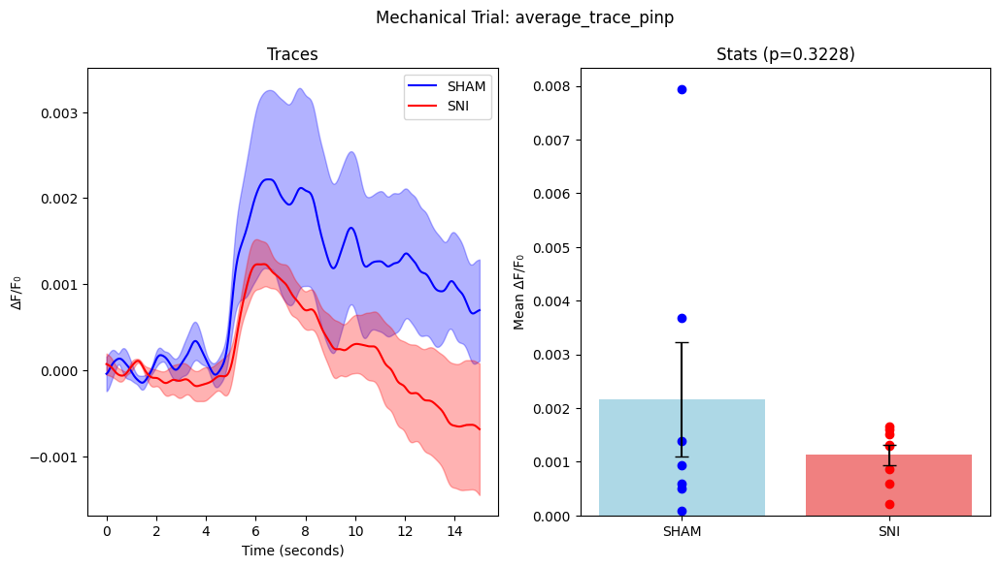

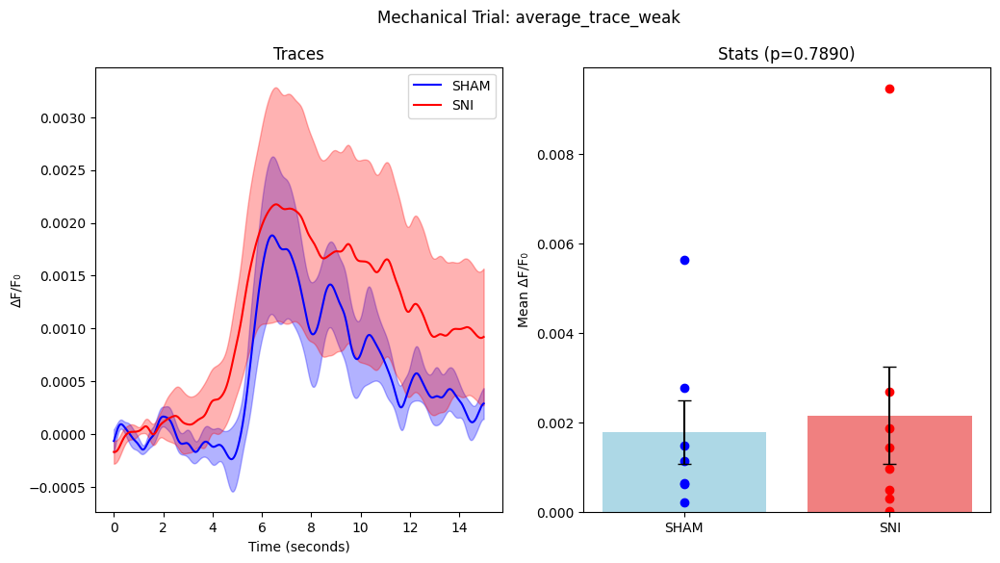

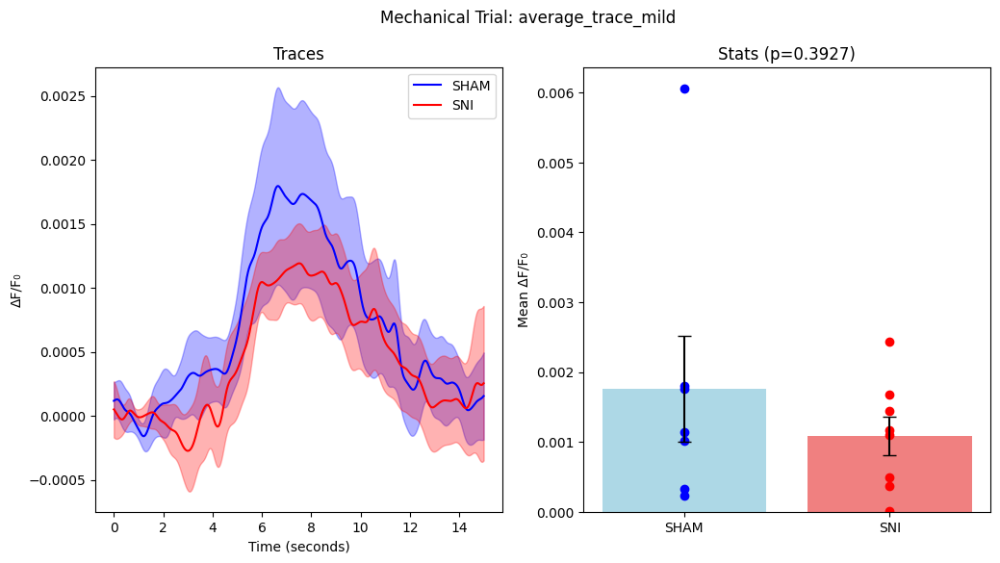

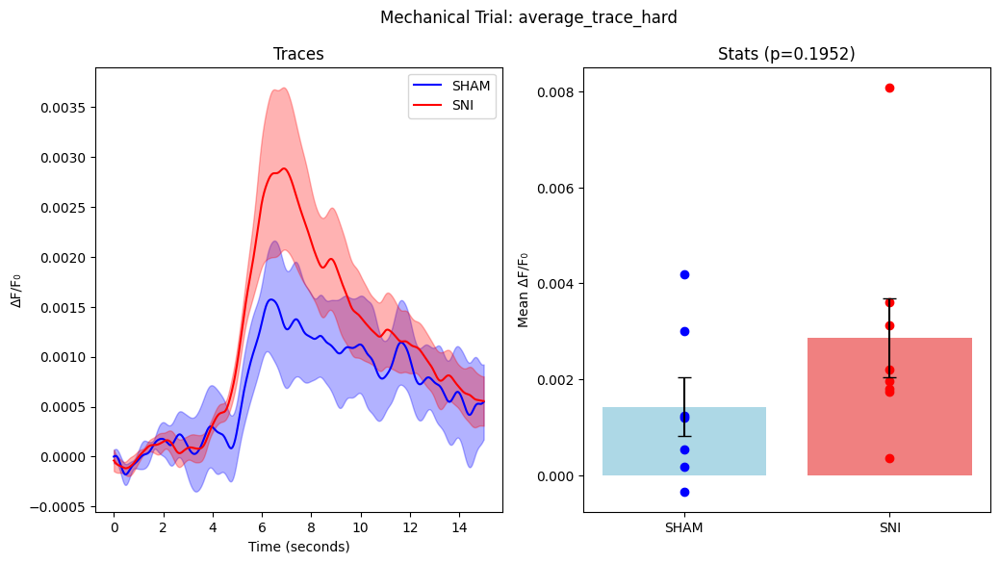

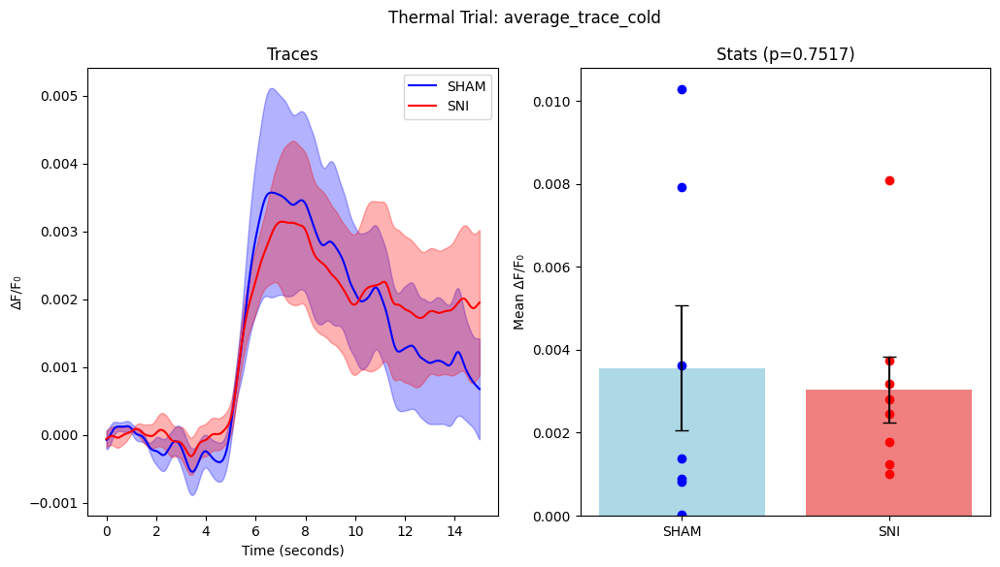

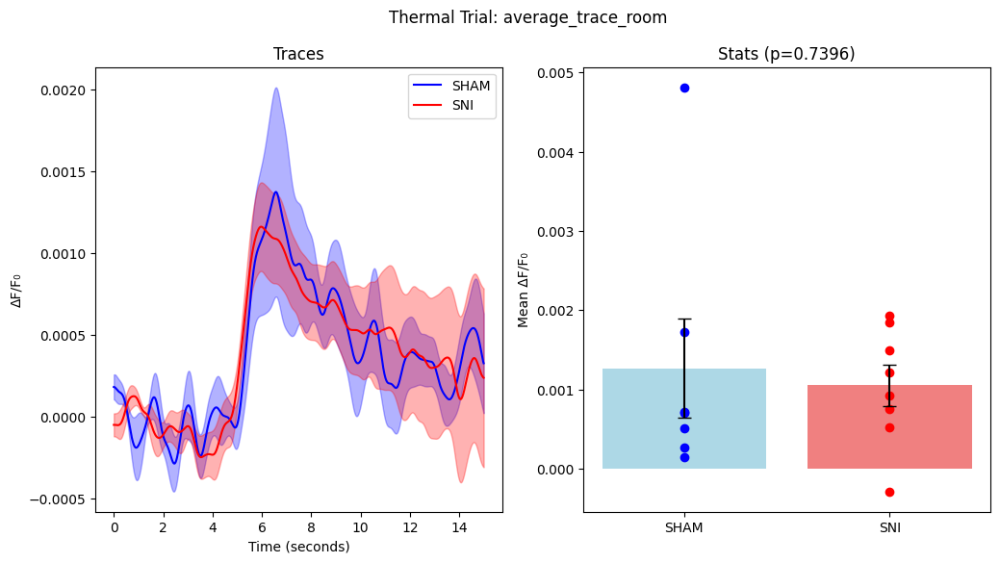

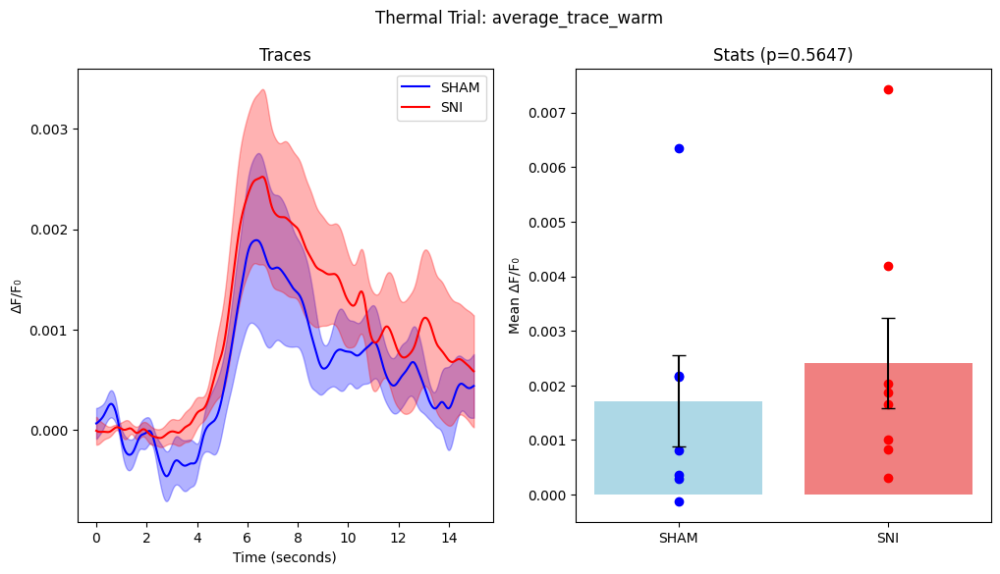

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind, ttest_rel
from scipy.ndimage import uniform_filter1d

 # Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grabda_trimmed/sham/'
sni_path = 'C:/files/data/sensory_stim/grabda_trimmed/sni/'

""" sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/'

sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/' """

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Extracting and smoothing trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                smoothed_trace = smooth_trace(data.item()[trial], window_size)
                animal_trials[trial] = smoothed_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 6.5, 7)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 6.5, 7)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color=color_sni)

    
    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Mean ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)


## mannwhitneyu test

average_trace_pinp
0.9550893550893552
average_trace_weak
0.778865578865579
average_trace_mild
0.8665112665112666
average_trace_hard
0.028904428904428903
average_trace_cold
0.778865578865579
average_trace_room
0.6943278943278944
average_trace_warm
0.46340326340326343


c:\Users\huang\AppData\Local\anaconda3\lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
  func(*args, **kwargs)
c:\Users\huang\AppData\Local\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


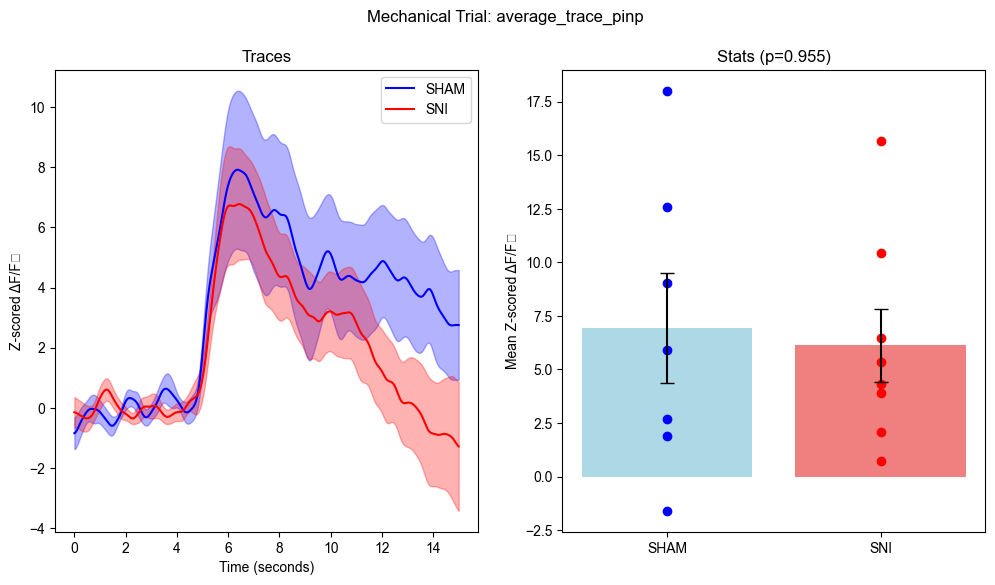

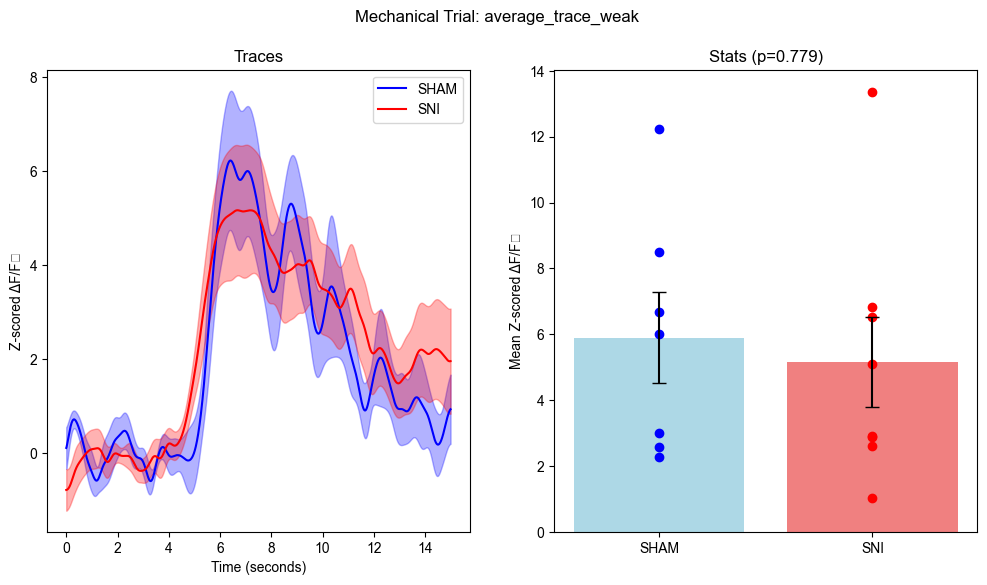

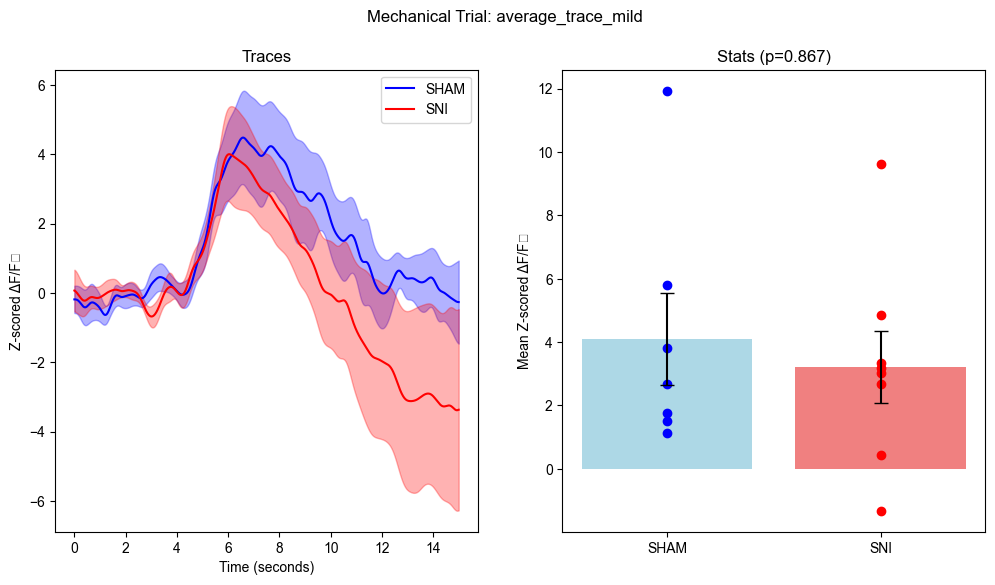

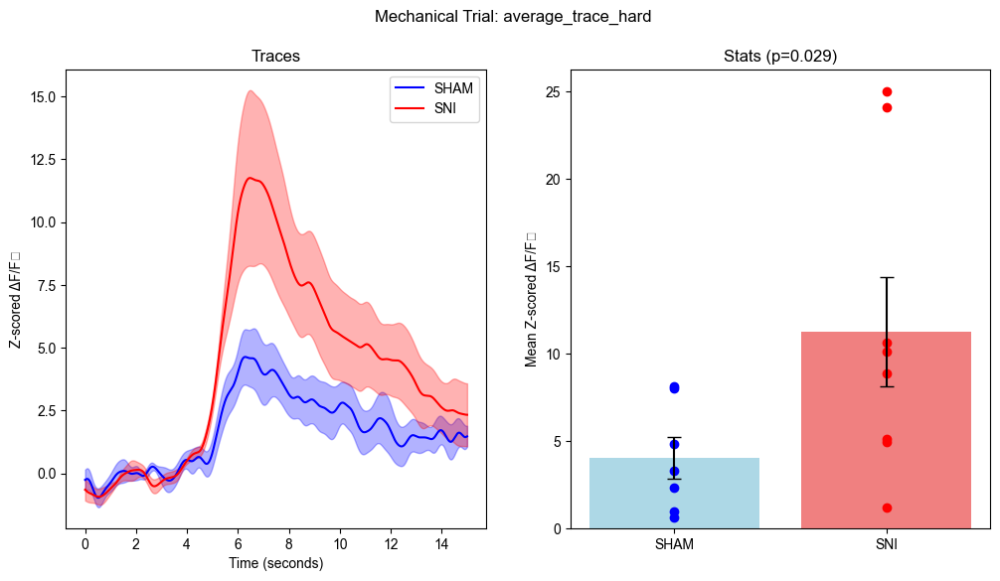

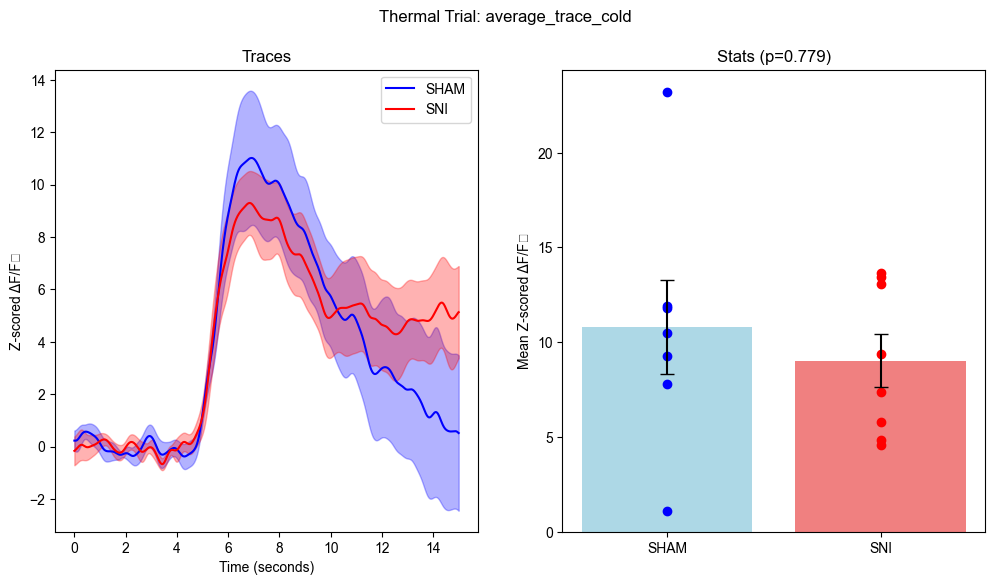

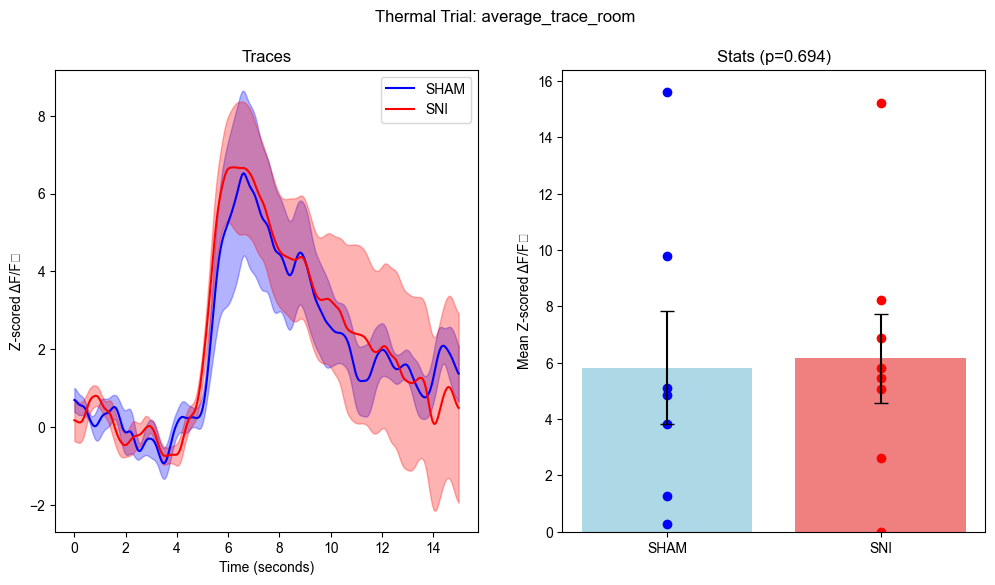

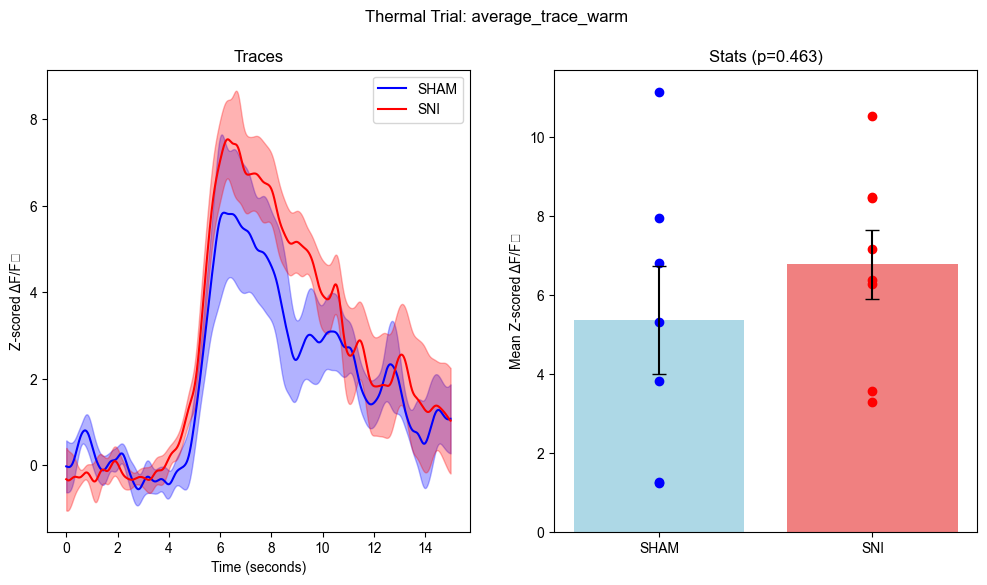

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, mannwhitneyu
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grabda_trimmed/sham/'
sni_path = 'C:/files/data/sensory_stim/grabda_trimmed/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform Mann-Whitney U test
        u_stat, p_value = mannwhitneyu(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, u_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 6.85, 7.35)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 6.85, 7.35)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('Z-scored ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, u_stat, p_value = stats[trial_type]
    print(trial_type)
    print(p_value)
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color=color_sni)

    axs[1].set_title(f'Stats (p={p_value:.3f})')
    axs[1].set_ylabel('Mean Z-scored ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    #plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)

# plot group

In [25]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from matplotlib.lines import Line2D  # For custom legend

sampling_rate = 130 

# Set up plot parameters
plt.style.use('seaborn-white')
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['xtick.major.width'] = 0.5
plt.rcParams['ytick.major.width'] = 0.5

# Create figure with equal-sized rows
fig = plt.figure(figsize=(8.5, 11))  # Letter paper size
gs = gridspec.GridSpec(4, 4, figure=fig, hspace=1.0, wspace=1.5, 
                      height_ratios=[1, 1, 1, 1])  # Equal row heights

# Define color scheme
COLORS = {
    'sham': '#1f77b4',
    'sni': '#d62728',
    'sham_light': '#8ab4d6',
    'sni_light': '#e69a9a'
}

# Define plot order and labels
PLOT_STRUCTURE = [
    (('mechanical', 'average_trace_hard', '2.0g'), ('mechanical', 'average_trace_pinp', 'Pinprick')),
    (('mechanical', 'average_trace_mild', '0.4g'), ('mechanical', 'average_trace_weak', '0.07g')),
    (('thermal', 'average_trace_cold', 'Cold'), ('thermal', 'average_trace_warm', 'Heat')),
    (('thermal', 'average_trace_room', 'Room Temperature'),)
]

# Function to get appropriate data
def get_trial_data(trial_category, trial_type):
    if trial_category == 'mechanical':
        return (
            sham_mechanical_avg_sem[trial_type],
            sni_mechanical_avg_sem[trial_type],
            mechanical_stats[trial_type]
        )
    elif trial_category == 'thermal':
        return (
            sham_thermal_avg_sem[trial_type],
            sni_thermal_avg_sem[trial_type],
            thermal_stats[trial_type]
        )
    else:
        raise ValueError(f"Unknown trial category: {trial_category}")

# Add legend only once
legend_added = False

def plot_trial_pair(row_idx, trial_pair):
    global legend_added
    for col_idx, (category, trial_type, title) in enumerate(trial_pair):
        # Create axes using GridSpec
        trace_ax = fig.add_subplot(gs[row_idx, col_idx*2])
        stats_ax = fig.add_subplot(gs[row_idx, col_idx*2+1])
        
        # Get data
        sham_data, sni_data, stats = get_trial_data(category, trial_type)
        sham_avg, sham_sem = sham_data
        sni_avg, sni_sem = sni_data
        sham_means, sni_means, _, p_value = stats
        
        # Create time axis with 5-second offset
        time_axis = (np.arange(len(sham_avg)) / sampling_rate) - 5
        
        # Plot traces
        trace_ax.plot(time_axis, sham_avg, color=COLORS['sham'], lw=1.5)
        trace_ax.fill_between(time_axis, sham_avg-sham_sem, sham_avg+sham_sem, 
                            color=COLORS['sham_light'], alpha=0.3)
        trace_ax.plot(time_axis, sni_avg, color=COLORS['sni'], lw=1.5)
        trace_ax.fill_between(time_axis, sni_avg-sni_sem, sni_avg+sni_sem, 
                            color=COLORS['sni_light'], alpha=0.3)
        
        # Format trace plot
        trace_ax.set_xlim(-5, 10)
        trace_ax.set_ylim(-5, 15)
        trace_ax.set_xticks([-5, 0, 5, 10])
        trace_ax.set_yticks(np.arange(-5, 16, 5))
        
        # Centered gray stimulus window at 0 ± 0.25s
        trace_ax.axvspan(-0.25, 0.25, color='gray', alpha=0.2, zorder=0)
        
        # Remove borders
        for spine in ['top', 'right']:
            trace_ax.spines[spine].set_visible(False)
        
        # Add titles
        trace_ax.set_title(title, fontsize=11, pad=10)
        if col_idx == 0:
            trace_ax.set_ylabel('Z-scored ΔF/F₀', fontsize=10)

        # Add legend only to first plot
        if not legend_added and row_idx == 0 and col_idx == 0:
            legend_elements = [
                Line2D([0], [0], color=COLORS['sham'], lw=2, label='SHAM'),
                Line2D([0], [0], color=COLORS['sni'], lw=2, label='SNI')
            ]
            trace_ax.legend(handles=legend_elements, loc='upper right', frameon=False)
            legend_added = True

        # Plot statistics
        stats_ax.scatter([0]*len(sham_means), sham_means, 
                       color=COLORS['sham'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
        stats_ax.scatter([1]*len(sni_means), sni_means, 
                       color=COLORS['sni'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
        
        # Mean lines
        stats_ax.hlines(np.mean(sham_means), -0.2, 0.2, color=COLORS['sham'], lw=2)
        stats_ax.hlines(np.mean(sni_means), 0.8, 1.2, color=COLORS['sni'], lw=2)
        
        # Format stats plot
        stats_ax.set_xlim(-0.5, 1.5)
        stats_ax.set_xticks([0, 1])
        stats_ax.set_xticklabels(['SHAM', 'SNI'], rotation=45, ha='right', fontsize=9)
        
        # Position p-value above plot
        y_max = max(np.max(sham_means), np.max(sni_means))
        stats_ax.text(0.5, 1.15, f'p = {p_value:.3f}', 
                    ha='center', va='bottom', fontsize=9,
                    transform=stats_ax.transAxes)
        
        # Remove borders
        for spine in ['top', 'right']:
            stats_ax.spines[spine].set_visible(False)

# Plot all trial pairs
for row_idx, trial_pair in enumerate(PLOT_STRUCTURE[:3]):
    plot_trial_pair(row_idx, trial_pair)

# Room temperature plot (same size as others)
row_idx = 3
trace_ax = fig.add_subplot(gs[row_idx, 0])  # First column
stats_ax = fig.add_subplot(gs[row_idx, 1])  # Second column

# Get room temperature data
category, trial_type, title = PLOT_STRUCTURE[3][0]
sham_data, sni_data, stats = get_trial_data(category, trial_type)
sham_avg, sham_sem = sham_data
sni_avg, sni_sem = sni_data
sham_means, sni_means, _, p_value = stats

# Create time axis
time_axis = (np.arange(len(sham_avg)) / sampling_rate) - 5

# Plot traces
trace_ax.plot(time_axis, sham_avg, color=COLORS['sham'], lw=1.5)
trace_ax.fill_between(time_axis, sham_avg-sham_sem, sham_avg+sham_sem, 
                    color=COLORS['sham_light'], alpha=0.3)
trace_ax.plot(time_axis, sni_avg, color=COLORS['sni'], lw=1.5)
trace_ax.fill_between(time_axis, sni_avg-sni_sem, sni_avg+sni_sem, 
                    color=COLORS['sni_light'], alpha=0.3)

# Format room temperature plot
trace_ax.set_xlim(-5, 10)
trace_ax.set_ylim(-5, 15)
trace_ax.set_xticks([-5, 0, 5, 10])
trace_ax.set_yticks(np.arange(-5, 16, 5))
trace_ax.axvspan(-0.25, 0.25, color='gray', alpha=0.2, zorder=0)
trace_ax.set_title(title, fontsize=11, pad=10)
trace_ax.set_xlabel('Time (seconds)', fontsize=10)
for spine in ['top', 'right']:
    trace_ax.spines[spine].set_visible(False)

# Plot room temperature stats
stats_ax.scatter([0]*len(sham_means), sham_means, 
               color=COLORS['sham'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
stats_ax.scatter([1]*len(sni_means), sni_means, 
               color=COLORS['sni'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
stats_ax.hlines(np.mean(sham_means), -0.2, 0.2, color=COLORS['sham'], lw=2)
stats_ax.hlines(np.mean(sni_means), 0.8, 1.2, color=COLORS['sni'], lw=2)
stats_ax.set_xlim(-0.5, 1.5)
stats_ax.set_xticks([0, 1])
stats_ax.set_xticklabels(['SHAM', 'SNI'], rotation=45, ha='right', fontsize=9)
y_max = max(np.max(sham_means), np.max(sni_means))
stats_ax.text(0.5, 1.15, f'p = {p_value:.3f}', 
            ha='center', va='bottom', fontsize=9,
            transform=stats_ax.transAxes)
for spine in ['top', 'right']:
    stats_ax.spines[spine].set_visible(False)

# Final adjustments
fig.align_labels()  # Align y-labels across all rows
plt.savefig('final_plot_corrected.svg', format='svg', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\huang\AppData\Local\Temp\ipykernel_3296\2410536052.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')
C:\Users\huang\AppData\Local\Temp\ipykernel_3296\2410536052.py:189: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
  plt.savefig('final_plot_corrected.svg', format='svg', bbox_inches='tight', dpi=300)


# plot group for 5-ht

average_trace_pinp
0.8181818181818182
average_trace_weak
0.6991341991341992
average_trace_mild
0.9372294372294373
average_trace_hard
0.17965367965367965
average_trace_cold
0.04112554112554113
average_trace_room
0.025974025974025976
average_trace_warm
0.6991341991341992


C:\Users\huang\AppData\Local\Temp\ipykernel_24724\244870831.py:171: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')
c:\Users\huang\AppData\Local\anaconda3\lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
  func(*args, **kwargs)
c:\Users\huang\AppData\Local\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


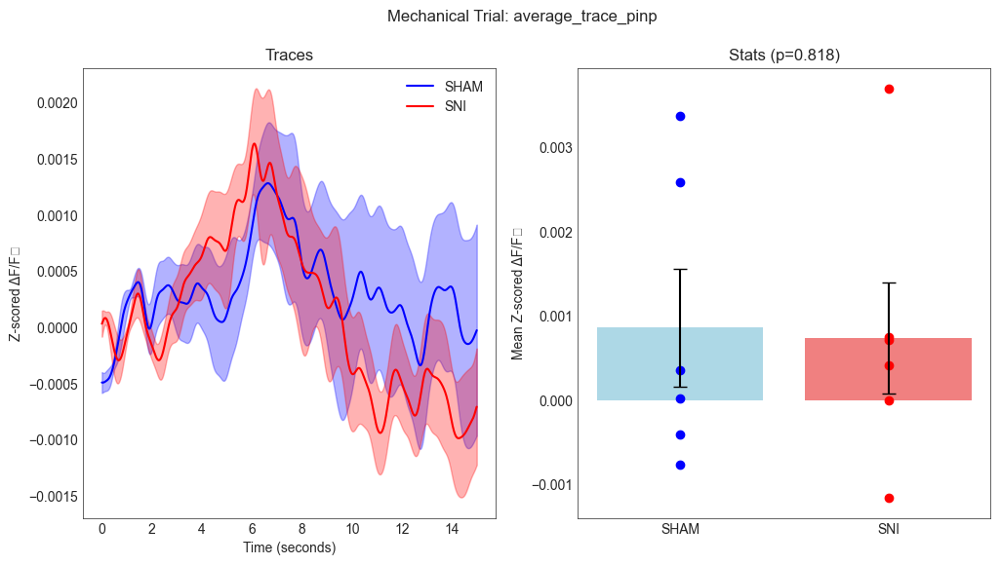

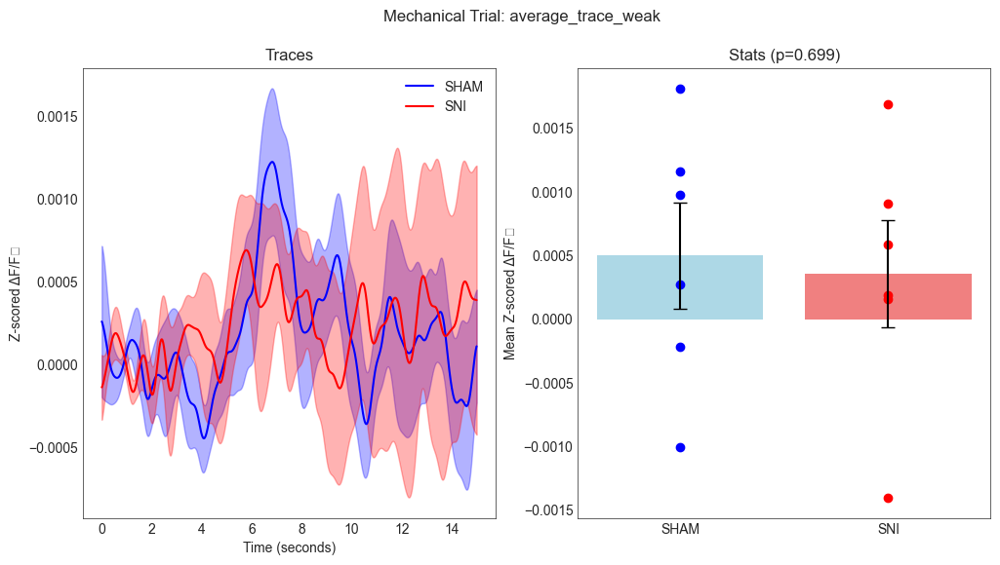

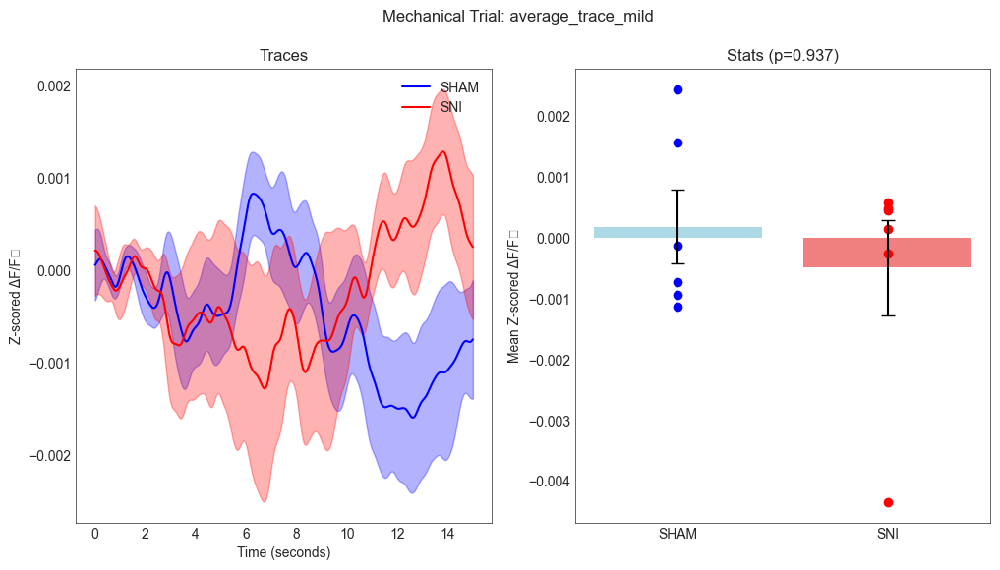

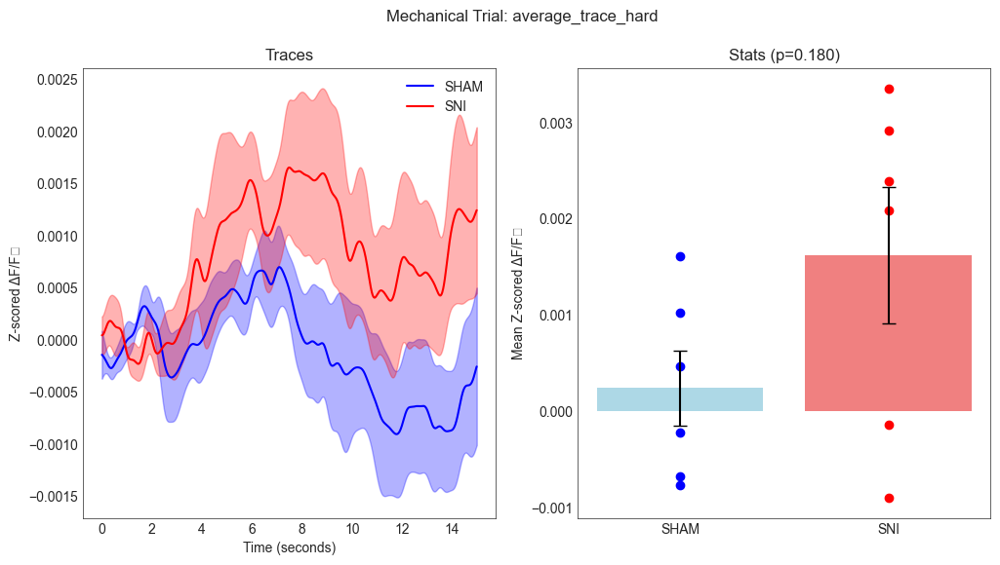

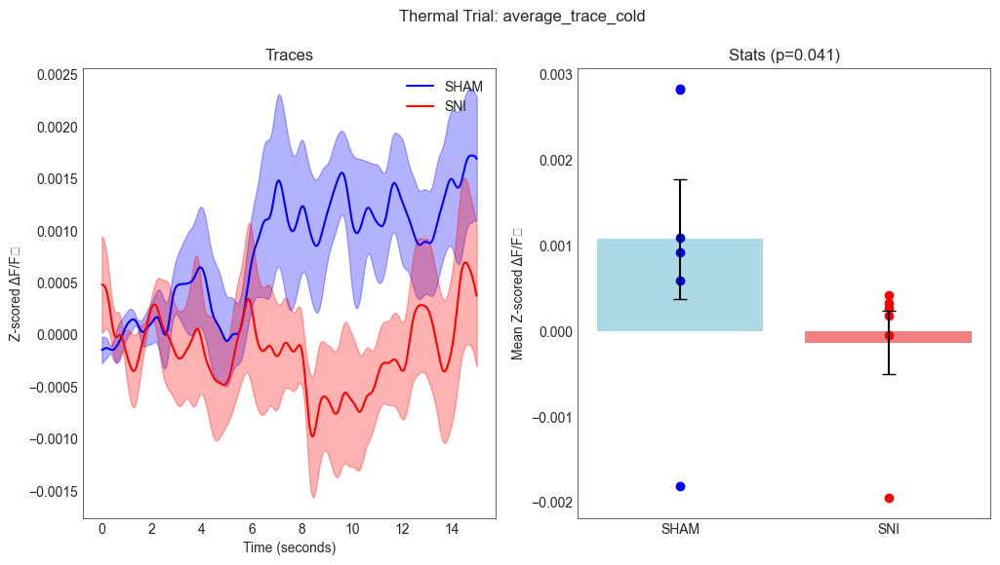

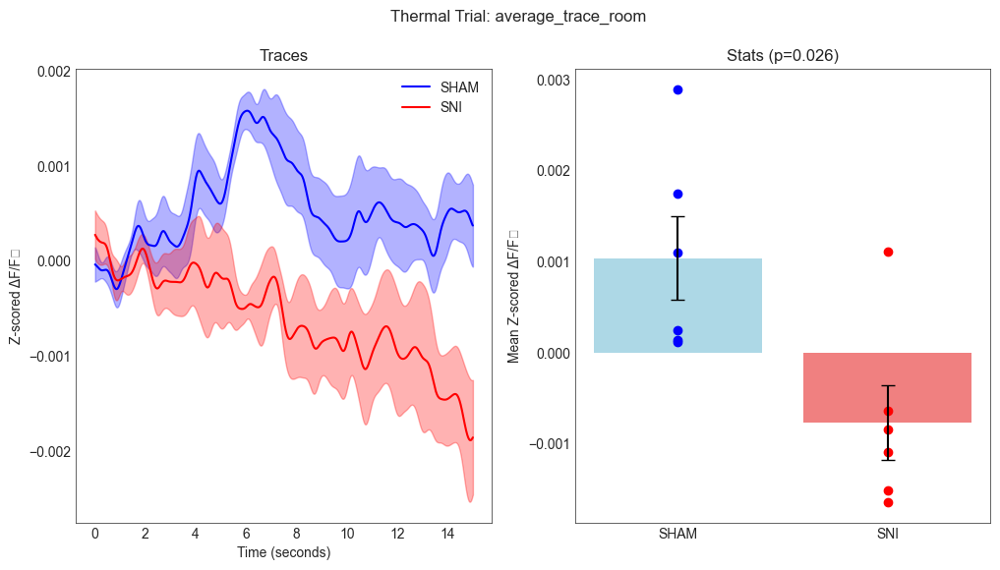

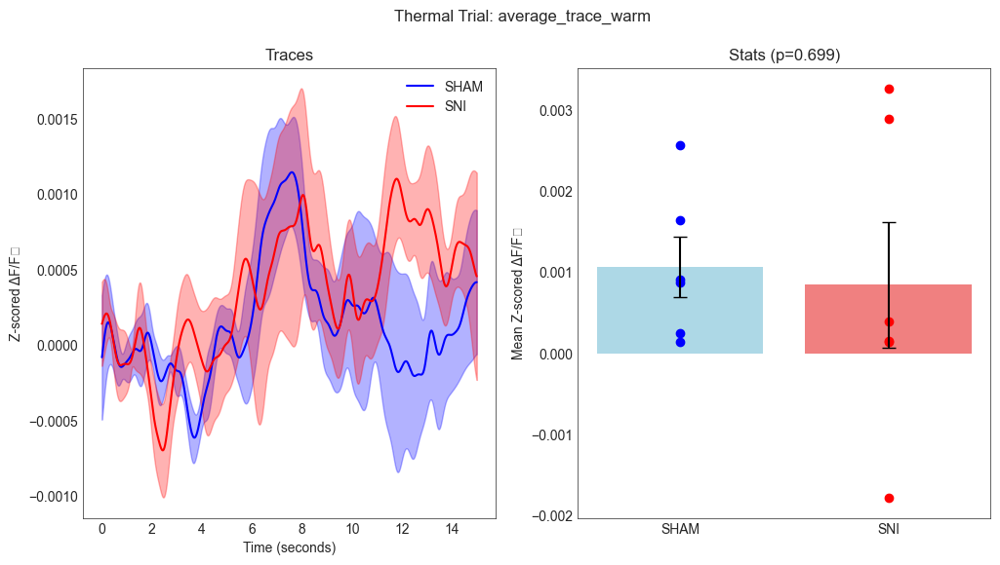

In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, mannwhitneyu
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grab5ht/sham/'
sni_path = 'C:/files/data/sensory_stim/grab5ht/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
#                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                z_scored_trace = smoothed_trace
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform Mann-Whitney U test
        u_stat, p_value = mannwhitneyu(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, u_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.5, 8.0)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.5, 8.0)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('Z-scored ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, u_stat, p_value = stats[trial_type]
    print(trial_type)
    print(p_value)
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color=color_sni)

    axs[1].set_title(f'Stats (p={p_value:.3f})')
    axs[1].set_ylabel('Mean Z-scored ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    #plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)



import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from matplotlib.lines import Line2D  # For custom legend

sampling_rate = 130 

# Set up plot parameters
plt.style.use('seaborn-white')
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['xtick.major.width'] = 0.5
plt.rcParams['ytick.major.width'] = 0.5

# Create figure with equal-sized rows
fig = plt.figure(figsize=(8.5, 11))  # Letter paper size
gs = gridspec.GridSpec(4, 4, figure=fig, hspace=1.0, wspace=1.5, 
                      height_ratios=[1, 1, 1, 1])  # Equal row heights

# Define color scheme
COLORS = {
    'sham': '#1f77b4',
    'sni': '#d62728',
    'sham_light': '#8ab4d6',
    'sni_light': '#e69a9a'
}

# Define plot order and labels
PLOT_STRUCTURE = [
    (('mechanical', 'average_trace_hard', '2.0g'), ('mechanical', 'average_trace_pinp', 'Pinprick')),
    (('mechanical', 'average_trace_mild', '0.4g'), ('mechanical', 'average_trace_weak', '0.07g')),
    (('thermal', 'average_trace_cold', 'Cold'), ('thermal', 'average_trace_warm', 'Heat')),
    (('thermal', 'average_trace_room', 'Room Temperature'),)
]

# Function to get appropriate data
def get_trial_data(trial_category, trial_type):
    if trial_category == 'mechanical':
        return (
            sham_mechanical_avg_sem[trial_type],
            sni_mechanical_avg_sem[trial_type],
            mechanical_stats[trial_type]
        )
    elif trial_category == 'thermal':
        return (
            sham_thermal_avg_sem[trial_type],
            sni_thermal_avg_sem[trial_type],
            thermal_stats[trial_type]
        )
    else:
        raise ValueError(f"Unknown trial category: {trial_category}")

# Add legend only once
legend_added = False

def plot_trial_pair(row_idx, trial_pair):
    global legend_added
    for col_idx, (category, trial_type, title) in enumerate(trial_pair):
        # Create axes using GridSpec
        trace_ax = fig.add_subplot(gs[row_idx, col_idx*2])
        stats_ax = fig.add_subplot(gs[row_idx, col_idx*2+1])
        
        # Get data
        sham_data, sni_data, stats = get_trial_data(category, trial_type)
        sham_avg, sham_sem = sham_data
        sni_avg, sni_sem = sni_data
        sham_means, sni_means, _, p_value = stats
        
        # Create time axis with 5-second offset
        time_axis = (np.arange(len(sham_avg)) / sampling_rate) - 5
        
        # Plot traces
        trace_ax.plot(time_axis, sham_avg, color=COLORS['sham'], lw=1.5)
        trace_ax.fill_between(time_axis, sham_avg-sham_sem, sham_avg+sham_sem, 
                            color=COLORS['sham_light'], alpha=0.3)
        trace_ax.plot(time_axis, sni_avg, color=COLORS['sni'], lw=1.5)
        trace_ax.fill_between(time_axis, sni_avg-sni_sem, sni_avg+sni_sem, 
                            color=COLORS['sni_light'], alpha=0.3)
        
        # Format trace plot
        trace_ax.set_xlim(-5, 10)
        trace_ax.set_ylim(-0.002, 0.0021)
        trace_ax.set_xticks([-5, 0, 5, 10])
        trace_ax.set_yticks(np.arange(-0.002, 0.002, 0.001))
        
        # Centered gray stimulus window at 0 ± 0.25s
        trace_ax.axvspan(-0.25, 0.25, color='gray', alpha=0.2, zorder=0)
        
        # Remove borders
        for spine in ['top', 'right']:
            trace_ax.spines[spine].set_visible(False)
        
        # Add titles
        trace_ax.set_title(title, fontsize=11, pad=10)
        if col_idx == 0:
            trace_ax.set_ylabel('ΔF/F0', fontsize=10)

        # Add legend only to first plot
        if not legend_added and row_idx == 0 and col_idx == 0:
            legend_elements = [
                Line2D([0], [0], color=COLORS['sham'], lw=2, label='SHAM'),
                Line2D([0], [0], color=COLORS['sni'], lw=2, label='SNI')
            ]
            trace_ax.legend(handles=legend_elements, loc='upper right', frameon=False)
            legend_added = True

        # Plot statistics
        stats_ax.scatter([0]*len(sham_means), sham_means, 
                       color=COLORS['sham'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
        stats_ax.scatter([1]*len(sni_means), sni_means, 
                       color=COLORS['sni'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
        
        # Mean lines
        stats_ax.hlines(np.mean(sham_means), -0.2, 0.2, color=COLORS['sham'], lw=2)
        stats_ax.hlines(np.mean(sni_means), 0.8, 1.2, color=COLORS['sni'], lw=2)
        
        # Format stats plot
        stats_ax.set_xlim(-0.5, 1.5)
        stats_ax.set_xticks([0, 1])
        stats_ax.set_xticklabels(['SHAM', 'SNI'], rotation=45, ha='right', fontsize=9)
        
        # Position p-value above plot
        y_max = max(np.max(sham_means), np.max(sni_means))
        stats_ax.text(0.5, 1.15, f'p = {p_value:.3f}', 
                    ha='center', va='bottom', fontsize=9,
                    transform=stats_ax.transAxes)
        
        # Remove borders
        for spine in ['top', 'right']:
            stats_ax.spines[spine].set_visible(False)

# Plot all trial pairs
for row_idx, trial_pair in enumerate(PLOT_STRUCTURE[:3]):
    plot_trial_pair(row_idx, trial_pair)

# Room temperature plot (same size as others)
row_idx = 3
trace_ax = fig.add_subplot(gs[row_idx, 0])  # First column
stats_ax = fig.add_subplot(gs[row_idx, 1])  # Second column

# Get room temperature data
category, trial_type, title = PLOT_STRUCTURE[3][0]
sham_data, sni_data, stats = get_trial_data(category, trial_type)
sham_avg, sham_sem = sham_data
sni_avg, sni_sem = sni_data
sham_means, sni_means, _, p_value = stats

# Create time axis
time_axis = (np.arange(len(sham_avg)) / sampling_rate) - 5

# Plot traces
trace_ax.plot(time_axis, sham_avg, color=COLORS['sham'], lw=1.5)
trace_ax.fill_between(time_axis, sham_avg-sham_sem, sham_avg+sham_sem, 
                    color=COLORS['sham_light'], alpha=0.3)
trace_ax.plot(time_axis, sni_avg, color=COLORS['sni'], lw=1.5)
trace_ax.fill_between(time_axis, sni_avg-sni_sem, sni_avg+sni_sem, 
                    color=COLORS['sni_light'], alpha=0.3)

# Format room temperature plot
trace_ax.set_xlim(-5, 10)
trace_ax.set_ylim(-0.002, 0.0021)
trace_ax.set_xticks([-5, 0, 5, 10])
trace_ax.set_yticks(np.arange(-0.002, 0.002, 0.001))
trace_ax.axvspan(-0.25, 0.25, color='gray', alpha=0.2, zorder=0)
trace_ax.set_title(title, fontsize=11, pad=10)
trace_ax.set_xlabel('Time (seconds)', fontsize=10)
for spine in ['top', 'right']:
    trace_ax.spines[spine].set_visible(False)

# Plot room temperature stats
stats_ax.scatter([0]*len(sham_means), sham_means, 
               color=COLORS['sham'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
stats_ax.scatter([1]*len(sni_means), sni_means, 
               color=COLORS['sni'], s=50, alpha=0.8, edgecolor='white', linewidth=0.5)
stats_ax.hlines(np.mean(sham_means), -0.2, 0.2, color=COLORS['sham'], lw=2)
stats_ax.hlines(np.mean(sni_means), 0.8, 1.2, color=COLORS['sni'], lw=2)
stats_ax.set_xlim(-0.5, 1.5)
stats_ax.set_xticks([0, 1])
stats_ax.set_xticklabels(['SHAM', 'SNI'], rotation=45, ha='right', fontsize=9)
y_max = max(np.max(sham_means), np.max(sni_means))
stats_ax.text(0.5, 1.15, f'p = {p_value:.3f}', 
            ha='center', va='bottom', fontsize=9,
            transform=stats_ax.transAxes)
for spine in ['top', 'right']:
    stats_ax.spines[spine].set_visible(False)

# Final adjustments
fig.align_labels()  # Align y-labels across all rows
plt.savefig('final_plot_corrected.svg', format='svg', bbox_inches='tight', dpi=300)
plt.close()

# customizable avg window

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, mannwhitneyu
from scipy.ndimage import uniform_filter1d
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grab5ht/sham/'
sni_path = 'C:/files/data/sensory_stim/grab5ht/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)
sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)
sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Updated function for AUC calculation
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    dt = 1/sampling_rate  # Time per frame
    
    for trial in trial_types:
        # Calculate AUC instead of mean
        sham_auc = [np.sum(data[trial][start_index:end_index])*dt 
                   for data in sham_data.values() if trial in data]
        sni_auc = [np.sum(data[trial][start_index:end_index])*dt 
                  for data in sni_data.values() if trial in data]
        
        # Perform Mann-Whitney U test on AUC values
        u_stat, p_value = mannwhitneyu(sham_auc, sni_auc)
        stats_results[trial] = (sham_auc, sni_auc, u_stat, p_value)
    
    return stats_results

# Compare conditions with updated time window (6.5-10 seconds)
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, 
                                     mechanical_trials, 130, 6.5, 10.0)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, 
                                  thermal_trials, 130, 6.5, 10.0)

# Plotting parameters
plt.style.use('seaborn-white')
plt.rcParams.update({
    'font.family': 'Arial',
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5
})

COLORS = {
    'sham': '#1f77b4',
    'sni': '#d62728',
    'sham_light': '#8ab4d6',
    'sni_light': '#e69a9a'
}

PLOT_STRUCTURE = [
    (('mechanical', 'average_trace_hard', '2.0g'), ('mechanical', 'average_trace_pinp', 'Pinprick')),
    (('mechanical', 'average_trace_mild', '0.4g'), ('mechanical', 'average_trace_weak', '0.07g')),
    (('thermal', 'average_trace_cold', 'Cold'), ('thermal', 'average_trace_warm', 'Heat')),
    (('thermal', 'average_trace_room', 'Room Temperature'),)
]

# Main plotting function
def create_final_plot():
    fig = plt.figure(figsize=(8.5, 11))
    gs = gridspec.GridSpec(4, 4, figure=fig, hspace=1.0, wspace=1.5, height_ratios=[1, 1, 1, 1])
    legend_added = False

    def plot_trial_pair(row_idx, trial_pair):
        nonlocal legend_added
        for col_idx, (category, trial_type, title) in enumerate(trial_pair):
            trace_ax = fig.add_subplot(gs[row_idx, col_idx*2])
            stats_ax = fig.add_subplot(gs[row_idx, col_idx*2+1])
            
            # Get data
            sham_avg, sham_sem = sham_mechanical_avg_sem[trial_type] if category == 'mechanical' else sham_thermal_avg_sem[trial_type]
            sni_avg, sni_sem = sni_mechanical_avg_sem[trial_type] if category == 'mechanical' else sni_thermal_avg_sem[trial_type]
            stats = mechanical_stats if category == 'mechanical' else thermal_stats
            sham_auc, sni_auc, _, p_value = stats[trial_type]
            
            # Plot traces
            time_axis = (np.arange(len(sham_avg)) / 130) - 5
            trace_ax.plot(time_axis, sham_avg, color=COLORS['sham'], lw=1.5)
            trace_ax.fill_between(time_axis, sham_avg-sham_sem, sham_avg+sham_sem, color=COLORS['sham_light'], alpha=0.3)
            trace_ax.plot(time_axis, sni_avg, color=COLORS['sni'], lw=1.5)
            trace_ax.fill_between(time_axis, sni_avg-sni_sem, sni_avg+sni_sem, color=COLORS['sni_light'], alpha=0.3)
            
            # Format trace plot
            trace_ax.set(xlim=(-5, 10), ylim=(-0.002, 0.0021), xticks=[-5, 0, 5, 10])
            trace_ax.axvspan(-0.25, 0.25, color='gray', alpha=0.2, zorder=0)
            trace_ax.set_title(title, fontsize=11, pad=10)
            
            # Plot statistics (AUC)
            stats_ax.scatter([0]*len(sham_auc), sham_auc, color=COLORS['sham'], s=50, alpha=0.8)
            stats_ax.scatter([1]*len(sni_auc), sni_auc, color=COLORS['sni'], s=50, alpha=0.8)
            stats_ax.hlines(np.mean(sham_auc), -0.2, 0.2, color=COLORS['sham'], lw=2)
            stats_ax.hlines(np.mean(sni_auc), 0.8, 1.2, color=COLORS['sni'], lw=2)
            stats_ax.set(xticks=[0, 1], xticklabels=['SHAM', 'SNI'], xlim=(-0.5, 1.5))
            stats_ax.text(0.5, 1.15, f'p = {p_value:.3f}', ha='center', va='bottom', fontsize=9, transform=stats_ax.transAxes)

            # Add legend once
            if not legend_added and row_idx == 0 and col_idx == 0:
                trace_ax.legend(handles=[
                    Line2D([0], [0], color=COLORS['sham'], lw=2, label='SHAM'),
                    Line2D([0], [0], color=COLORS['sni'], lw=2, label='SNI')
                ], loc='upper right', frameon=False)
                legend_added = True

    # Plot all trial pairs
    for row_idx, trial_pair in enumerate(PLOT_STRUCTURE[:3]):
        plot_trial_pair(row_idx, trial_pair)

    # Add room temperature plot
    row_idx = 3
    category, trial_type, title = PLOT_STRUCTURE[3][0]
    trace_ax = fig.add_subplot(gs[row_idx, 0])
    stats_ax = fig.add_subplot(gs[row_idx, 1])
    
    sham_avg, sham_sem = sham_thermal_avg_sem[trial_type]
    sni_avg, sni_sem = sni_thermal_avg_sem[trial_type]
    sham_auc, sni_auc, _, p_value = thermal_stats[trial_type]
    
    time_axis = (np.arange(len(sham_avg)) / 130) - 5
    trace_ax.plot(time_axis, sham_avg, color=COLORS['sham'], lw=1.5)
    trace_ax.fill_between(time_axis, sham_avg-sham_sem, sham_avg+sham_sem, color=COLORS['sham_light'], alpha=0.3)
    trace_ax.plot(time_axis, sni_avg, color=COLORS['sni'], lw=1.5)
    trace_ax.fill_between(time_axis, sni_avg-sni_sem, sni_avg+sni_sem, color=COLORS['sni_light'], alpha=0.3)
    trace_ax.set(xlim=(-5, 10), ylim=(-0.002, 0.0021), xticks=[-5, 0, 5, 10], xlabel='Time (seconds)')
    trace_ax.axvspan(-0.25, 0.25, color='gray', alpha=0.2, zorder=0)
    
    stats_ax.scatter([0]*len(sham_auc), sham_auc, color=COLORS['sham'], s=50, alpha=0.8)
    stats_ax.scatter([1]*len(sni_auc), sni_auc, color=COLORS['sni'], s=50, alpha=0.8)
    stats_ax.hlines(np.mean(sham_auc), -0.2, 0.2, color=COLORS['sham'], lw=2)
    stats_ax.hlines(np.mean(sni_auc), 0.8, 1.2, color=COLORS['sni'], lw=2)
    stats_ax.set(xticks=[0, 1], xticklabels=['SHAM', 'SNI'], xlim=(-0.5, 1.5))
    stats_ax.text(0.5, 1.15, f'p = {p_value:.3f}', ha='center', va='bottom', fontsize=9, transform=stats_ax.transAxes)

    plt.savefig('final_plot_auc_analysis.svg', format='svg', bbox_inches='tight', dpi=300)
    plt.close()

create_final_plot()


C:\Users\huang\AppData\Local\Temp\ipykernel_24724\768279866.py:110: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


# try all kinds of stats

In [4]:
import os
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu, ttest_ind, levene, shapiro, f_oneway
from sklearn.metrics import roc_auc_score
from statsmodels.stats.multitest import multipletests

# Paths to the data directories (update these paths if necessary)
sham_path = 'C:/files/data/sensory_stim/grab5ht/sham/'
sni_path = 'C:/files/data/sensory_stim/grab5ht/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Extract trials per animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_trials_per_animal(sham_data, mechanical_trials)
sni_mechanical_data = extract_trials_per_animal(sni_data, mechanical_trials)
sham_thermal_data = extract_trials_per_animal(sham_data, thermal_trials)
sni_thermal_data = extract_trials_per_animal(sni_data, thermal_trials)

# Statistical analysis function
def perform_statistical_tests(sham_values, sni_values):
    results = {}

    # Check sample sizes
    if len(sham_values) < 3 or len(sni_values) < 3:
        return None  # Skip if insufficient data
    
    # Normality tests (Shapiro-Wilk)
    _, sham_norm_p = shapiro(sham_values)
    _, sni_norm_p = shapiro(sni_values)

    # Variance homogeneity test (Levene's test)
    _, levene_p = levene(sham_values, sni_values)

    # Mann-Whitney U test (non-parametric)
    _, mw_p_value = mannwhitneyu(sham_values, sni_values)

    # Parametric tests
    _, student_p_value = ttest_ind(sham_values, sni_values, equal_var=True)  # Student's t-test
    _, welch_p_value = ttest_ind(sham_values, sni_values, equal_var=False)  # Welch's t-test
    _, anova_p_value = f_oneway(sham_values, sni_values)  # One-way ANOVA

    # AUC calculation (binary classification)
    y_true = [0] * len(sham_values) + [1] * len(sni_values)
    y_scores = np.concatenate([sham_values, sni_values])
    auc_value = roc_auc_score(y_true, y_scores)

    # Effect size (Cohen's d)
    pooled_sd = np.sqrt(((len(sham_values)-1)*np.var(sham_values) + 
                         (len(sni_values)-1)*np.var(sni_values)) / 
                        (len(sham_values) + len(sni_values) - 2))
    cohens_d = (np.mean(sni_values) - np.mean(sham_values)) / pooled_sd

    # Store results
    results['sham_mean'] = np.mean(sham_values)
    results['sni_mean'] = np.mean(sni_values)
    results['sham_norm_p'] = sham_norm_p
    results['sni_norm_p'] = sni_norm_p
    results['levene_p'] = levene_p
    results['mw_p_value'] = mw_p_value
    results['student_p_value'] = student_p_value
    results['welch_p_value'] = welch_p_value
    results['anova_p_value'] = anova_p_value
    results['auc'] = auc_value
    results['cohens_d'] = cohens_d
    
    return results

# Perform comparisons across all trials and groups
def compare_conditions(sham_data, sni_data, trial_types):
    comparison_results = []
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial]) for data in sni_data.values() if trial in data]

        # Perform statistical tests if sufficient data is available
        stats_result = perform_statistical_tests(sham_means, sni_means)
        if stats_result:
            stats_result['trial'] = trial  # Add trial info to the result
            comparison_results.append(stats_result)
    
    return comparison_results

# Perform comparisons for mechanical and thermal trials
mechanical_results = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials)
thermal_results = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials)

# Combine all results into a single DataFrame and adjust p-values for multiple comparisons
all_results_df = pd.DataFrame(mechanical_results + thermal_results)

# Adjust p-values using Benjamini-Hochberg correction for multiple testing
pvalue_columns = ['mw_p_value', 'student_p_value', 'welch_p_value', 'anova_p_value']
for col in pvalue_columns:
    all_results_df[f'{col}_adj'] = multipletests(all_results_df[col], method='fdr_bh')[1]

# Save or display the final table of results
print(all_results_df[['trial', 'sham_mean', 'sni_mean', 
                      'mw_p_value', 'student_p_value', 'welch_p_value', 
                      'anova_p_value', 'auc', 'cohens_d']].round(4).to_markdown(index=False))


| trial              |   sham_mean |   sni_mean |   mw_p_value |   student_p_value |   welch_p_value |   anova_p_value |    auc |   cohens_d |
|:-------------------|------------:|-----------:|-------------:|------------------:|----------------:|----------------:|-------:|-----------:|
| average_trace_pinp |      0.0003 |     0.0001 |       0.8182 |            0.705  |          0.7068 |          0.705  | 0.4444 |    -0.2464 |
| average_trace_weak |      0.0002 |     0.0002 |       0.6991 |            0.9133 |          0.9143 |          0.9133 | 0.5833 |     0.0706 |
| average_trace_mild |     -0.0005 |    -0.0002 |       0.5887 |            0.7154 |          0.7158 |          0.7154 | 0.6111 |     0.2373 |
| average_trace_hard |     -0.0001 |     0.0008 |       0.1797 |            0.1335 |          0.1371 |          0.1335 | 0.75   |     1.0327 |
| average_trace_cold |      0.0008 |    -0.0002 |       0.0931 |            0.0743 |          0.0766 |          0.0743 | 0.1944 |    -1.2601 |

# AUC

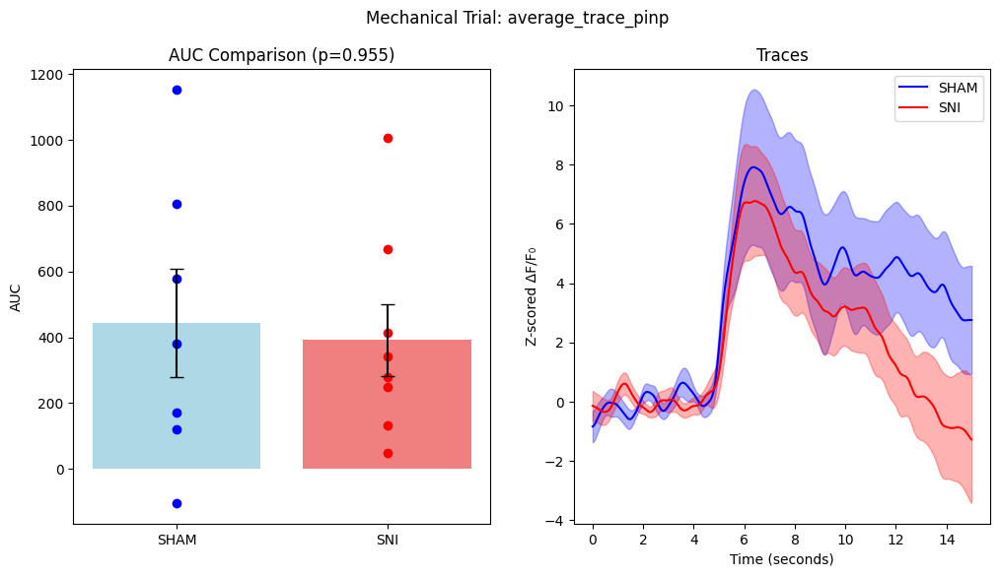

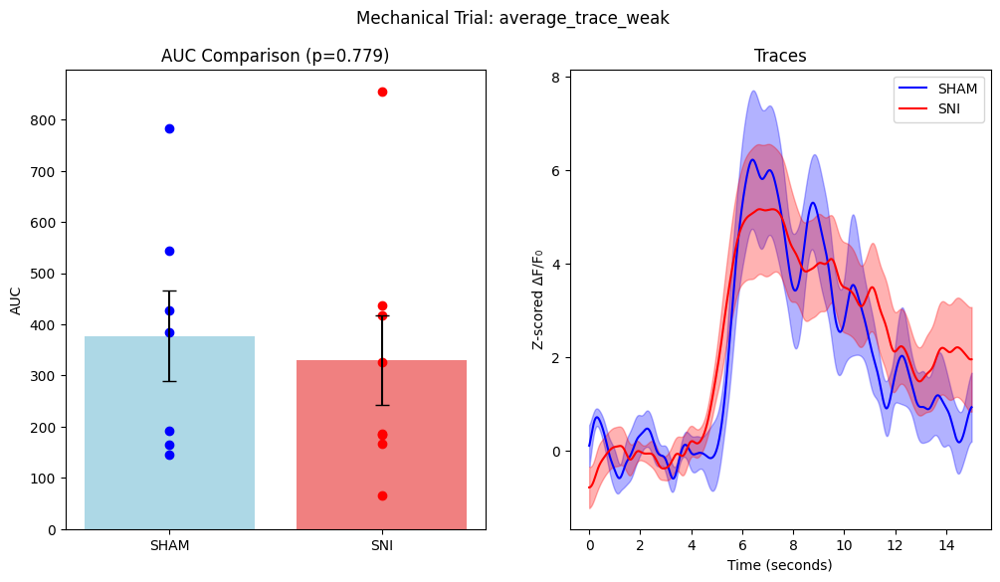

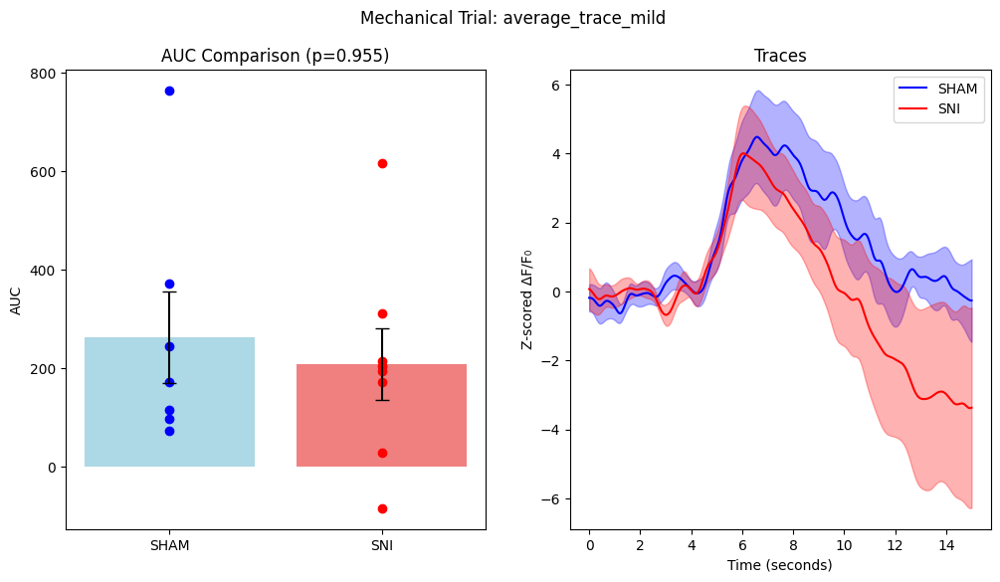

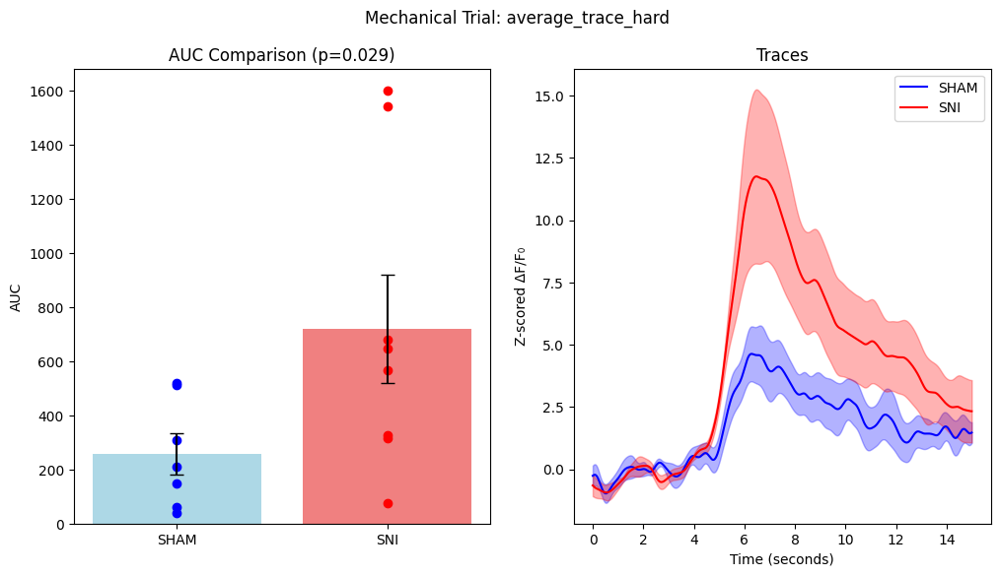

KeyError: 'average_trace_cold'

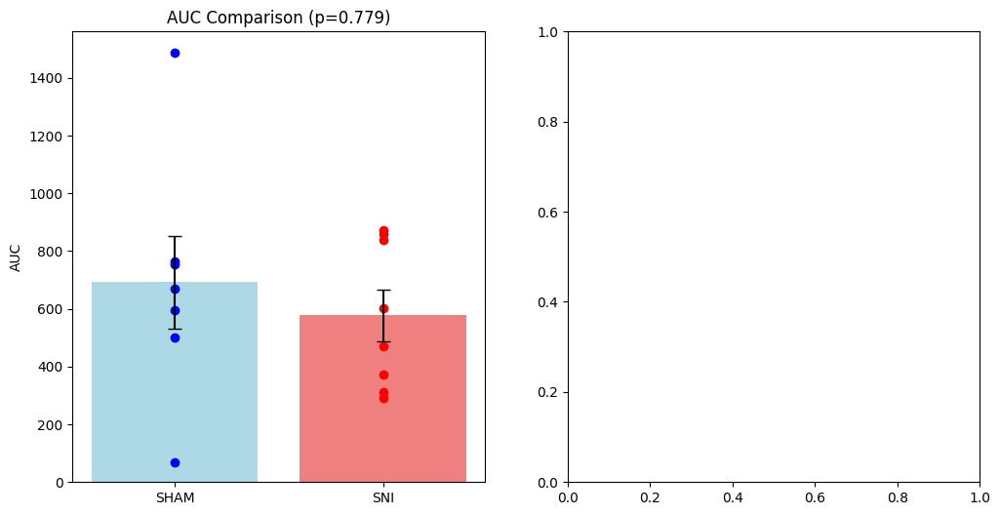

In [42]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, mannwhitneyu
from scipy.ndimage import uniform_filter1d
from scipy.integrate import trapz

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/grabda_trimmed/sham/'
sni_path = 'C:/files/data/sensory_stim/grabda_trimmed/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Function to z-score the data based on the baseline (first 5 seconds)
def z_score_trace(trace, baseline_start, baseline_end):
    baseline = trace[baseline_start:baseline_end]
    baseline_mean = np.mean(baseline)
    baseline_std = np.std(baseline)
    return (trace - baseline_mean) / baseline_std

# Extracting, smoothing, and z-scoring trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5, baseline_duration=5, sampling_rate=130):
    trials = {}
    baseline_end = int(baseline_duration * sampling_rate)
    
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                raw_trace = data.item()[trial]
                smoothed_trace = smooth_trace(raw_trace, window_size)
                z_scored_trace = z_score_trace(smoothed_trace, 0, baseline_end)
                animal_trials[trial] = z_scored_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate AUC after the stimulus onset
def calculate_auc_after_onset(data_per_animal, trial_types, sampling_rate, onset_time, end_time):
    auc_values = {}
    onset_index = int(onset_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        trial_auc = []
        for animal_data in data_per_animal.values():
            if trial in animal_data:
                trace = animal_data[trial]
                auc = trapz(trace[onset_index:end_index])
                trial_auc.append(auc)
        auc_values[trial] = trial_auc
    return auc_values

# Calculate AUC for each condition
sham_mechanical_auc = calculate_auc_after_onset(sham_mechanical_data, mechanical_trials, 130, 6.85, 7.35)
sni_mechanical_auc = calculate_auc_after_onset(sni_mechanical_data, mechanical_trials, 130, 6.85, 7.35)

sham_thermal_auc = calculate_auc_after_onset(sham_thermal_data, thermal_trials, 130, 6.85, 7.35)
sni_thermal_auc = calculate_auc_after_onset(sni_thermal_data, thermal_trials, 130, 6.85, 7.35)

# Function to perform statistical tests on AUC values
def compare_auc_conditions(sham_auc, sni_auc, trial_types):
    stats_results = {}
    
    for trial in trial_types:
        sham_auc_values = sham_auc[trial]
        sni_auc_values = sni_auc[trial]
        
        # Perform Mann-Whitney U test
        u_stat, p_value = mannwhitneyu(sham_auc_values, sni_auc_values)
        stats_results[trial] = (sham_auc_values, sni_auc_values, u_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials based on AUC
mechanical_auc_stats = compare_auc_conditions(sham_mechanical_auc, sni_mechanical_auc, mechanical_trials)
thermal_auc_stats = compare_auc_conditions(sham_thermal_auc, sni_thermal_auc, thermal_trials)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function for AUC comparison
def plot_auc_comparison(sham_auc, sni_auc, stats, trial_type, title):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI AUC values
    sham_auc_values, sni_auc_values, u_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[0].bar(['SHAM', 'SNI'], [np.mean(sham_auc_values), np.mean(sni_auc_values)], 
               yerr=[sem(sham_auc_values), sem(sni_auc_values)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[0].scatter(['SHAM']*len(sham_auc_values), sham_auc_values, color=color_sham)
    axs[0].scatter(['SNI']*len(sni_auc_values), sni_auc_values, color=color_sni)

    axs[0].set_title(f'AUC Comparison (p={p_value:.3f})')
    axs[0].set_ylabel('AUC')
    
    # Plot traces for reference
    sham_avg, sham_sem = sham_mechanical_avg_sem[trial_type]
    sni_avg, sni_sem = sni_mechanical_avg_sem[trial_type]
    
    time_axis = np.arange(len(sham_avg)) / 130
    
    axs[1].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[1].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[1].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[1].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[1].set_title('Traces')
    axs[1].set_xlabel('Time (seconds)')
    axs[1].set_ylabel('Z-scored ΔF/F₀')
    axs[1].legend()

    plt.suptitle(title)
    plt.savefig(f"{trial_type}_{title}_auc.png", format='png')
    plt.show()

# Plotting mechanical trials AUC comparison
for trial in mechanical_trials:
    plot_auc_comparison(sham_mechanical_auc, sni_mechanical_auc, mechanical_auc_stats, trial, f"Mechanical Trial: {trial}")

# Plotting thermal trials AUC comparison
for trial in thermal_trials:
    plot_auc_comparison(sham_thermal_auc, sni_thermal_auc, thermal_auc_stats, trial, f"Thermal Trial: {trial}")

# Pre-SHAM vs SHAM

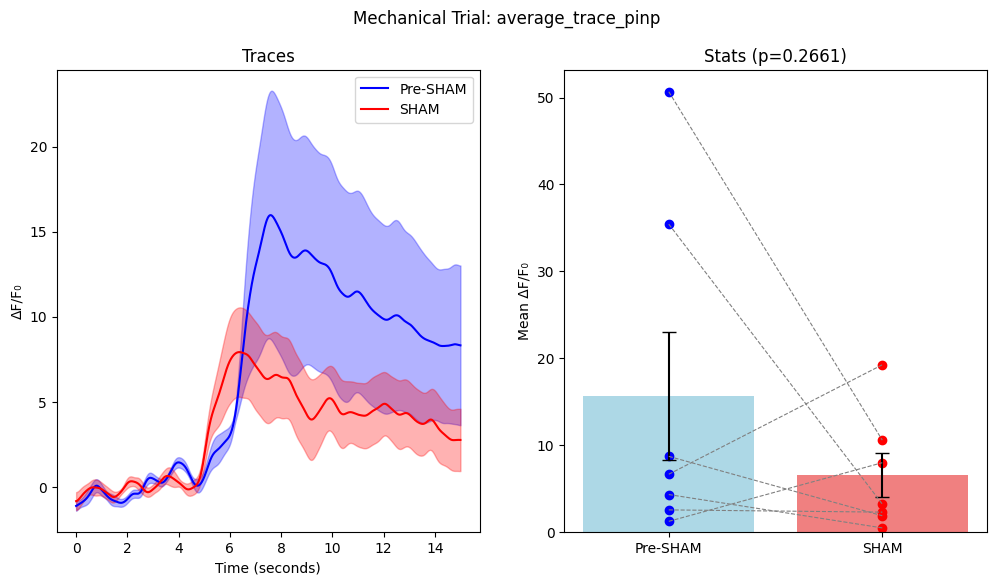

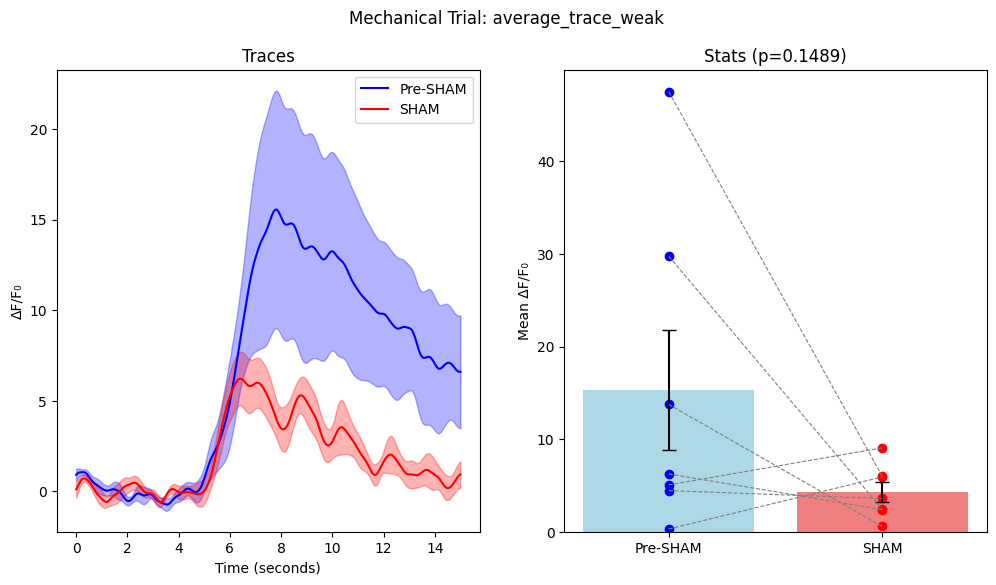

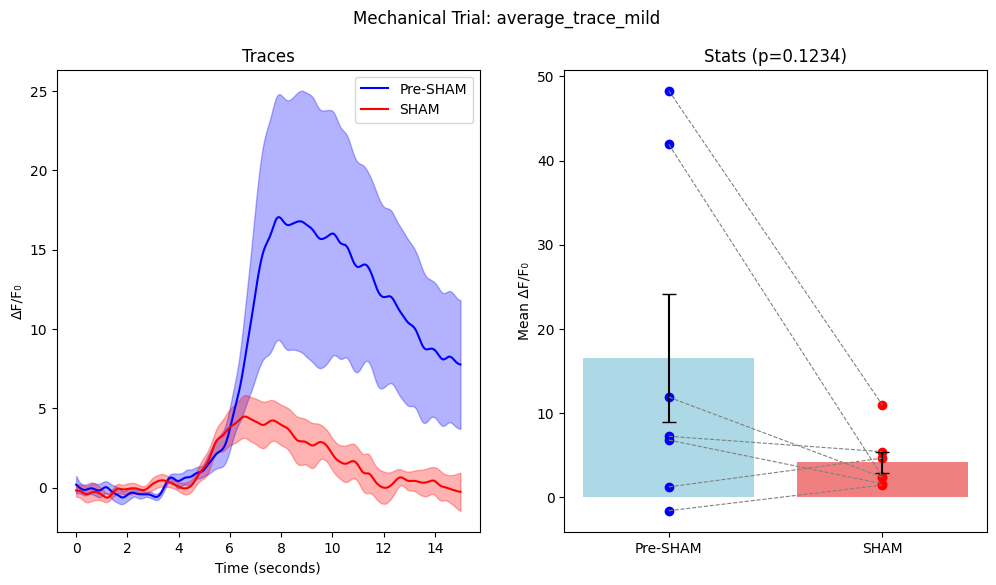

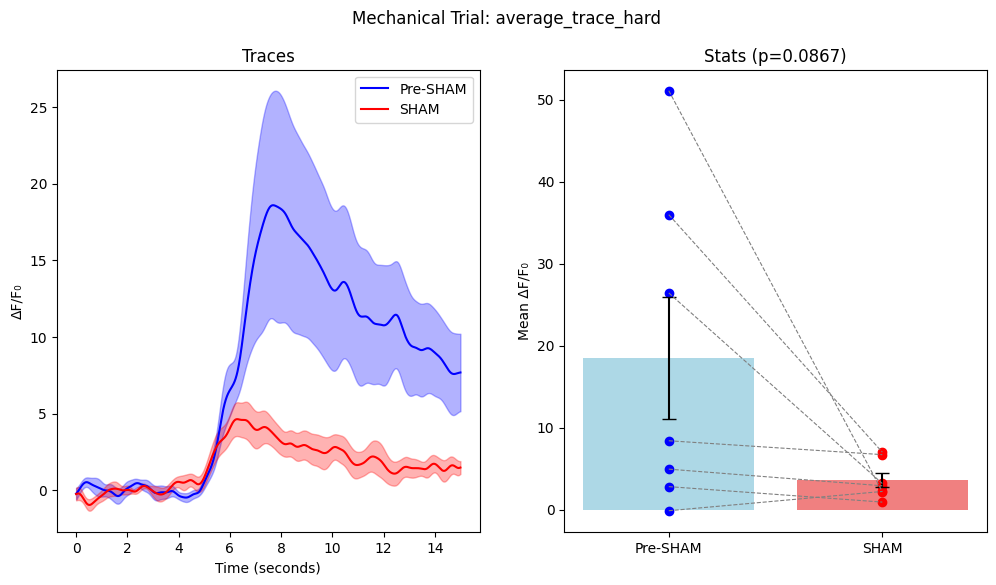

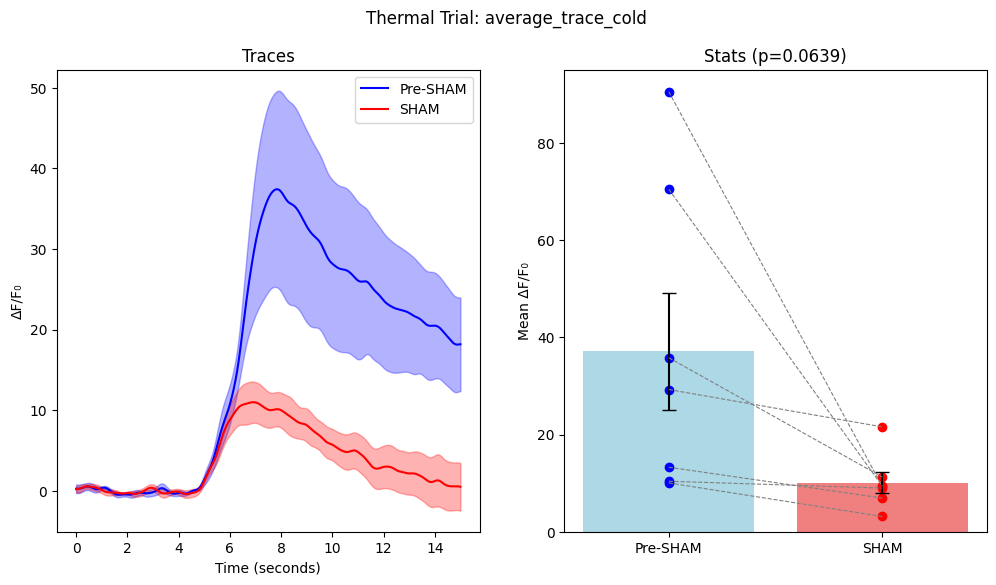

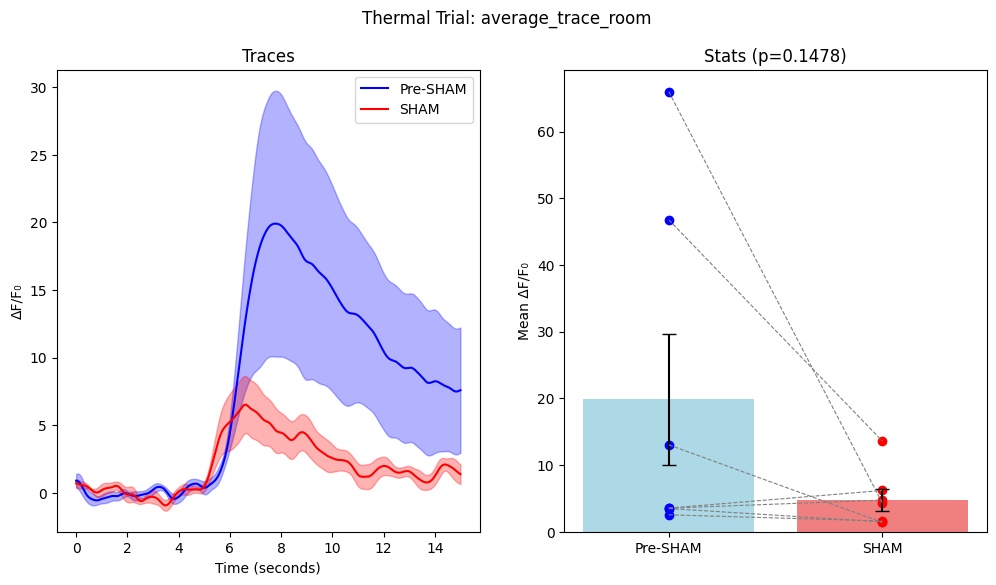

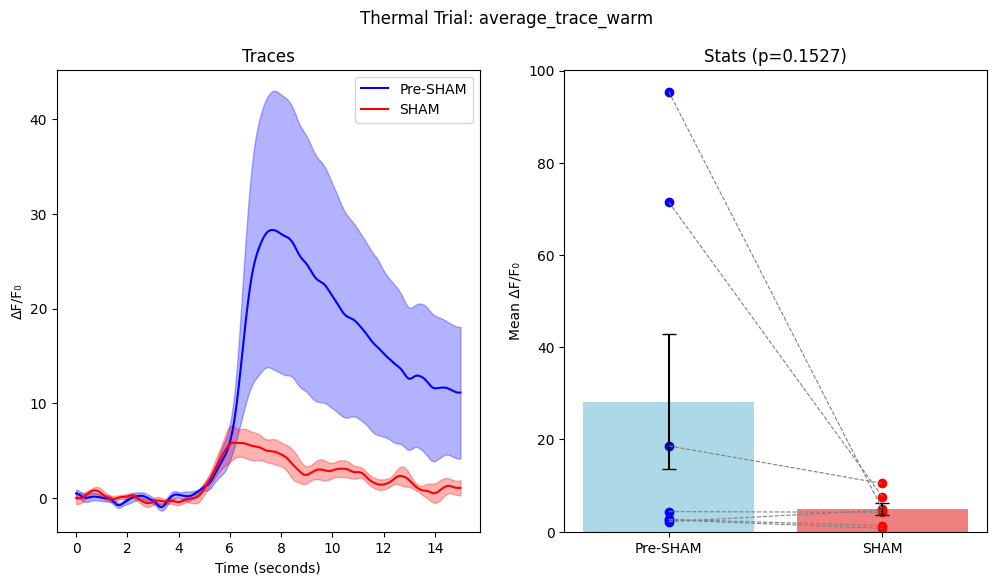

In [44]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind, ttest_rel
from scipy.ndimage import uniform_filter1d

 # Paths to the data directories
sham_path = r'C:\files\data\sensory_stim\grabda_zscored\sham_ctrl'
sni_path = r'C:\files\data\sensory_stim\grabda_zscored\sham'

""" sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/'

sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/' """

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Extracting and smoothing trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                smoothed_trace = smooth_trace(data.item()[trial], window_size)
                animal_trials[trial] = smoothed_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_rel(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.5, 8)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.5, 8)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='Pre-SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SHAM', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['Pre-SHAM', 'SHAM'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['Pre-SHAM']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['SHAM']*len(sni_means), sni_means, color=color_sni)
        # Connect paired data points between SHAM and SNI
    for i in range(len(sham_means)):
        axs[1].plot(['Pre-SHAM', 'SHAM'], [sham_means[i], sni_means[i]], color='gray', linestyle='--', linewidth=0.8)
    
    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Mean ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)


# Pre-SNI vs SNI

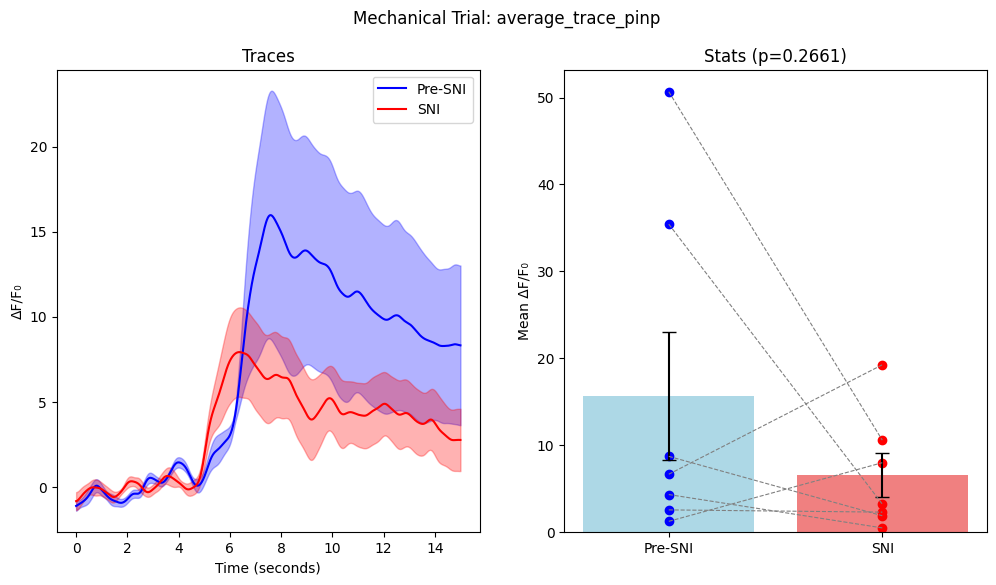

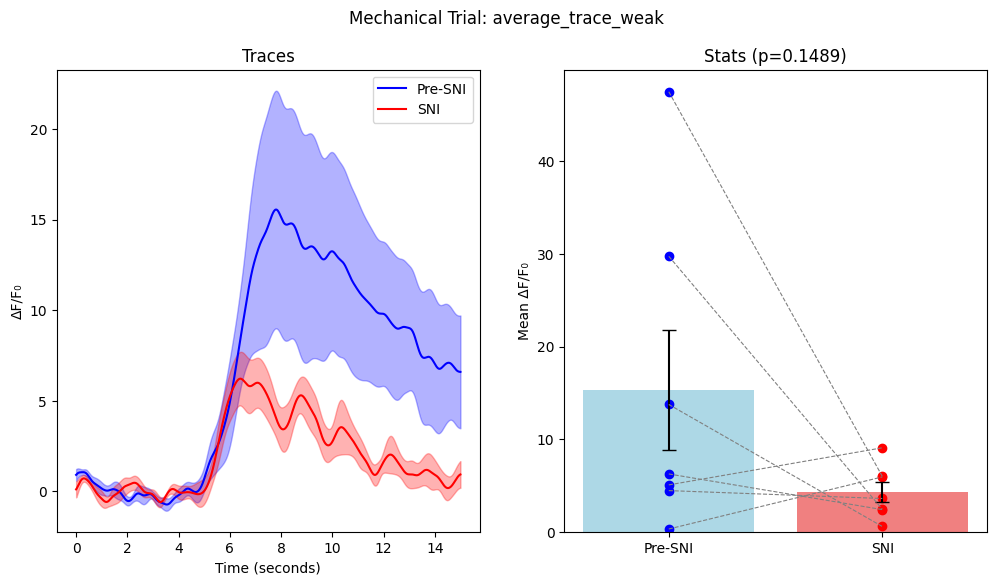

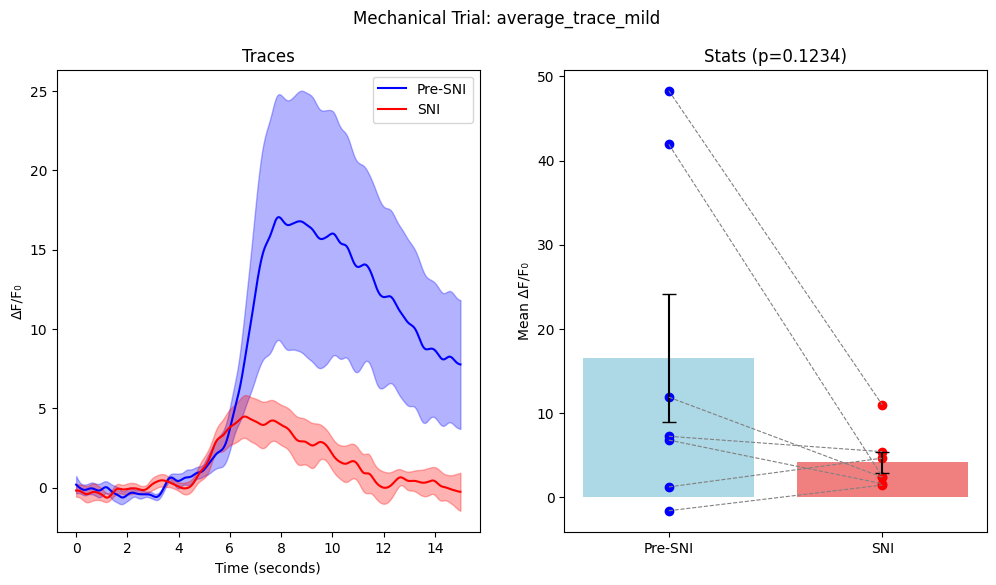

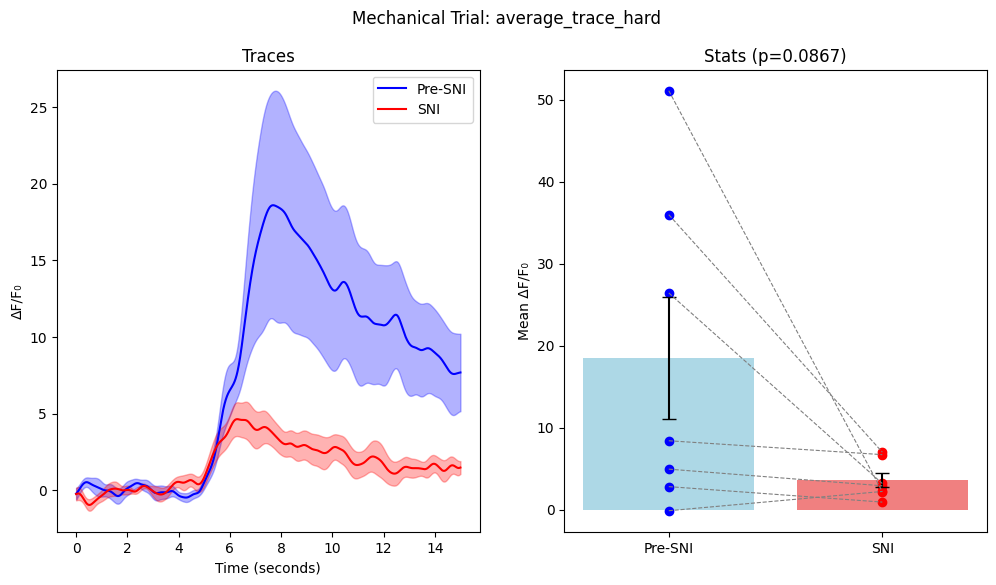

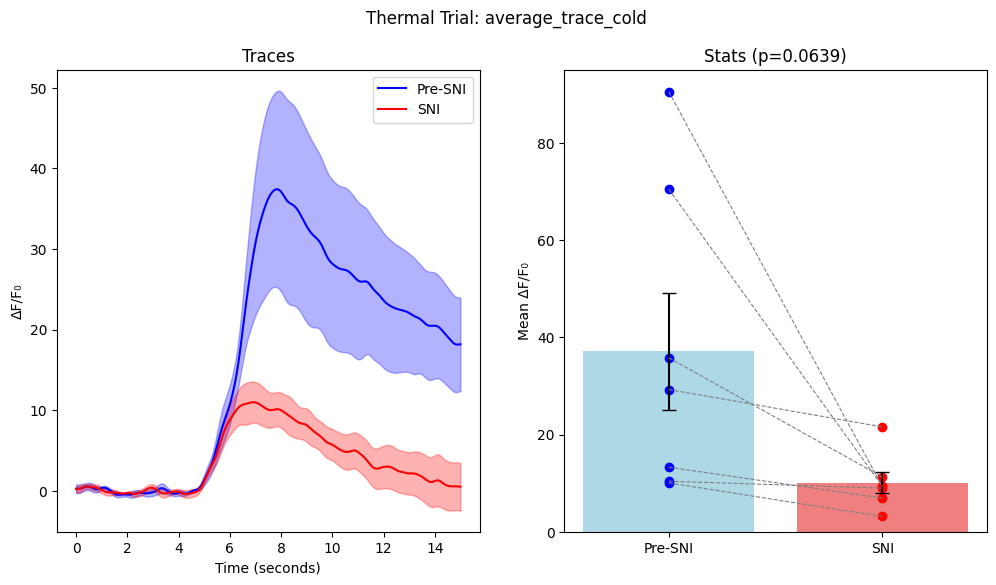

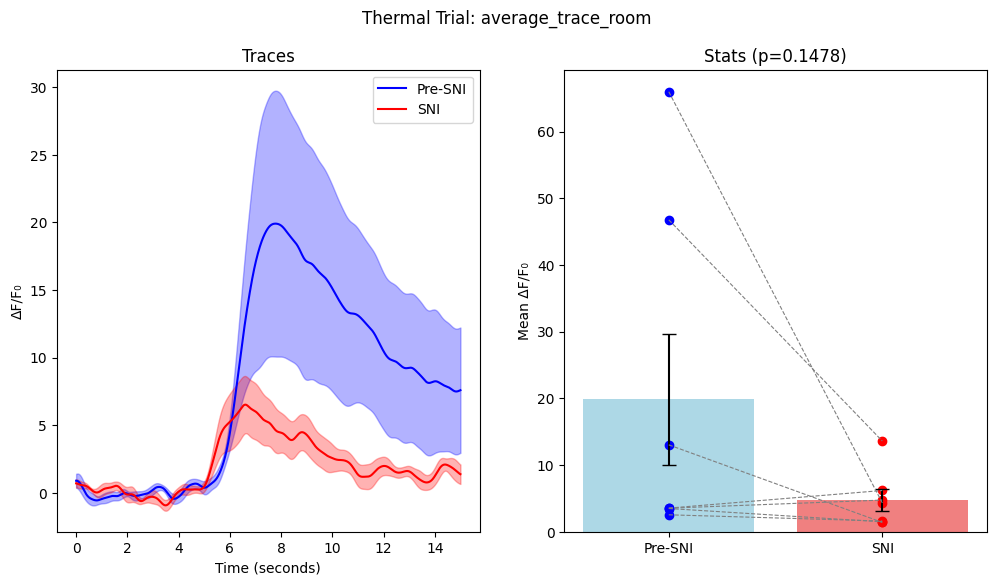

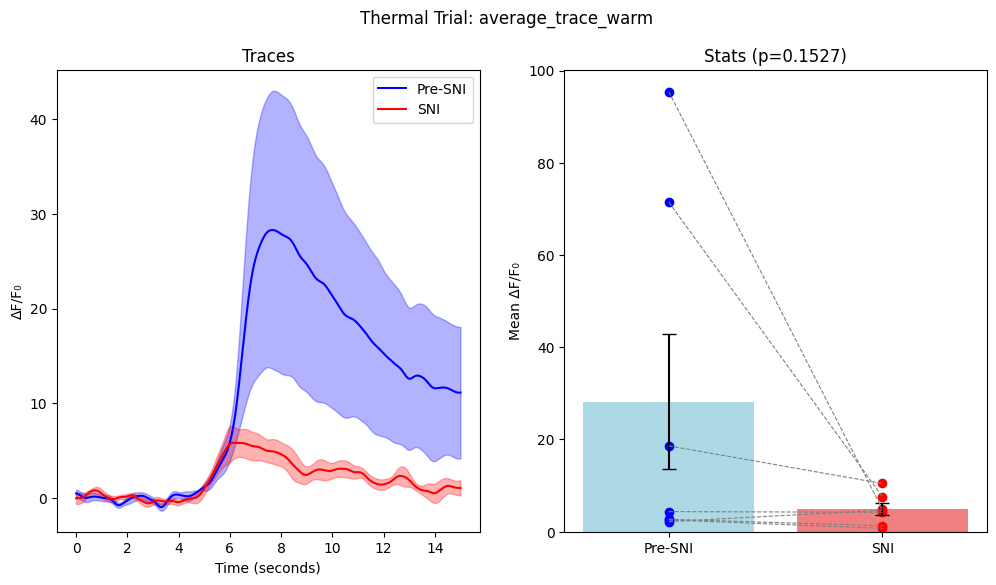

In [45]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind, ttest_rel
from scipy.ndimage import uniform_filter1d

 # Paths to the data directories
sham_path = r'C:\files\data\sensory_stim\grabda_zscored\sham_ctrl'
sni_path = r'C:\files\data\sensory_stim\grabda_zscored\sham'

""" sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/'

sham_path = 'C:/files/data/sensory_stim/astro/sni_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sni/' """

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Extracting and smoothing trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                smoothed_trace = smooth_trace(data.item()[trial], window_size)
                animal_trials[trial] = smoothed_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(data[trial][start_index:end_index]) for data in sham_data.values() if trial in data]
        sni_means = [np.mean(data[trial][start_index:end_index]) for data in sni_data.values() if trial in data]
        
        # Perform t-test
        t_stat, p_value = ttest_rel(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.5, 8)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.5, 8)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='Pre-SNI', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['Pre-SNI', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['Pre-SNI']*len(sham_means), sham_means, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color=color_sni)
        # Connect paired data points between SHAM and SNI
    for i in range(len(sham_means)):
        axs[1].plot(['Pre-SNI', 'SNI'], [sham_means[i], sni_means[i]], color='gray', linestyle='--', linewidth=0.8)
    
    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('Mean ΔF/F₀')
    
    plt.suptitle(title)
    #plt.savefig(f"{trial_type}_{title}.png", format='png')

    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)


# Pre-SNI vs SNI AUC

C:\Users\huang\AppData\Local\Temp\ipykernel_39340\653633859.py:82: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  sham_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate)
C:\Users\huang\AppData\Local\Temp\ipykernel_39340\653633859.py:84: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  sni_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate)


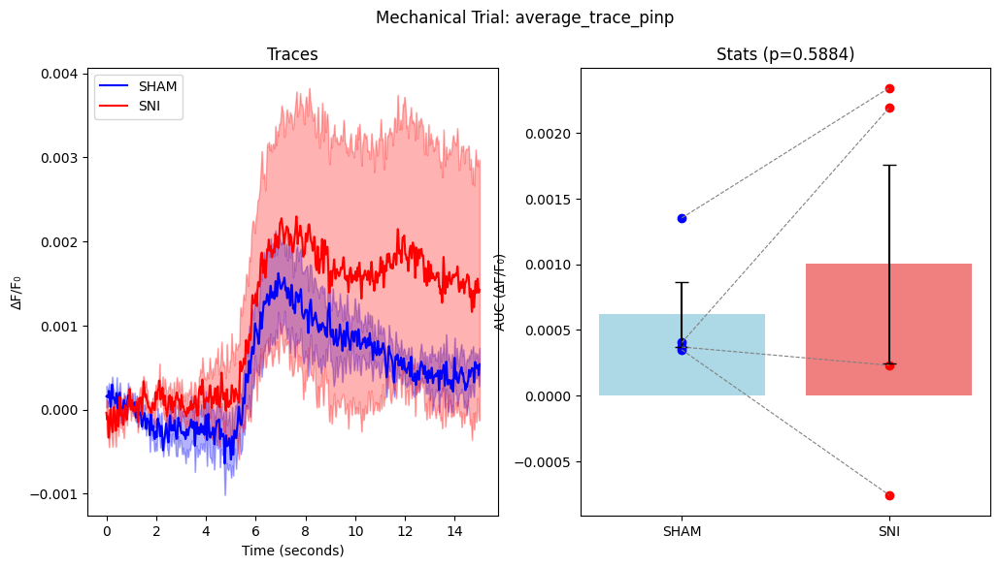

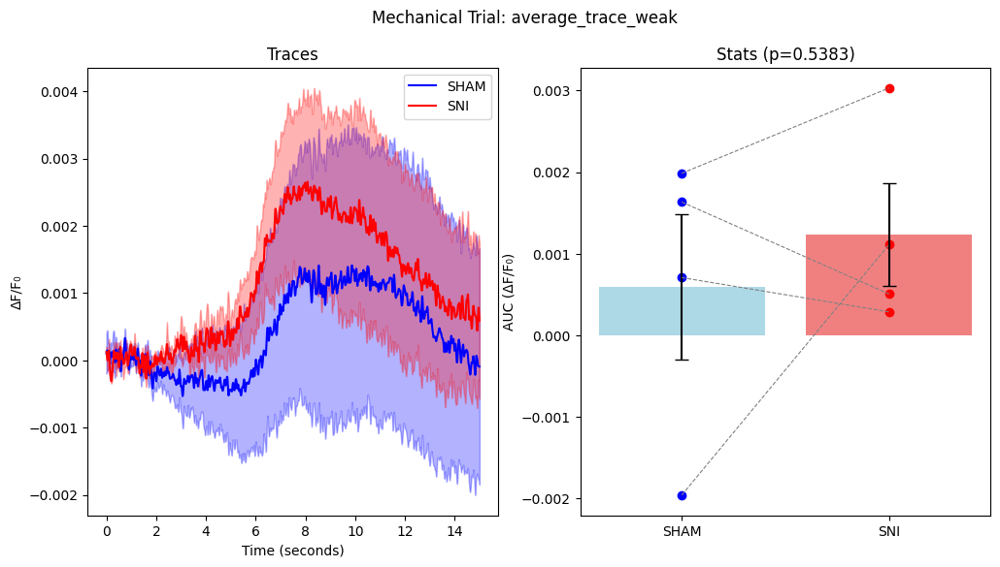

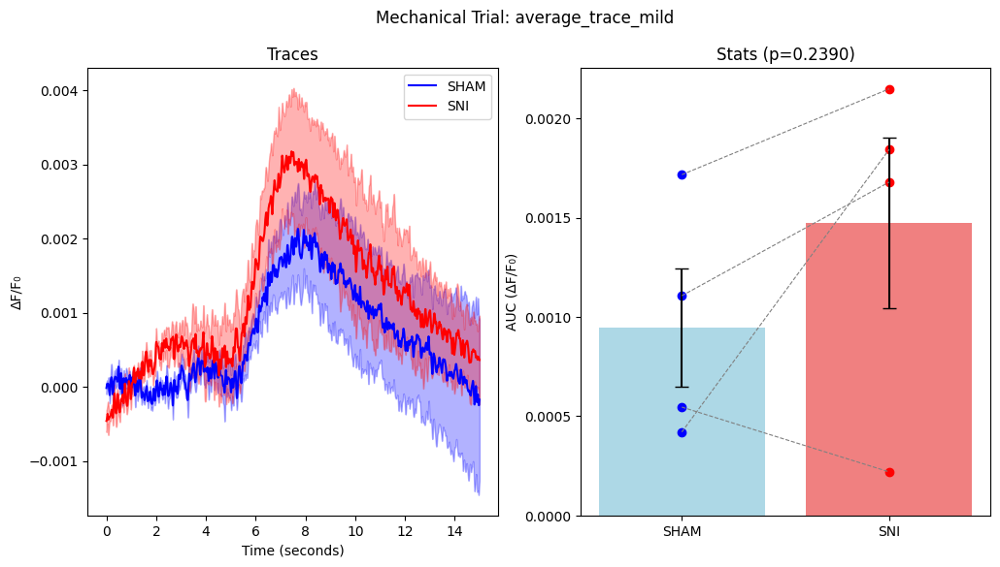

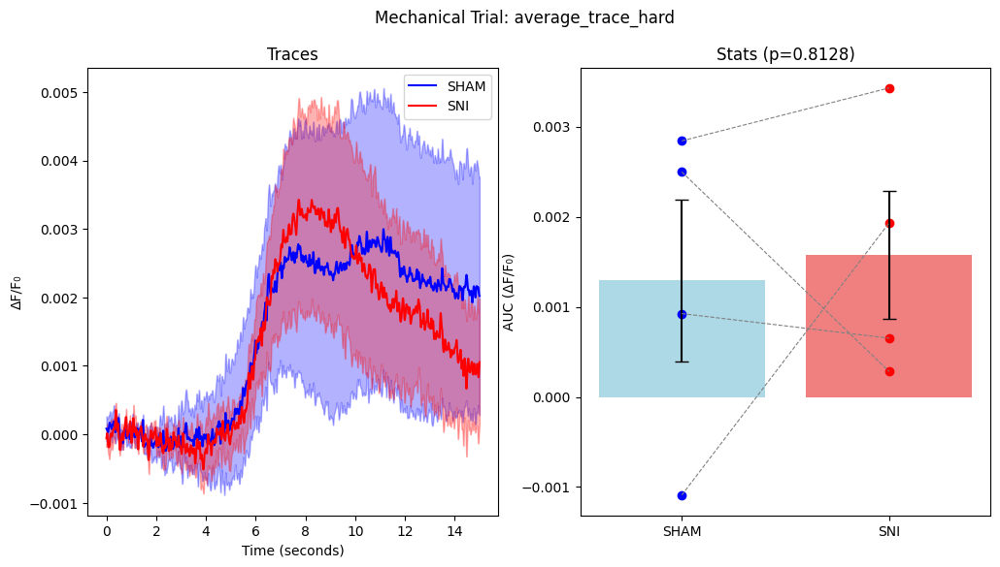

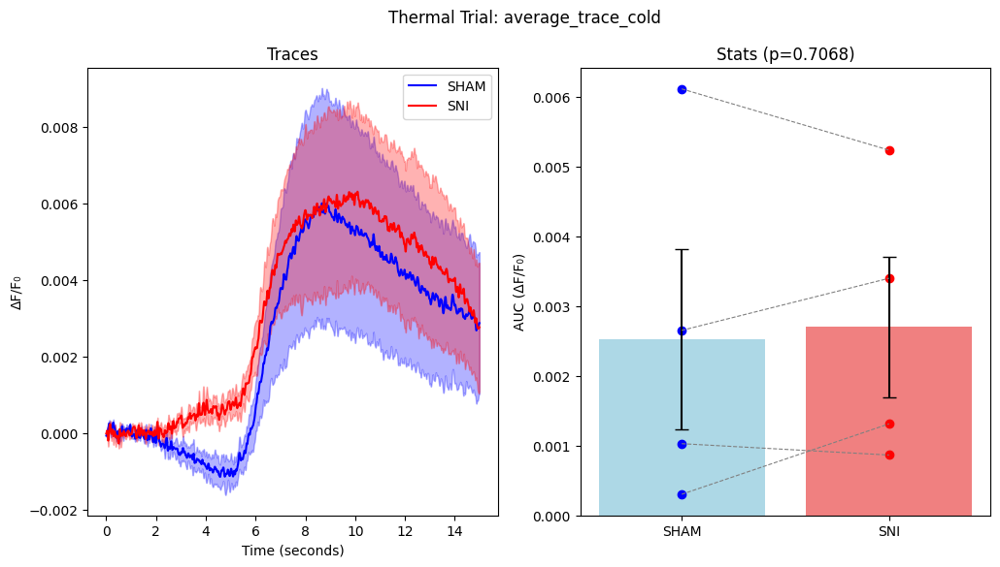

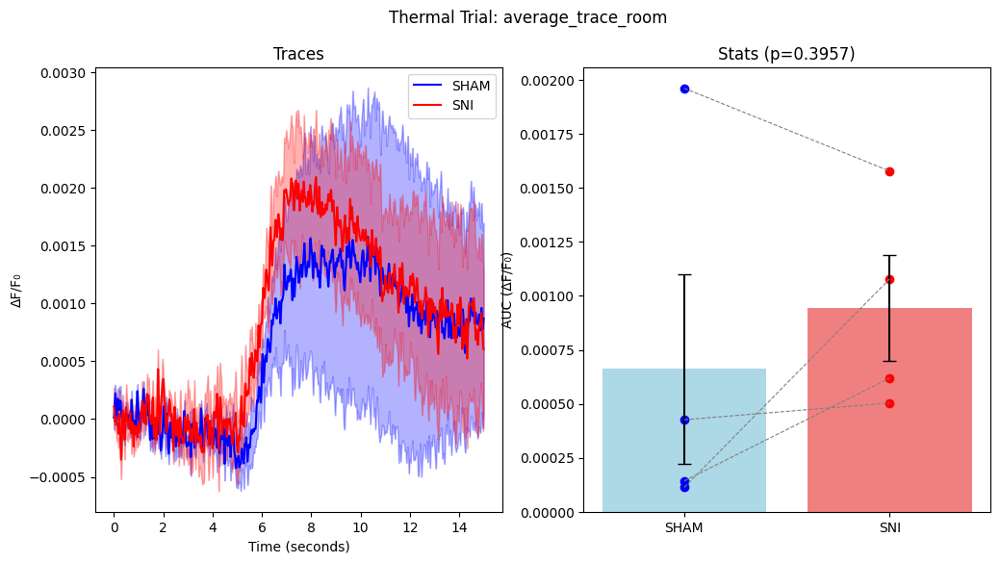

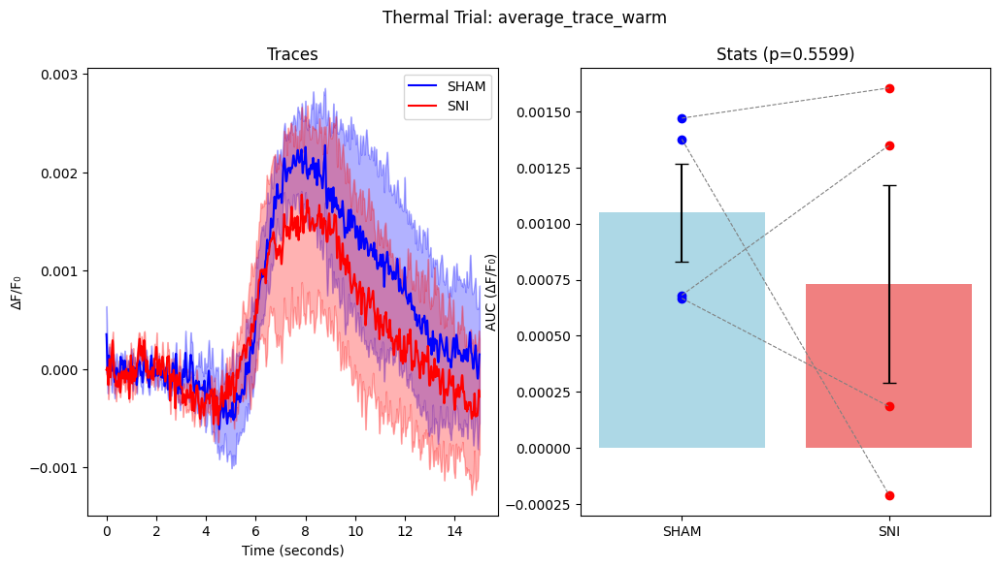

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_rel
from scipy.ndimage import uniform_filter1d



# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/astro/sham_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sham/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Extracting and smoothing trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                smoothed_trace = smooth_trace(data.item()[trial], window_size)
                animal_trials[trial] = smoothed_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate AUC in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate) 
                    for data in sham_data.values() if trial in data]
        sni_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate) 
                   for data in sni_data.values() if trial in data]
        
        # Perform t-test on AUC values
        t_stat, p_value = ttest_rel(sham_auc, sni_auc)
        stats_results[trial] = (sham_auc, sni_auc, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials using AUC
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.5, 8)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.5, 8)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (AUC and individual points)
    sham_auc, sni_auc, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_auc), np.mean(sni_auc)], 
               yerr=[sem(sham_auc), sem(sni_auc)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_auc), sham_auc, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_auc), sni_auc, color=color_sni)
    # Connect paired data points between SHAM and SNI
    for i in range(len(sham_auc)):
        axs[1].plot(['SHAM', 'SNI'], [sham_auc[i], sni_auc[i]], color='gray', linestyle='--', linewidth=0.8)

    
    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('AUC (ΔF/F₀)')
    
    plt.suptitle(title)

    plt.show()




# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)


SHAM Data Structure:
Animal: 516.npy
  Key: average_trace_pinp, Shape: (1950,)
  Key: average_trace_weak, Shape: (1950,)
  Key: average_trace_mild, Shape: (1950,)
  Key: average_trace_hard, Shape: (1950,)
  Key: average_trace_cold, Shape: (1950,)
  Key: average_trace_room, Shape: (1950,)
  Key: average_trace_warm, Shape: (1950,)
----
Animal: 519.npy
  Key: average_trace_pinp, Shape: (1950,)
  Key: average_trace_weak, Shape: (1950,)
  Key: average_trace_mild, Shape: (1950,)
  Key: average_trace_hard, Shape: (1950,)
  Key: average_trace_cold, Shape: (1950,)
  Key: average_trace_room, Shape: (1950,)
  Key: average_trace_warm, Shape: (1950,)
----

SNI Data Structure:
Animal: 517.npy
  Key: average_trace_pinp, Shape: (1950,)
  Key: average_trace_weak, Shape: (1950,)
  Key: average_trace_mild, Shape: (1950,)
  Key: average_trace_hard, Shape: (1950,)
  Key: average_trace_cold, Shape: (1950,)
  Key: average_trace_room, Shape: (1950,)
  Key: average_trace_warm, Shape: (1950,)
----
Animal: 518.n

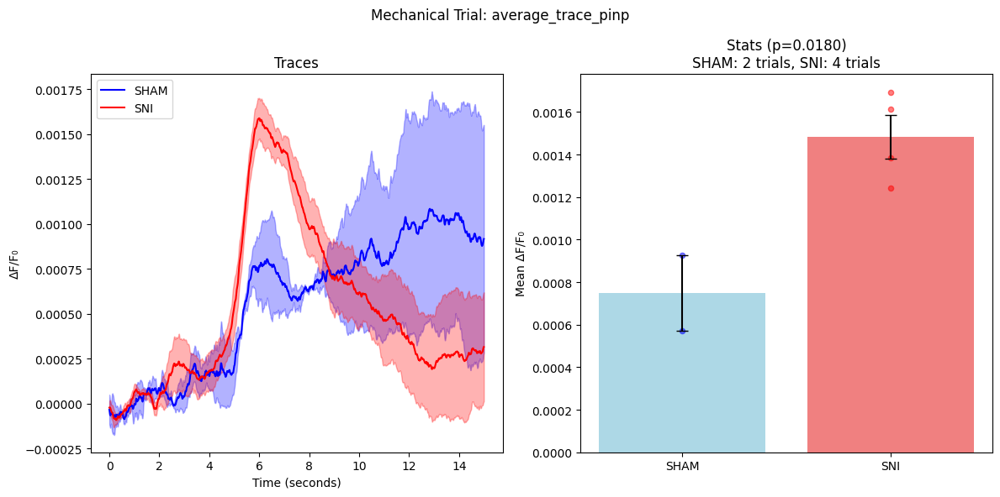

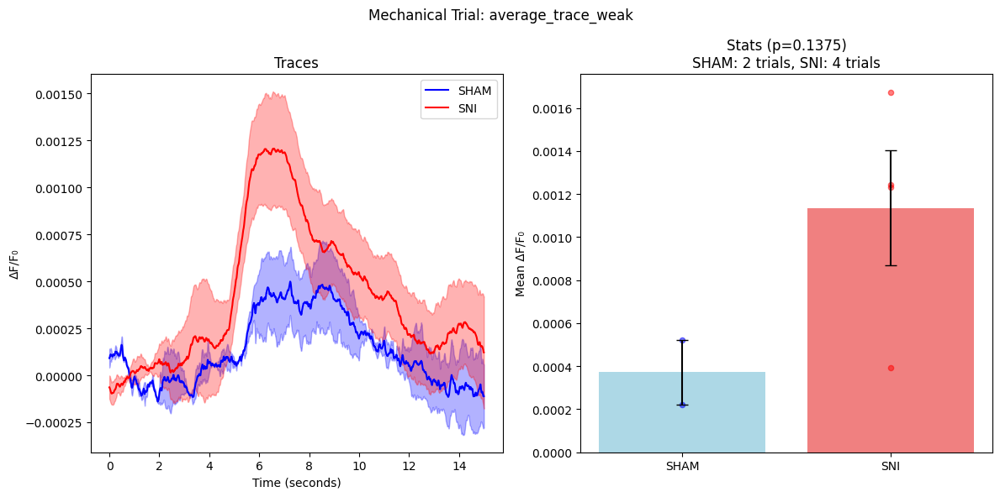

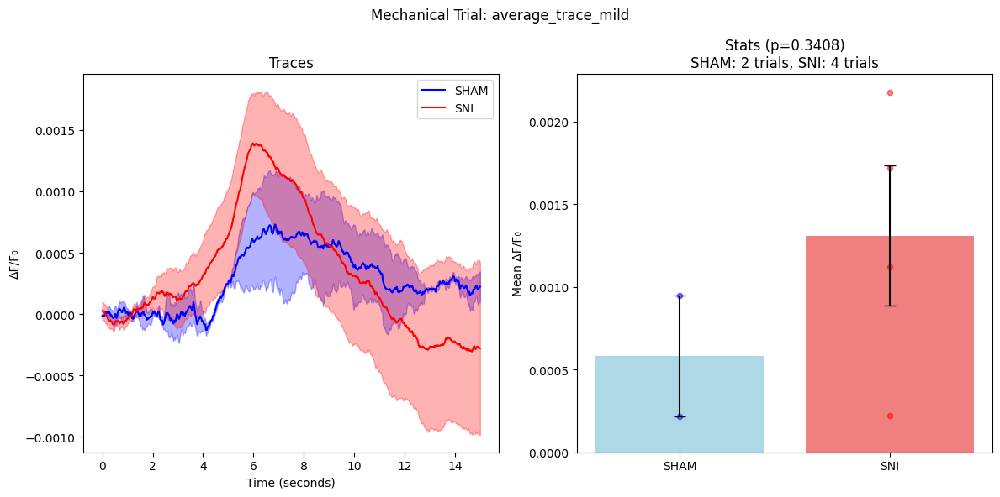

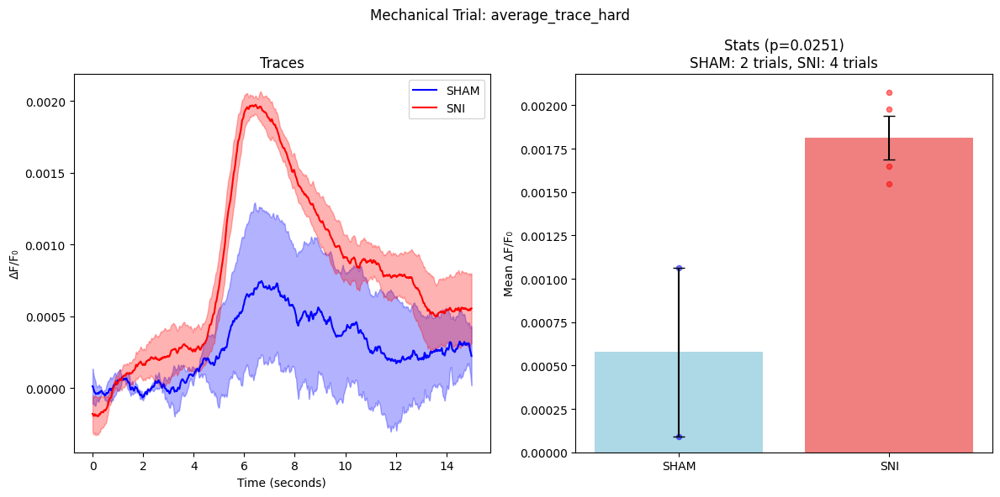

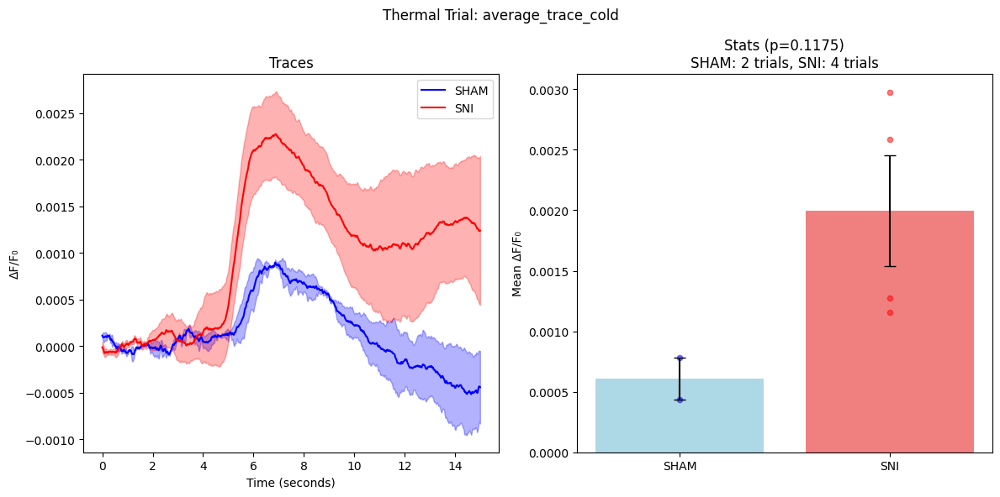

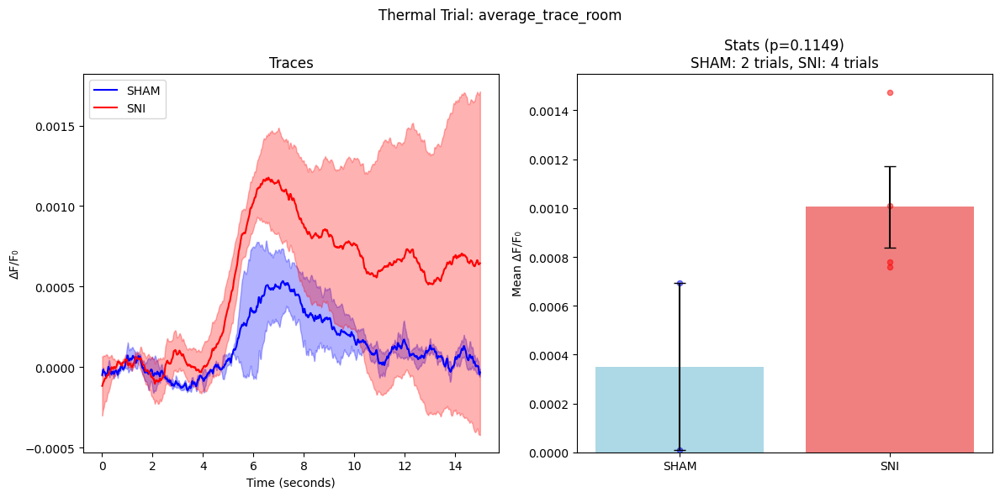

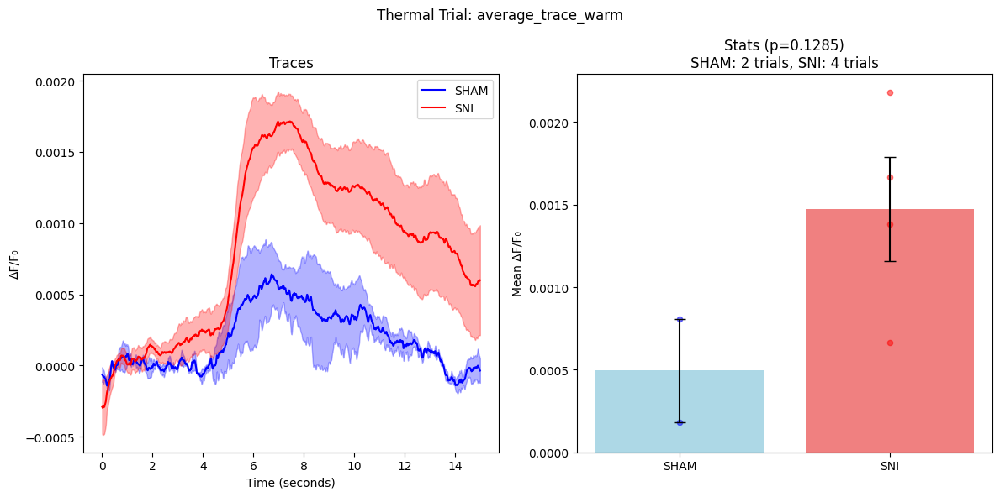

In [107]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/temp/sham/'
sni_path = 'C:/files/data/sensory_stim/temp/sni/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Debug function to inspect data structure
def inspect_data(data):
    for animal, animal_data in data.items():
        print(f"Animal: {animal}")
        if isinstance(animal_data.item(), dict):
            for key, value in animal_data.item().items():
                print(f"  Key: {key}, Shape: {np.array(value).shape}")
        else:
            print(f"  Data type: {type(animal_data.item())}")
        print("----")

# Inspect the data structure
print("SHAM Data Structure:")
inspect_data(sham_data)
print("\nSNI Data Structure:")
inspect_data(sni_data)

# Function to extract and smooth trials, pooling across animals
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    pooled_trials = {trial: [] for trial in trial_types}
    for animal, data in animal_data.items():
        if isinstance(data.item(), dict):
            for trial in trial_types:
                if trial in data.item():
                    trial_data = np.array(data.item()[trial])
                    if trial_data.ndim == 1:  # Single trial
                        smoothed_trace = smooth_trace(trial_data, window_size)
                        pooled_trials[trial].append(smoothed_trace)
                    elif trial_data.ndim == 2:  # Multiple trials
                        for single_trial in trial_data:
                            smoothed_trace = smooth_trace(single_trial, window_size)
                            pooled_trials[trial].append(smoothed_trace)
    return pooled_trials

# Extract and smooth trials for each condition
sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)
sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all trials
def calculate_avg_sem_across_trials(pooled_trials):
    avg_sem = {}
    for trial, trials_data in pooled_trials.items():
        trials_array = np.array(trials_data)
        avg, sem_val = np.mean(trials_array, axis=0), sem(trials_array, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_trials(sham_mechanical_data)
sni_mechanical_avg_sem = calculate_avg_sem_across_trials(sni_mechanical_data)
sham_thermal_avg_sem = calculate_avg_sem_across_trials(sham_thermal_data)
sni_thermal_avg_sem = calculate_avg_sem_across_trials(sni_thermal_data)

# Function to calculate mean in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_means = [np.mean(trace[start_index:end_index]) for trace in sham_data[trial]]
        sni_means = [np.mean(trace[start_index:end_index]) for trace in sni_data[trial]]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(sham_means, sni_means)
        stats_results[trial] = (sham_means, sni_means, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 5.5, 6.5)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 5.5, 6.5)

# Color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (mean +/- SEM and individual points)
    sham_means, sni_means, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_means), np.mean(sni_means)], 
               yerr=[sem(sham_means), sem(sni_means)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_means), sham_means, color=color_sham, alpha=0.5, s=20)
    axs[1].scatter(['SNI']*len(sni_means), sni_means, color=color_sni, alpha=0.5, s=20)
    
    axs[1].set_title(f'Stats (p={p_value:.4f})\nSHAM: {len(sham_means)} trials, SNI: {len(sni_means)} trials')
    axs[1].set_ylabel('Mean ΔF/F₀')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)

C:\Users\huang\AppData\Local\Temp\ipykernel_56564\3500226428.py:80: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  sham_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate)
C:\Users\huang\AppData\Local\Temp\ipykernel_56564\3500226428.py:82: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  sni_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate)


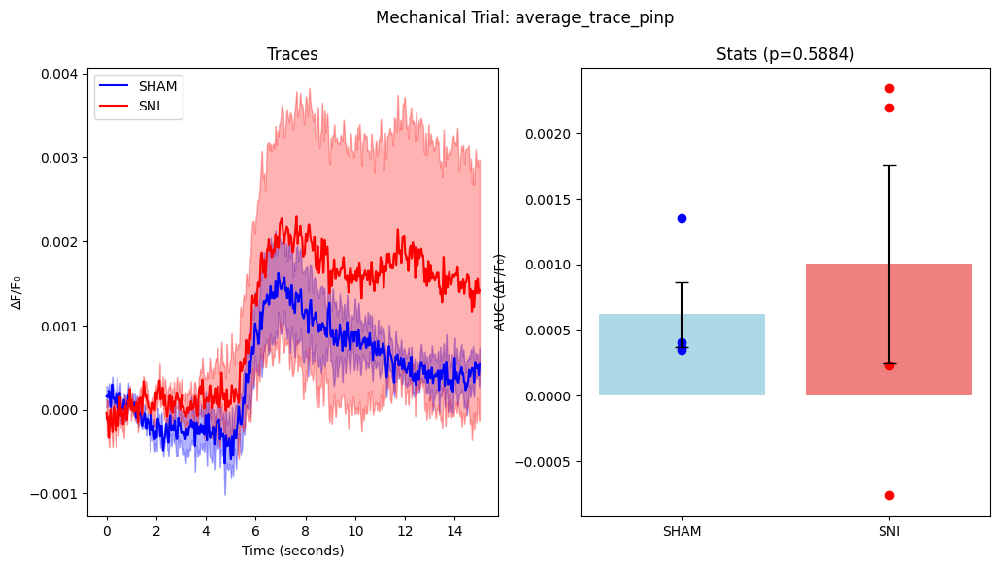

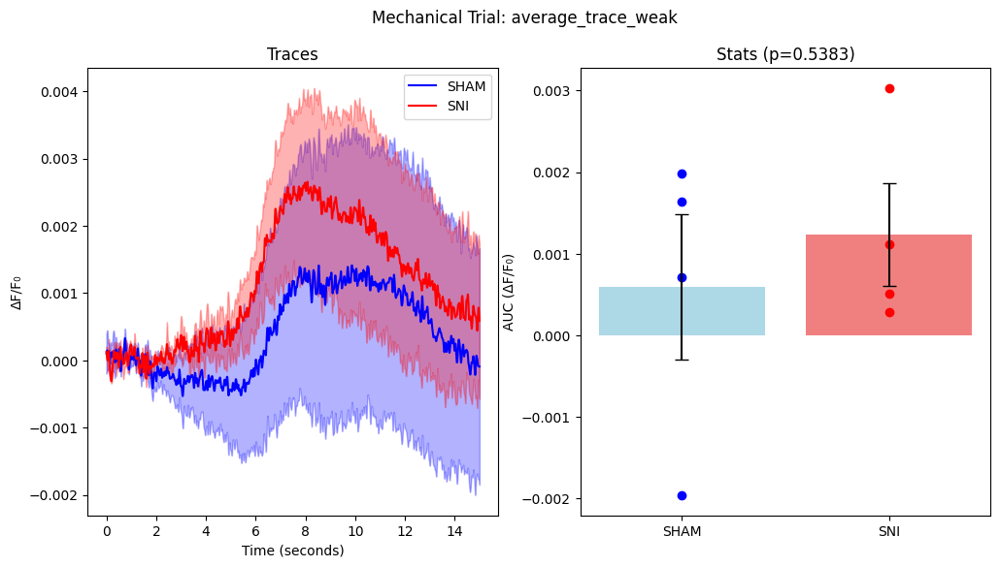

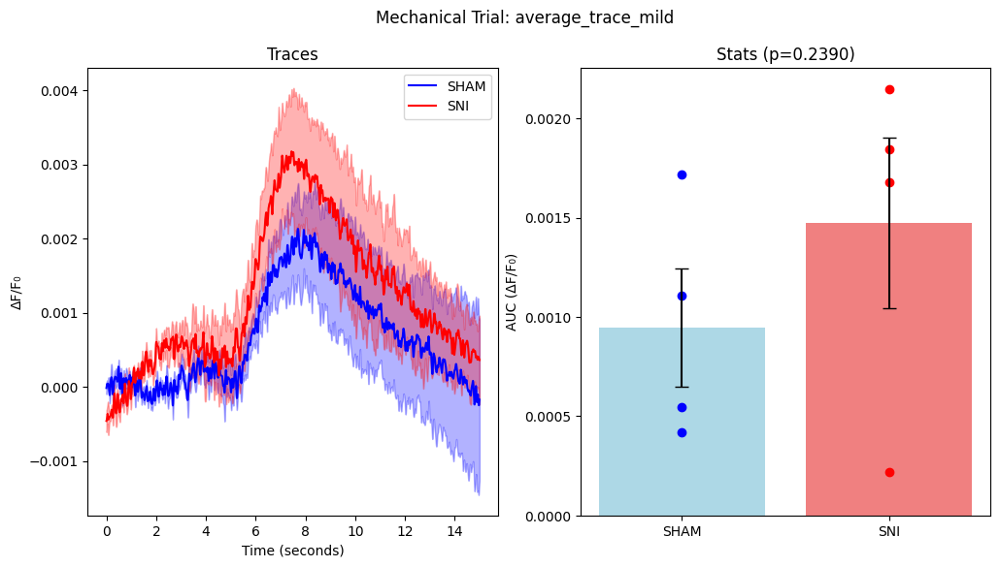

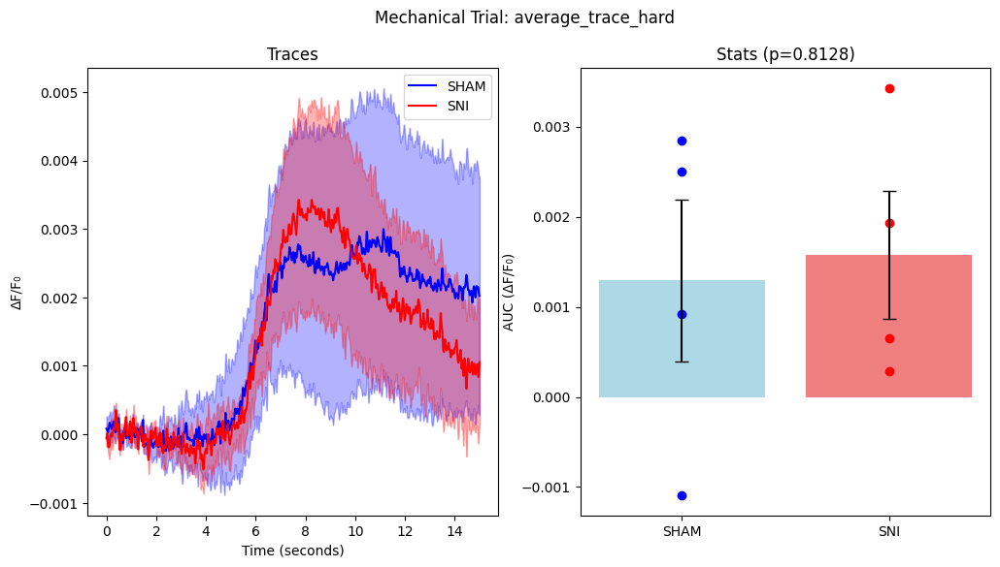

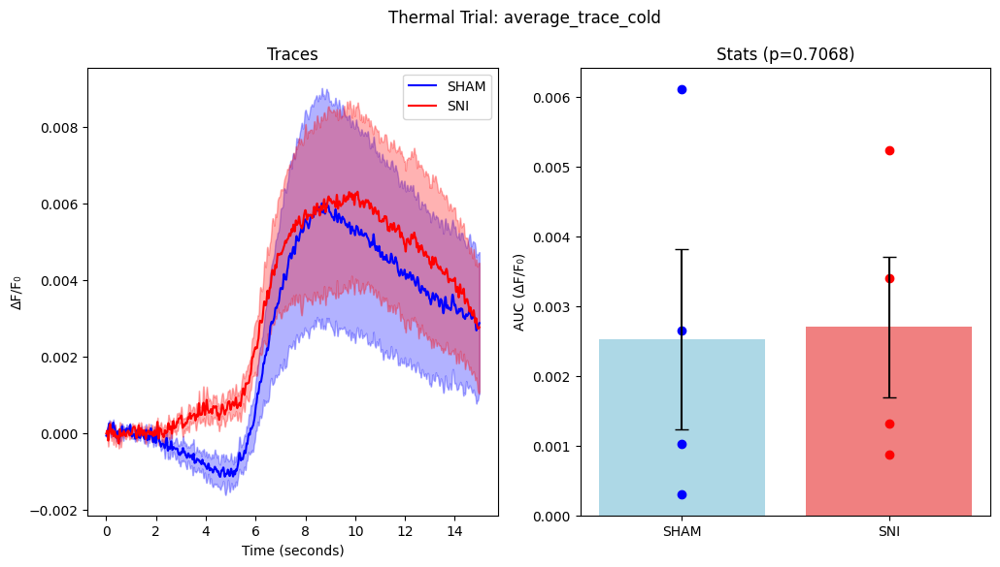

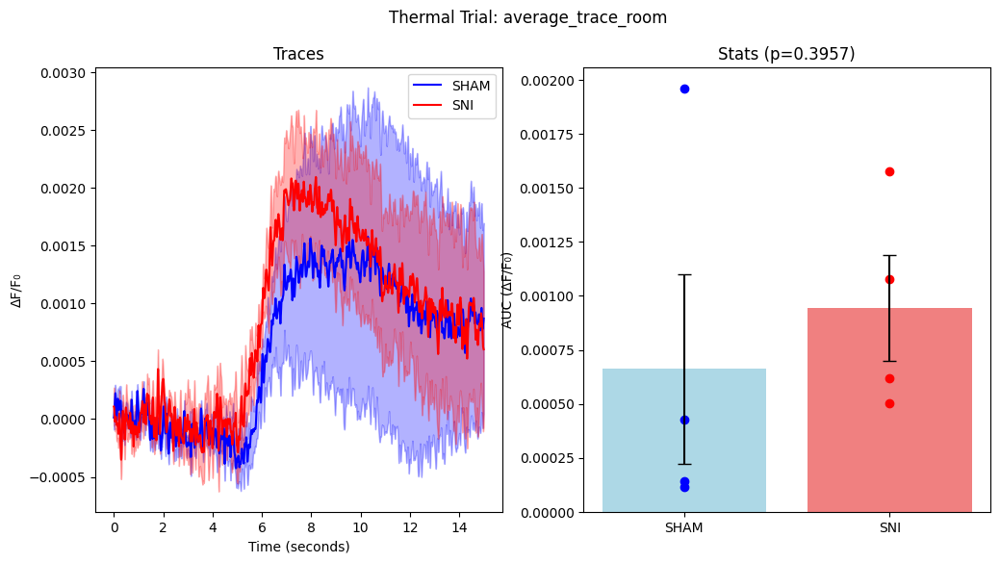

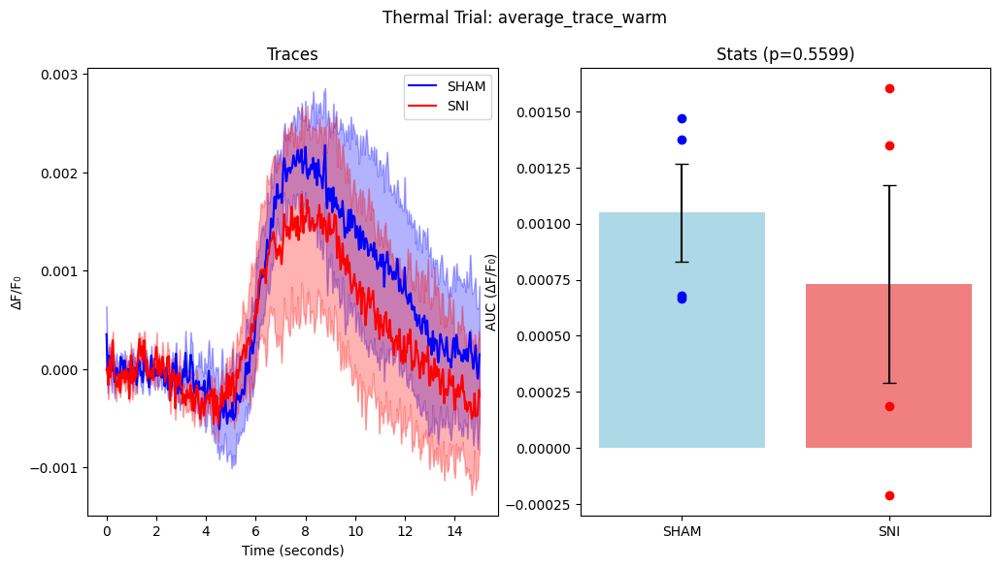

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_rel
from scipy.ndimage import uniform_filter1d

# Paths to the data directories
sham_path = 'C:/files/data/sensory_stim/astro/sham_ctrl/'
sni_path = 'C:/files/data/sensory_stim/astro/sham/'

# Function to load the data
def load_data(path):
    return {animal: np.load(os.path.join(path, animal), allow_pickle=True) 
            for animal in os.listdir(path) if animal.endswith('.npy')}

# Load SHAM and SNI data
sham_data = load_data(sham_path)
sni_data = load_data(sni_path)

# Define trial types
mechanical_trials = ['average_trace_pinp', 'average_trace_weak', 'average_trace_mild', 'average_trace_hard']
thermal_trials = ['average_trace_cold', 'average_trace_room', 'average_trace_warm']

# Function to extract trials for each animal
def extract_trials_per_animal(animal_data, trial_types):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                animal_trials[trial] = data.item()[trial]
        trials[animal] = animal_trials
    return trials

# Function to apply smoothing to the data
def smooth_trace(trace, window_size=1):
    return uniform_filter1d(trace, size=window_size)

# Extracting and smoothing trials for each condition
def extract_and_smooth_trials(animal_data, trial_types, window_size=5):
    trials = {}
    for animal, data in animal_data.items():
        animal_trials = {}
        for trial in trial_types:
            if isinstance(data.item(), dict) and trial in data.item():
                smoothed_trace = smooth_trace(data.item()[trial], window_size)
                animal_trials[trial] = smoothed_trace
        trials[animal] = animal_trials
    return trials

sham_mechanical_data = extract_and_smooth_trials(sham_data, mechanical_trials)
sni_mechanical_data = extract_and_smooth_trials(sni_data, mechanical_trials)

sham_thermal_data = extract_and_smooth_trials(sham_data, thermal_trials)
sni_thermal_data = extract_and_smooth_trials(sni_data, thermal_trials)

# Function to calculate average and SEM across all animals for each trial type
def calculate_avg_sem_across_animals(data_per_animal, trial_types):
    avg_sem = {}
    for trial in trial_types:
        trial_data = np.array([animal_data[trial] for animal_data in data_per_animal.values() if trial in animal_data])
        avg, sem_val = np.mean(trial_data, axis=0), sem(trial_data, axis=0)
        avg_sem[trial] = (avg, sem_val)
    return avg_sem

# Calculate average and SEM for each condition
sham_mechanical_avg_sem = calculate_avg_sem_across_animals(sham_mechanical_data, mechanical_trials)
sni_mechanical_avg_sem = calculate_avg_sem_across_animals(sni_mechanical_data, mechanical_trials)

sham_thermal_avg_sem = calculate_avg_sem_across_animals(sham_thermal_data, thermal_trials)
sni_thermal_avg_sem = calculate_avg_sem_across_animals(sni_thermal_data, thermal_trials)

# Function to calculate AUC in the specified index range and perform statistical tests
def compare_conditions(sham_data, sni_data, trial_types, sampling_rate, start_time, end_time):
    stats_results = {}
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)
    
    for trial in trial_types:
        sham_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate) 
                    for data in sham_data.values() if trial in data]
        sni_auc = [np.trapz(data[trial][start_index:end_index], dx=1/sampling_rate) 
                   for data in sni_data.values() if trial in data]
        
        # Perform t-test on AUC values
        t_stat, p_value = ttest_rel(sham_auc, sni_auc)
        stats_results[trial] = (sham_auc, sni_auc, t_stat, p_value)
    
    return stats_results

# Compare SHAM and SNI for mechanical and thermal trials using AUC
mechanical_stats = compare_conditions(sham_mechanical_data, sni_mechanical_data, mechanical_trials, 130, 7.5, 8)
thermal_stats = compare_conditions(sham_thermal_data, sni_thermal_data, thermal_trials, 130, 7.5, 8)

# Updated color codes
color_sham = 'blue'
color_sni = 'red'
light_color_sham = '#add8e6'  # Light blue
light_color_sni = '#f08080'   # Light red

# Plotting function
def plot_comparison(sham_data, sni_data, stats, trial_type, title, sampling_rate):
    time_axis = np.arange(len(sham_data[trial_type][0])) / sampling_rate
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot SHAM and SNI traces
    sham_avg, sham_sem = sham_data[trial_type]
    sni_avg, sni_sem = sni_data[trial_type]
    
    axs[0].plot(time_axis, sham_avg, label='SHAM', color=color_sham)
    axs[0].fill_between(time_axis, sham_avg - sham_sem, sham_avg + sham_sem, color=color_sham, alpha=0.3)
    
    axs[0].plot(time_axis, sni_avg, label='SNI', color=color_sni)
    axs[0].fill_between(time_axis, sni_avg - sni_sem, sni_avg + sni_sem, color=color_sni, alpha=0.3)
    
    axs[0].set_title('Traces')
    axs[0].set_xlabel('Time (seconds)')
    axs[0].set_ylabel('ΔF/F₀')
    axs[0].legend()

    # Plot stats (AUC and individual points)
    sham_auc, sni_auc, t_stat, p_value = stats[trial_type]
    
    # Plot bars first
    axs[1].bar(['SHAM', 'SNI'], [np.mean(sham_auc), np.mean(sni_auc)], 
               yerr=[sem(sham_auc), sem(sni_auc)], capsize=5, color=[light_color_sham, light_color_sni])
    
    # Plot individual data points on top of bars
    axs[1].scatter(['SHAM']*len(sham_auc), sham_auc, color=color_sham)
    axs[1].scatter(['SNI']*len(sni_auc), sni_auc, color=color_sni)
    
    axs[1].set_title(f'Stats (p={p_value:.4f})')
    axs[1].set_ylabel('AUC (ΔF/F₀)')
    
    plt.suptitle(title)
    plt.show()

# Plotting mechanical trials
for trial in mechanical_trials:
    plot_comparison(sham_mechanical_avg_sem, sni_mechanical_avg_sem, mechanical_stats, trial, f"Mechanical Trial: {trial}", 130)

# Plotting thermal trials
for trial in thermal_trials:
    plot_comparison(sham_thermal_avg_sem, sni_thermal_avg_sem, thermal_stats, trial, f"Thermal Trial: {trial}", 130)
